# <center> **Stock Price Prediction Using Timeseries and Deep Learning Models** </center>

# **Data Preprocessing**

The data we are using here is last five years stocks data of 3 different stocks, namely: Apple, Infosys and Paramount Skydance which has been taken using `yfinance` API.
A total of 5 years data is taken for each stock and they have the following column headers:
- Date: The trading date.
- Open: Opening price of the index on that date
- High: Highest price of the index on that date
- Low: Lowest price of the index on that date
- Close: Closing price of the index on that date
- Volume: Number of shares traded on that date.

In this notebook, we will clean the merged csv files and perform some exploratory data analysis on it.

NOTE: In this Notebook file, AAPL -> Apple, INFY -> Infosys and PSKY -> Paramount Skydance.

## Importing Necessary Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

My train and test data.

In [5]:
import yfinance as yf

AAPL = yf.download("AAPL",start = "2020-07-14", end = "2025-07-14")
AAPL.columns = ["Close", "High","Low","Open","Volume"]

INFY = yf.download("INFY",start = "2020-07-14", end = "2025-07-14")
INFY.columns = ["Close", "High","Low","Open","Volume"]

PSKY = yf.download("PSKY",start = "2020-07-14", end = "2025-07-14")
PSKY.columns = ["Close", "High","Low","Open","Volume"]

/tmp/ipython-input-788880549.py:3: FutureWarning: YF.download() has changed argument auto_adjust default to True
  AAPL = yf.download("AAPL",start = "2020-07-14", end = "2025-07-14")
[*********************100%***********************]  1 of 1 completed
/tmp/ipython-input-788880549.py:6: FutureWarning: YF.download() has changed argument auto_adjust default to True
  INFY = yf.download("INFY",start = "2020-07-14", end = "2025-07-14")
[*********************100%***********************]  1 of 1 completed
/tmp/ipython-input-788880549.py:9: FutureWarning: YF.download() has changed argument auto_adjust default to True
  PSKY = yf.download("PSKY",start = "2020-07-14", end = "2025-07-14")
[*********************100%***********************]  1 of 1 completed


Now, we'll inspect any one of the dataframes to see that our conversion worked.

In [3]:
AAPL.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1255 entries, 2020-07-14 to 2025-07-11
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Close   1255 non-null   float64
 1   High    1255 non-null   float64
 2   Low     1255 non-null   float64
 3   Open    1255 non-null   float64
 4   Volume  1255 non-null   int64  
dtypes: float64(4), int64(1)
memory usage: 58.8 KB


In [4]:
display("Apple", AAPL.head())
display("Infosys", INFY.head())
display("Paramount Skydance", PSKY.head())

'Apple'

,Close,High,Low,Open,Volume
Date,,,,,
2020-07-14,94.239624,94.431385,91.151949,92.086499,170989200
2020-07-15,94.887756,96.366053,93.688611,96.116029,153198000
2020-07-16,93.720161,94.577040,93.120589,93.759001,110577600
2020-07-17,93.530838,94.327031,93.057489,94.171680,92186800
2020-07-20,95.501892,95.640257,93.273524,93.618221,90318000


'Infosys'

,Close,High,Low,Open,Volume
Date,,,,,
2020-07-14,9.358446,9.358446,9.084497,9.111009,13468400
2020-07-15,10.524939,10.781213,10.295175,10.348198,34662300
2020-07-16,10.807723,10.843072,10.524937,10.604471,21368700
2020-07-17,10.843072,10.922605,10.622145,10.701678,20643000
2020-07-20,11.117020,11.143531,10.896093,11.063998,16665600


'Paramount Skydance'

,Close,High,Low,Open,Volume
Date,,,,,
2020-07-14,21.321318,21.391656,20.362957,20.670688,8983700
2020-07-15,21.936779,22.279678,21.391656,21.734555,11980100
2020-07-16,22.420355,22.508278,21.444409,21.611464,8514300
2020-07-17,22.147789,22.508273,21.743343,22.385180,16381900
2020-07-20,21.514750,22.235719,21.312527,22.226927,8481800


So the `Date` column is already set as index which makes the dataframes look just fine.

In [5]:
print("Apple dataset has", AAPL.shape[0], "rows and", AAPL.shape[1], "columns.")
print("Infosys dataset has", INFY.shape[0], "rows and", INFY.shape[1], "columns.")
print("Paramount Skydance dataset has", PSKY.shape[0], "rows and", PSKY.shape[1], "columns.")

Apple dataset has 1255 rows and 5 columns.
Infosys dataset has 1255 rows and 5 columns.
Paramount Skydance dataset has 1255 rows and 5 columns.


# Data Cleaning

In [ ]:
display("AAPL",AAPL.isnull().sum(), "INFY", INFY.isnull().sum(), "PSKY",PSKY.isnull().sum())

'AAPL'

,0
Close,0
High,0
Low,0
Open,0
Volume,0


'INFY'

,0
Close,0
High,0
Low,0
Open,0
Volume,0


'PSKY'

,0
Close,0
High,0
Low,0
Open,0
Volume,0


In [ ]:
def zero_prices_exist(df):
    zero_prices = df.loc[(df['Close'] == 0)|(df['Open'] == 0) | (df['High'] == 0) | (df['Low'] == 0) | (df['Volume'] == 0)]
    if not zero_prices.empty:
        return True
    else:
        return False

We check for zero prices, such that our df has no anomalies in the columns.

In [ ]:
print("Apple dataset has zero prices:", zero_prices_exist(AAPL))
print("Infosys dataset has zero prices:", zero_prices_exist(INFY))
print("Paramount Skydance dataset has zero prices:", zero_prices_exist(PSKY))

Apple dataset has zero prices: False
Infosys dataset has zero prices: False
Paramount Skydance dataset has zero prices: False


Now, since our values here can be duplicated (since it is a share market data so prices may coincide) so we'll not be looking for duplicates and straight move to EDA.

## EDA

In [ ]:
AAPL.info()
INFY.info()
PSKY.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1255 entries, 2020-07-14 to 2025-07-11
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Close   1255 non-null   float64
 1   High    1255 non-null   float64
 2   Low     1255 non-null   float64
 3   Open    1255 non-null   float64
 4   Volume  1255 non-null   int64  
dtypes: float64(4), int64(1)
memory usage: 58.8 KB
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1255 entries, 2020-07-14 to 2025-07-11
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Close   1255 non-null   float64
 1   High    1255 non-null   float64
 2   Low     1255 non-null   float64
 3   Open    1255 non-null   float64
 4   Volume  1255 non-null   int64  
dtypes: float64(4), int64(1)
memory usage: 58.8 KB
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1255 entries, 2020-07-14 to 2025-07-11
Data columns (total 5 columns):
 #   Col

All the 3 dataframes have non-null values and have the correct datatype. We will now check the descriptive statistics of the dataframes.

In [ ]:
AAPL.describe()

,Close,High,Low,Open,Volume
count,1255.000000,1255.000000,1255.000000,1255.000000,1.255000e+03
mean,166.647238,168.353894,164.756071,166.489035,7.880350e+07
std,36.776361,36.945535,36.512907,36.690160,4.047434e+07
min,89.926109,90.270806,86.556853,88.345866,2.323470e+07
25%,139.572601,141.158768,137.547427,139.481293,5.164290e+07
50%,164.230408,166.074573,162.910124,164.318716,6.902390e+07
75%,190.037704,191.803043,188.584509,189.839282,9.254735e+07
max,258.103729,259.179926,256.718662,257.276679,3.743368e+08


In [ ]:
INFY.describe()

,Close,High,Low,Open,Volume
count,1255.000000,1255.000000,1255.000000,1255.000000,1.255000e+03
mean,17.793553,17.928891,17.649340,17.784913,9.014488e+06
std,2.840419,2.860568,2.819857,2.839662,4.771181e+06
min,9.358445,9.358445,9.084496,9.111008,1.320600e+06
25%,16.166053,16.255509,16.016159,16.141017,5.855850e+06
50%,17.421953,17.570857,17.294870,17.412645,7.877600e+06
75%,20.277131,20.506370,20.065434,20.273894,1.083025e+07
max,23.854321,24.027311,23.289828,23.808798,4.268660e+07


In [ ]:
PSKY.describe()

,Close,High,Low,Open,Volume
count,1255.000000,1255.000000,1255.000000,1255.000000,1.255000e+03
mean,22.104790,22.562555,21.643799,22.091410,1.389111e+07
std,12.122589,12.459008,11.728572,12.059389,1.364779e+07
min,9.416198,9.710148,9.347610,9.416198,3.299700e+06
25%,11.848220,11.998684,11.659522,11.878014,8.038950e+06
50%,18.936359,19.230989,18.499274,18.955586,1.039010e+07
75%,30.001613,30.661298,29.440418,29.970251,1.485640e+07
max,89.804543,91.263389,86.108185,88.739494,2.166310e+08


We conclude that the median turnover for **Apple** is **2335.59 Cr**, for **Infosys** is **3682.01 Cr** and **Paramount Skydance** is **2220.95 Cr**

<Axes: >

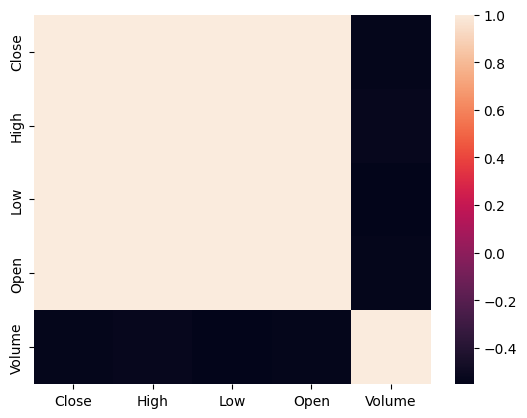

In [ ]:
sns.heatmap(AAPL.corr())

<Axes: >

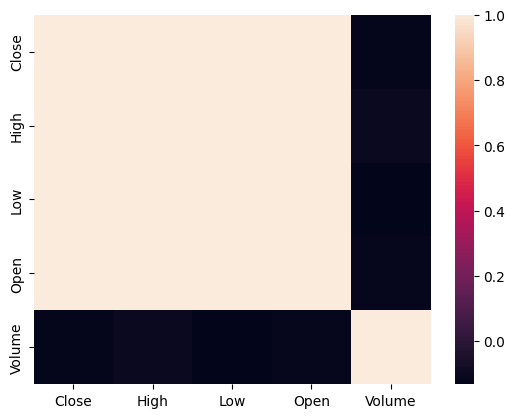

In [ ]:
sns.heatmap(INFY.corr())

<Axes: >

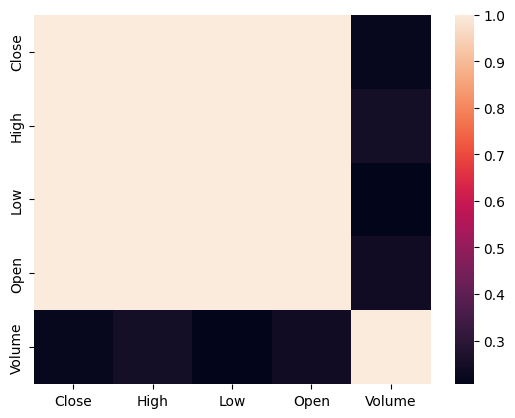

In [ ]:
sns.heatmap(PSKY.corr())

Hence, the columns `Shares Traded` and  `Turnover (Rs. Cr)` are weakly correlated with other variables while they have a strong correlation with each other.

Now, we will plot the time series of all of these data.

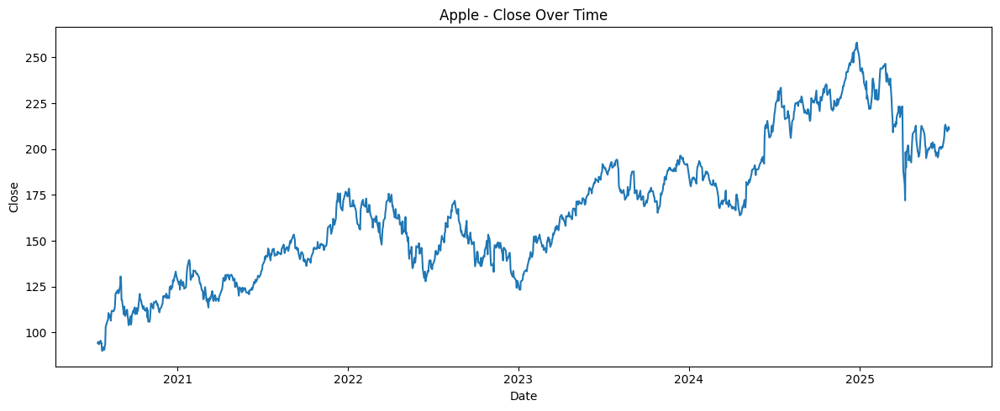

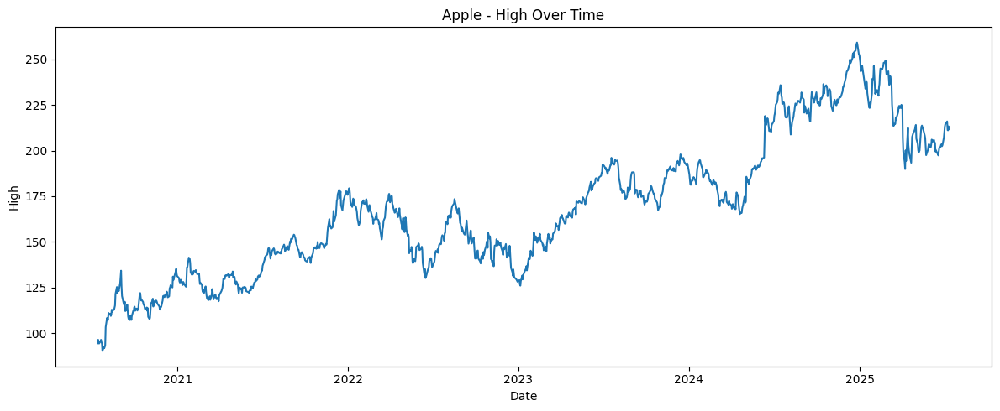

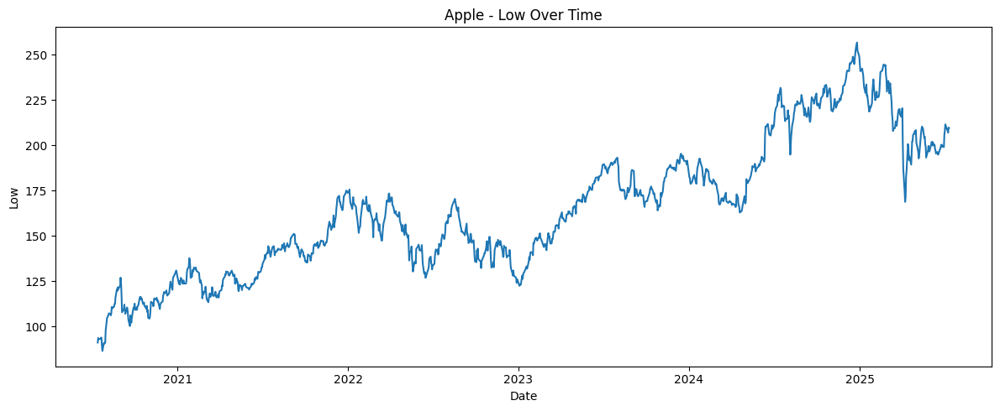

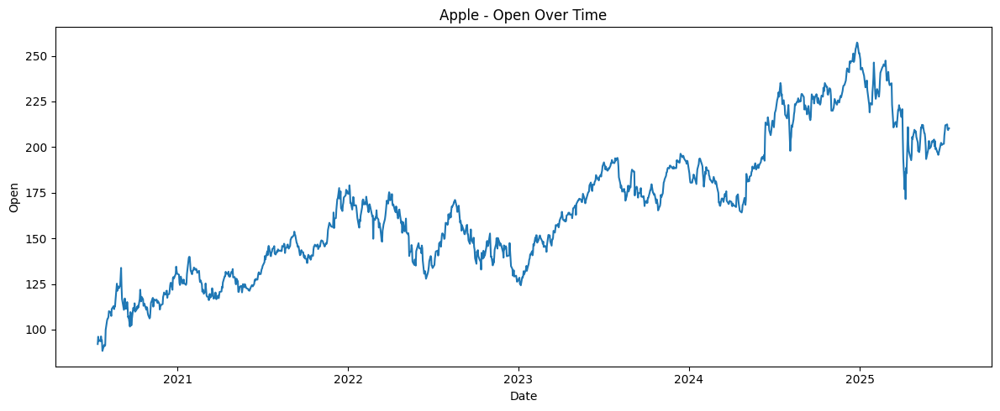

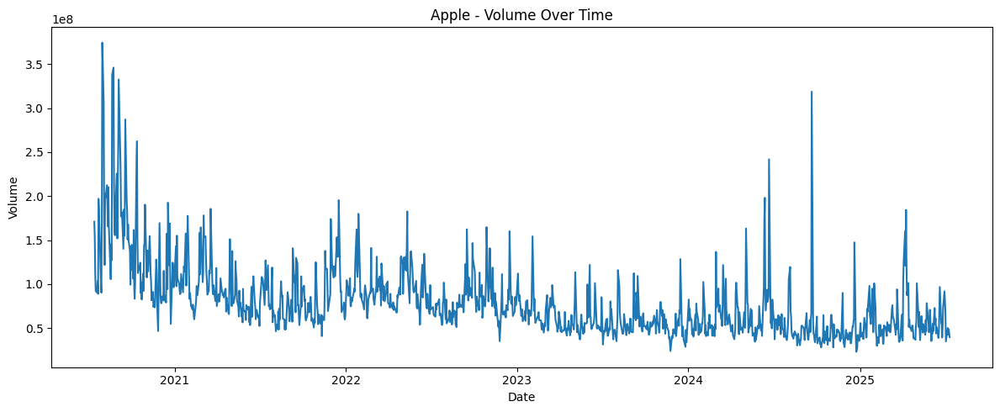

In [ ]:
for i in AAPL.columns:
    plt.figure(figsize=(12, 5))
    plt.plot(AAPL.index, AAPL[i], label=i)
    plt.xlabel("Date")
    plt.ylabel(i)
    plt.title(f"Apple - {i} Over Time")
    plt.tight_layout()
    plt.show()

No anomaly detected.

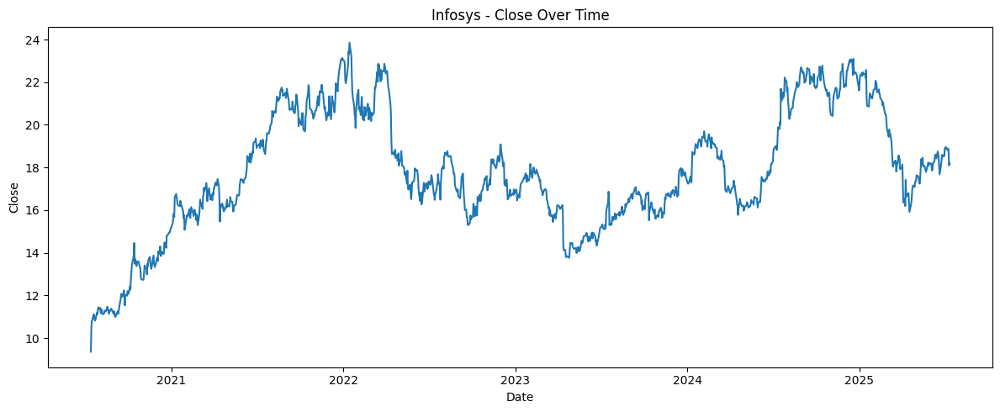

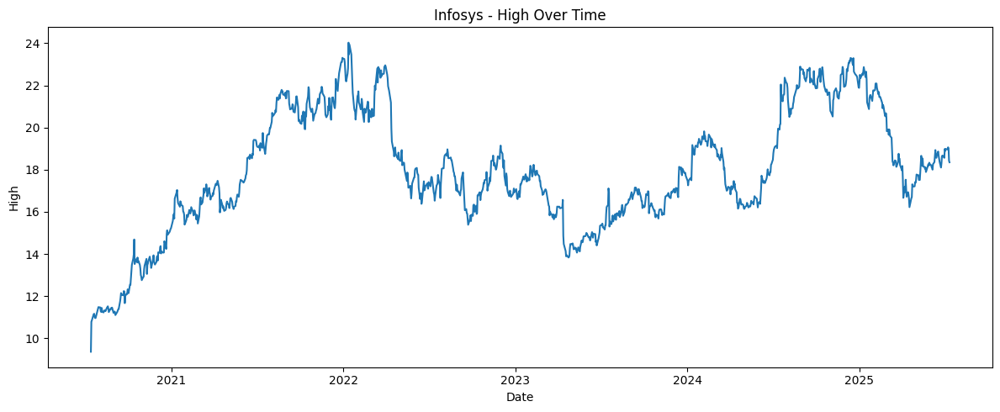

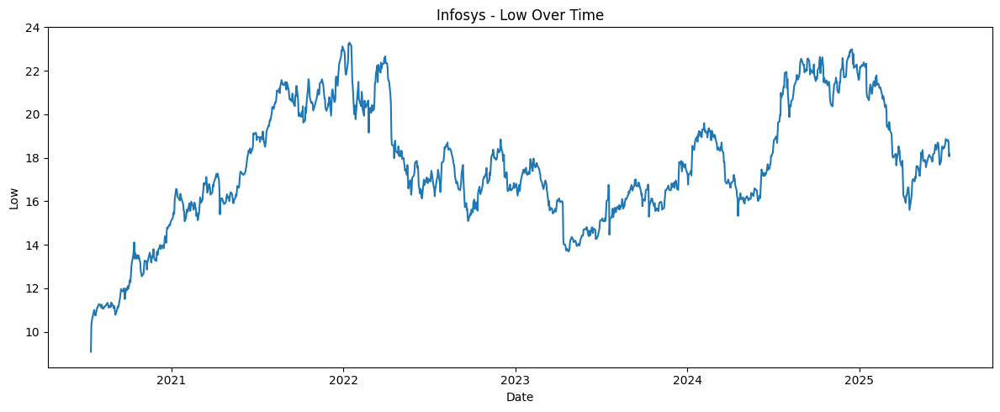

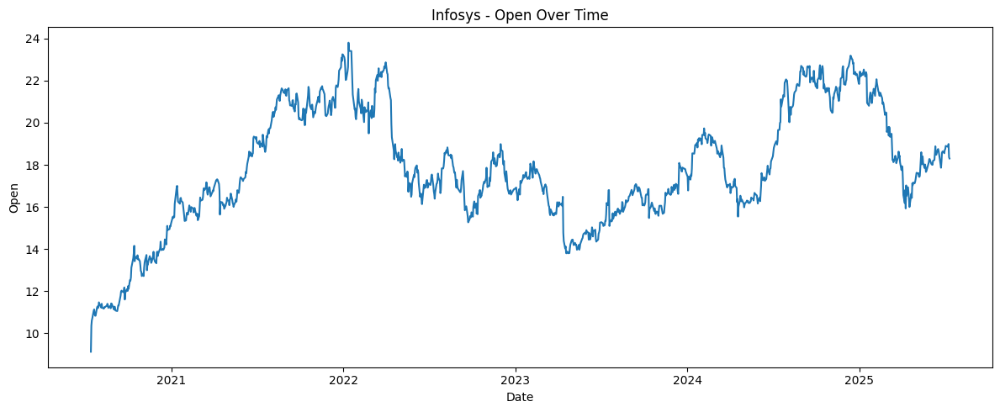

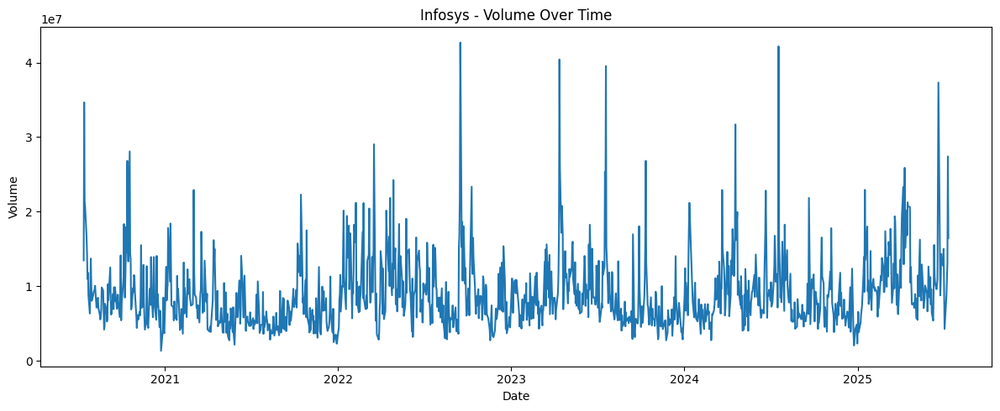

In [ ]:
for i in INFY.columns:
    plt.figure(figsize=(12, 5))
    plt.plot(INFY.index, INFY[i], label=i)
    plt.xlabel("Date")
    plt.ylabel(i)
    plt.title(f"Infosys - {i} Over Time")
    plt.tight_layout()
    plt.show()

The spikes show relation with the close prices of the day so they cannot be considered as anomaly.

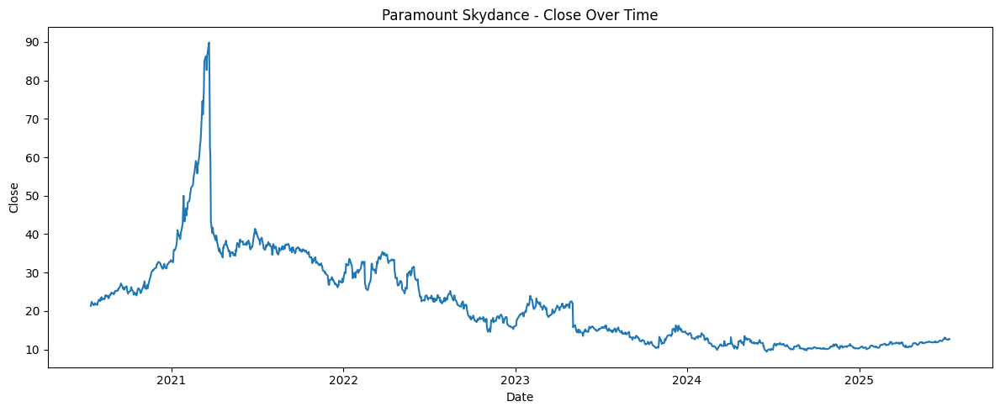

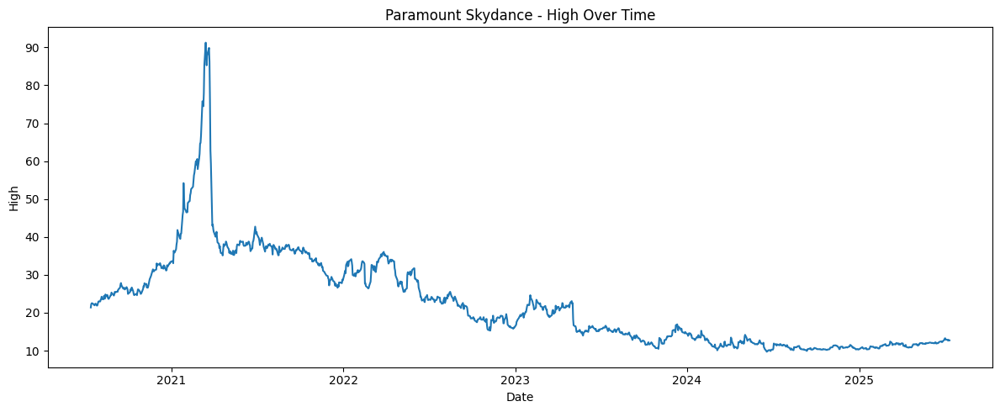

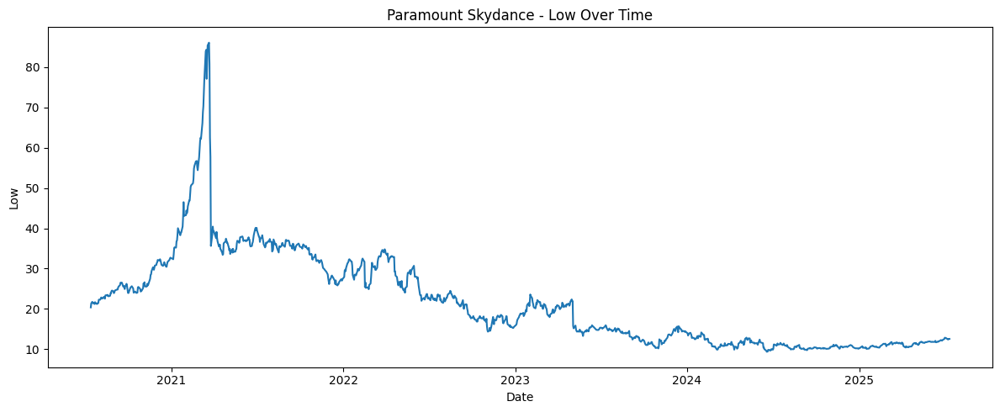

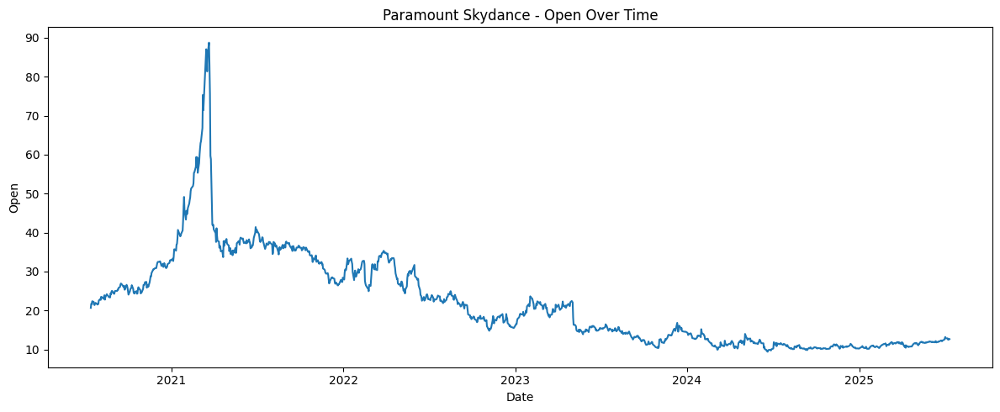

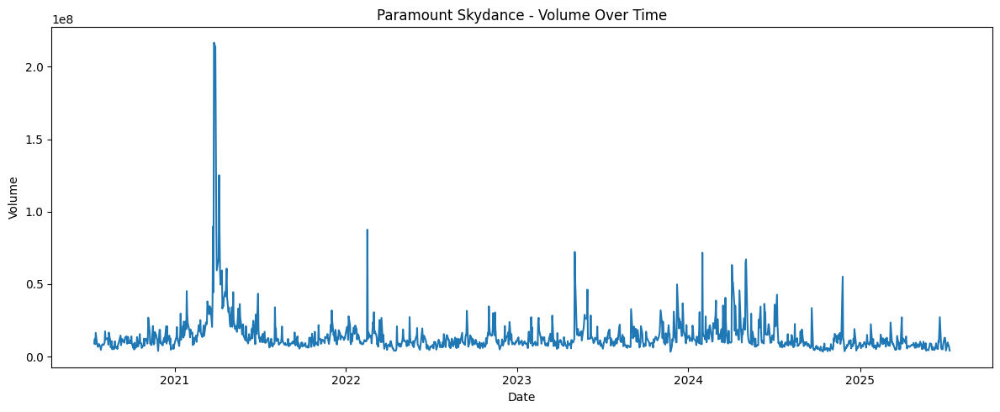

In [ ]:
for i in PSKY.columns:
    plt.figure(figsize=(12, 5))
    plt.plot(PSKY.index, PSKY[i], label=i)
    plt.xlabel("Date")
    plt.ylabel(i)
    plt.title(f"Paramount Skydance - {i} Over Time")
    plt.tight_layout()
    plt.show()

Now we plot the `Close` prices and `Shares Traded` of all the three stocks together to see a difference between them.

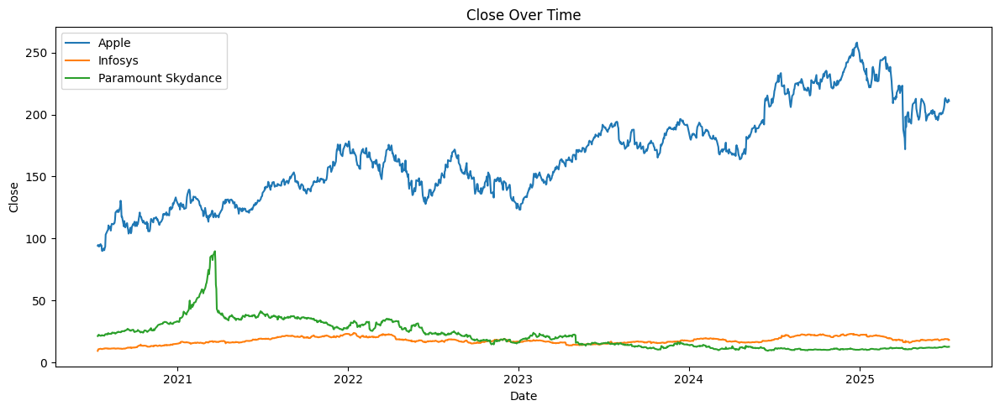

In [ ]:
plt.figure(figsize=(12, 5))
plt.plot(AAPL.index, AAPL["Close"], label="Apple")
plt.plot(INFY.index, INFY["Close"], label="Infosys")
plt.plot(PSKY.index, PSKY["Close"], label="Paramount Skydance")
plt.xlabel("Date")
plt.ylabel("Close")
plt.title("Close Over Time")
plt.tight_layout()
plt.legend()
plt.show()

Looking for correlation between the close prices of the 3 stocks.

In [ ]:
df_close = pd.concat([AAPL.Close,AAPL.Close,AAPL.Close], axis=1)
df_close.columns = ['AAPL_close', 'INFY_close', 'PSKY_close']

<Axes: >

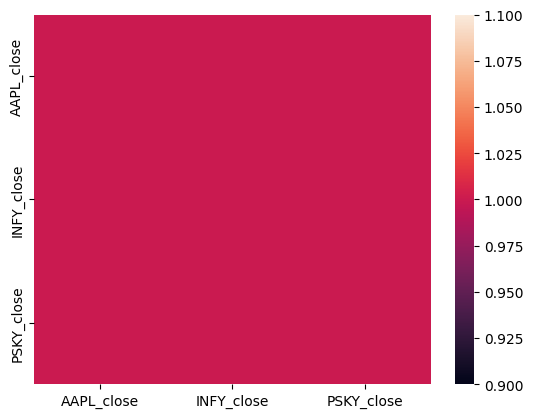

In [ ]:
sns.heatmap(df_close.corr())

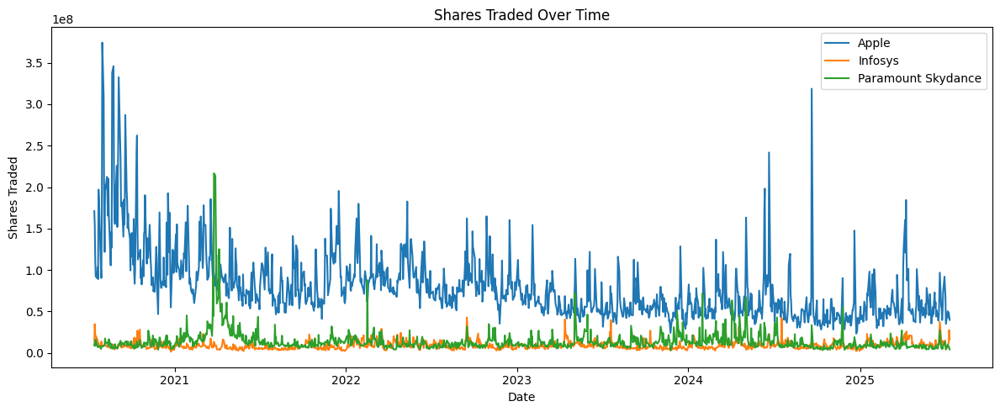

In [ ]:
plt.figure(figsize=(12, 5))
plt.plot(AAPL.index, AAPL["Volume"], label="Apple")
plt.plot(INFY.index, INFY["Volume"], label="Infosys")
plt.plot(PSKY.index, PSKY["Volume"], label="Paramount Skydance")
plt.xlabel("Date")
plt.ylabel("Shares Traded")
plt.title("Shares Traded Over Time")
plt.tight_layout()
plt.legend()
plt.show()

Is there any correlation between the volume of trading in a day of the three stocks?

In [ ]:
df_shares_traded = pd.concat([AAPL["Volume"], INFY["Volume"], PSKY["Volume"]], axis=1)
df_shares_traded.columns = ['AAPL_shares_traded', 'INFY_shares_traded', 'PSKY_shares_traded']

<Axes: >

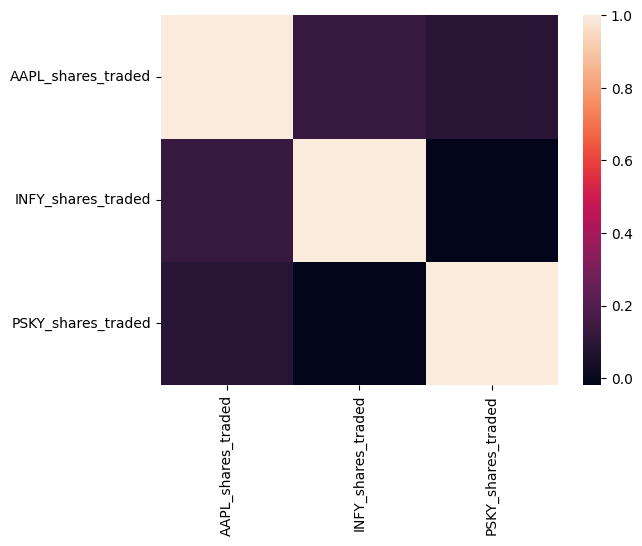

In [ ]:
sns.heatmap(df_shares_traded.corr())

Very weak correlation among the volumes of shares traded in a day for the stocks.

To apply a VAR model, we shall test for stationarity of series of vectors.

### **ACF and PACF plots for Apple shares**

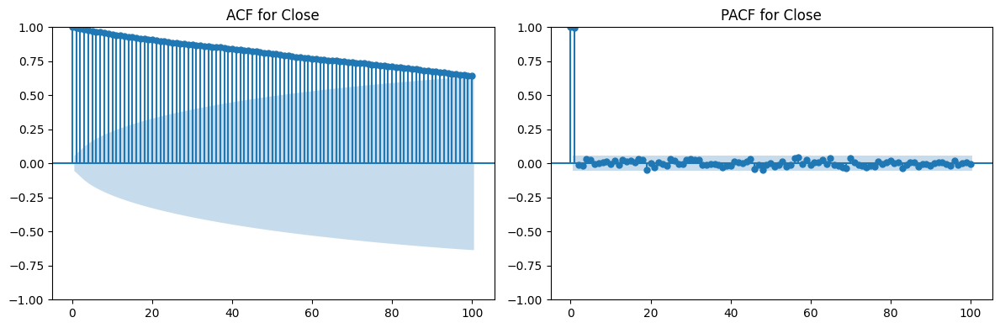

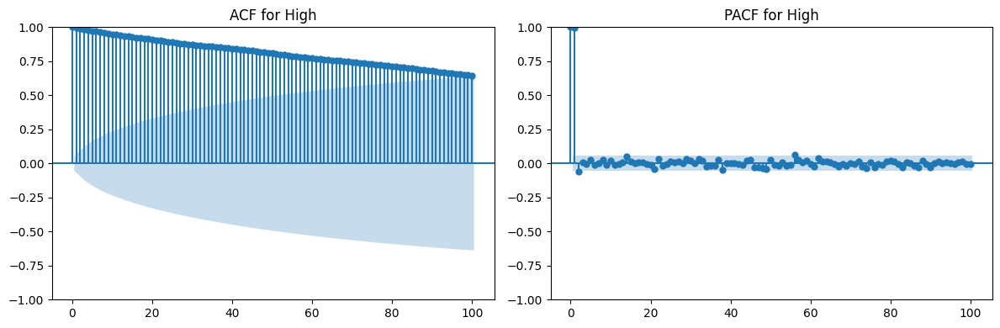

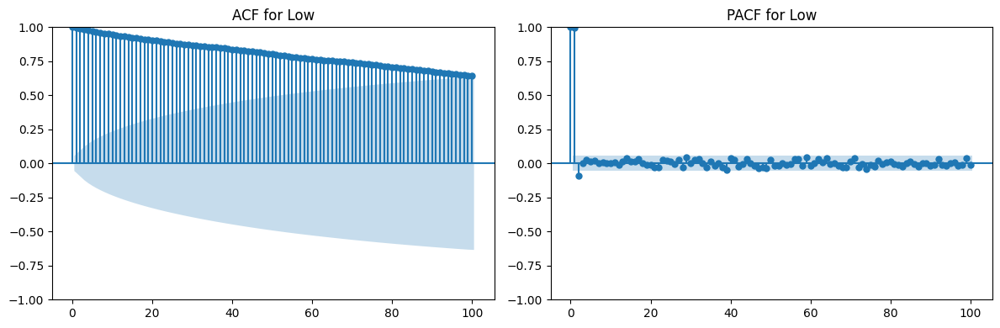

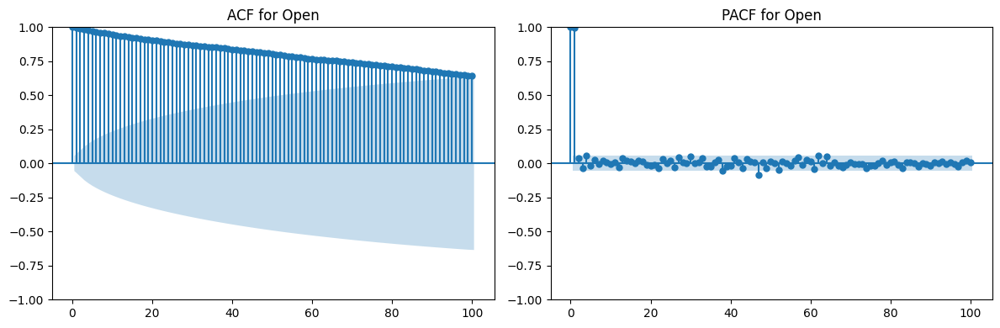

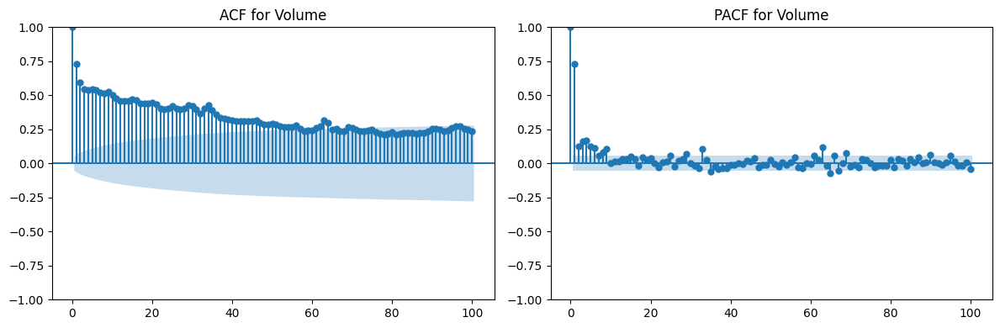

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
max_lags = 100

for col in AAPL.columns:
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    plot_acf(AAPL[col], lags=max_lags, ax=axes[0])
    axes[0].set_title(f'ACF for {col}')
    plot_pacf(AAPL[col], lags=max_lags, ax=axes[1], method='ywm')
    axes[1].set_title(f'PACF for {col}')
    plt.tight_layout()
    plt.show()

None of the series in FMCG appear to be stationary using ACF and PACF plots, so we shall test for their stationary. We shall use ADF Test to determine if they are stationary or not.

In [ ]:
from statsmodels.tsa.stattools import adfuller

In [ ]:
def adf_test(series, signif=0.05, name=''):
    result = adfuller(series, autolag='AIC')
    stat, p, crit_vals = result[0], result[1], result[4]
    print(f'ADF on "{name}": ADF-stat={stat:.3f},  p={p:.3f}, \nCritical Values: {crit_vals}\n', end=' — ')
    print('Stationary' if p <= signif else 'Non-stationary')

In [ ]:
print('ADF results:')
for name, col in AAPL.items():
    adf_test(col, name=name)

ADF results:
ADF on "Close": ADF-stat=-1.882,  p=0.341, 
Critical Values: {'1%': -3.4355754676859886, '5%': -2.8638475772391665, '10%': -2.5679985805677017}
 — Non-stationary
ADF on "High": ADF-stat=-1.834,  p=0.364, 
Critical Values: {'1%': -3.4355964295197743, '5%': -2.863856825923603, '10%': -2.5680035060041626}
 — Non-stationary
ADF on "Low": ADF-stat=-1.892,  p=0.336, 
Critical Values: {'1%': -3.4356048614183443, '5%': -2.8638605461891617, '10%': -2.5680054872544145}
 — Non-stationary
ADF on "Open": ADF-stat=-1.869,  p=0.347, 
Critical Values: {'1%': -3.4355880246374304, '5%': -2.8638531175675896, '10%': -2.568001531098063}
 — Non-stationary
ADF on "Volume": ADF-stat=-3.812,  p=0.003, 
Critical Values: {'1%': -3.4356560275160835, '5%': -2.8638831211270817, '10%': -2.568017509711682}
 — Stationary


Hence, only `Volume` is stationary while the others are not. Now, we shall test for stationarity of the other vectors by differencing and check if they are stationary after a maximum of 5 differences.

In [ ]:
def adf_diff_until_stationary(series, signif=0.05, max_diff=5, verbose=True):
    """
    Iteratively difference the series and perform ADF test until p-value ≤ signif or max_diff is reached.
    Returns:
        - final_series: the (possibly differenced) stationary series
        - num_diffs: number of differences applied
        - adf_p: final ADF p-value
    """
    series_test = series.copy()
    num_diffs = 0
    print(f'Initial Series: {series_test.keys()[0]}')

    while num_diffs <= max_diff:
        adf_result = adfuller(series_test.dropna(), autolag='AIC')
        adf_stat, adf_p, crit_vals = adf_result[0], adf_result[1], adf_result[4]
        if verbose:
            print(f'Diff {num_diffs}: ADF Statistic={adf_stat:.4f}, p-value={adf_p:.4f}, \nCritical Values: {crit_vals}\n')
        if adf_p <= signif:
            if verbose:
                print('=> Series is stationary.\n')
            break
        # Otherwise difference the series again
        series_test = series_test.diff().dropna()
        num_diffs += 1
    else:
        if verbose:
            print('Warning: Reached max_diff and series may still be non-stationary.')
    return series_test, num_diffs, adf_p

In [ ]:
stationary_series, num_diffs, final_p = adf_diff_until_stationary(AAPL[["Open"]])
stationary_series, num_diffs, final_p = adf_diff_until_stationary(AAPL[["Close"]])
stationary_series, num_diffs, final_p = adf_diff_until_stationary(AAPL[["High"]])
stationary_series, num_diffs, final_p = adf_diff_until_stationary(AAPL[["Low"]])

Initial Series: Open
Diff 0: ADF Statistic=-1.8691, p-value=0.3467, 
Critical Values: {'1%': -3.4355880246374304, '5%': -2.8638531175675896, '10%': -2.568001531098063}

Diff 1: ADF Statistic=-22.0761, p-value=0.0000, 
Critical Values: {'1%': -3.4355880246374304, '5%': -2.8638531175675896, '10%': -2.568001531098063}

=> Series is stationary.

Initial Series: Close
Diff 0: ADF Statistic=-1.8816, p-value=0.3408, 
Critical Values: {'1%': -3.4355754676859886, '5%': -2.8638475772391665, '10%': -2.5679985805677017}

Diff 1: ADF Statistic=-34.8514, p-value=0.0000, 
Critical Values: {'1%': -3.4355796466416777, '5%': -2.863849421064024, '10%': -2.5679995625056926}

=> Series is stationary.

Initial Series: High
Diff 0: ADF Statistic=-1.8344, p-value=0.3635, 
Critical Values: {'1%': -3.4355964295197743, '5%': -2.863856825923603, '10%': -2.5680035060041626}

Diff 1: ADF Statistic=-15.7598, p-value=0.0000, 
Critical Values: {'1%': -3.4355964295197743, '5%': -2.863856825923603, '10%': -2.56800350600

Hence, by first order differencing we can see that all the columns are stationary.  

We shall test the same for the rest of the shares, i.e., Infosys and Paramount Skydance

### **ACF and PACF Plots for Infosys**

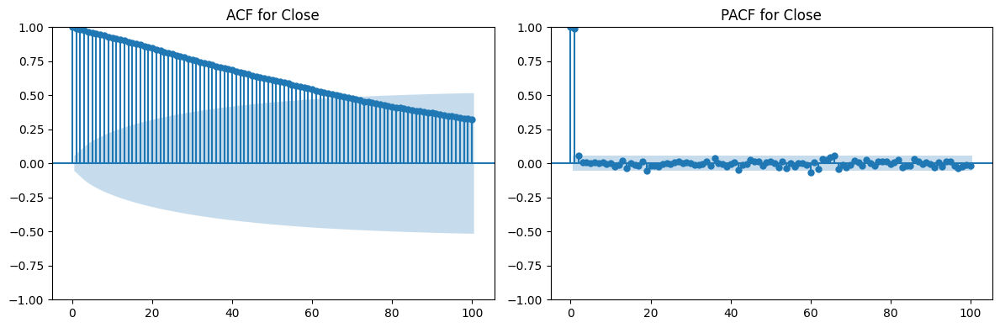

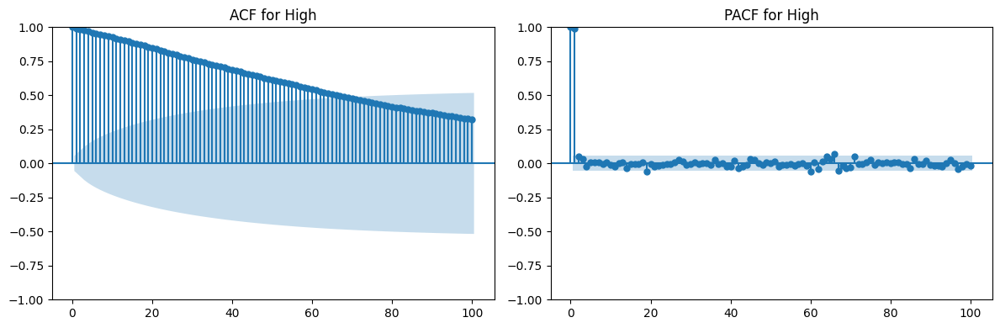

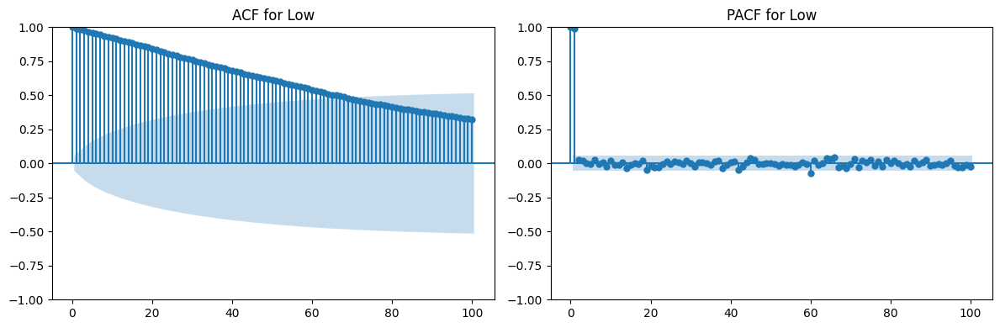

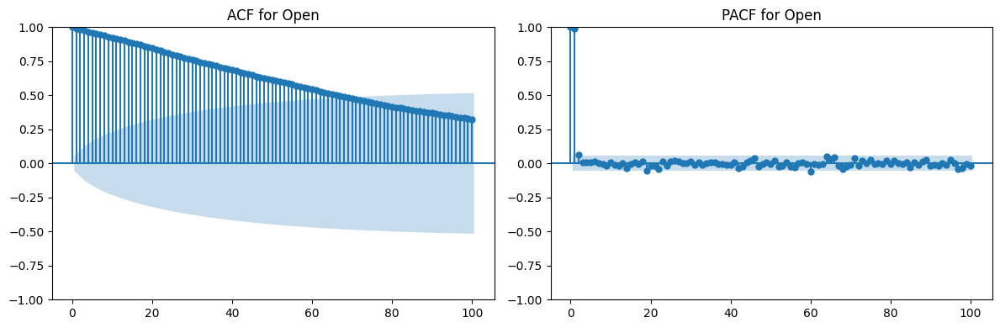

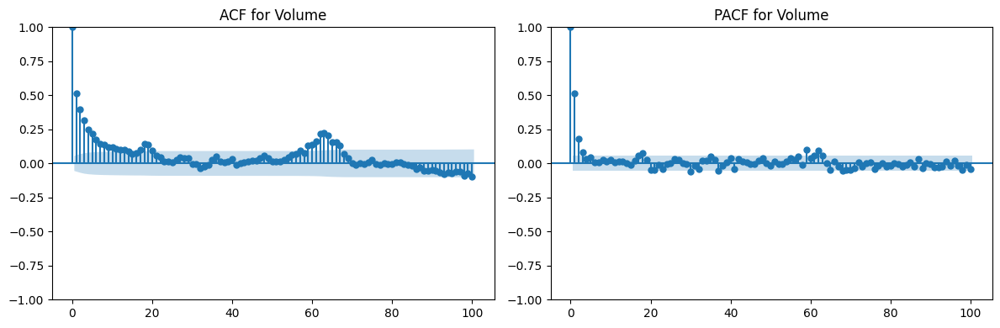

In [ ]:
max_lags = 100

for col in INFY.columns:
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    plot_acf(INFY[col], lags=max_lags, ax=axes[0])
    axes[0].set_title(f'ACF for {col}')
    plot_pacf(INFY[col], lags=max_lags, ax=axes[1], method='ywm')
    axes[1].set_title(f'PACF for {col}')
    plt.tight_layout()
    plt.show()

Applying the predefined function of ADF-test in the notebook to test for stationarity of vectors of IT shares.

In [ ]:
print('ADF results:')
for name, col in INFY.items():
    adf_test(col, name=name)

ADF results:
ADF on "Close": ADF-stat=-3.059,  p=0.030, 
Critical Values: {'1%': -3.4355754676859886, '5%': -2.8638475772391665, '10%': -2.5679985805677017}
 — Stationary
ADF on "High": ADF-stat=-2.651,  p=0.083, 
Critical Values: {'1%': -3.4355880246374304, '5%': -2.8638531175675896, '10%': -2.568001531098063}
 — Non-stationary
ADF on "Low": ADF-stat=-3.099,  p=0.027, 
Critical Values: {'1%': -3.4355754676859886, '5%': -2.8638475772391665, '10%': -2.5679985805677017}
 — Stationary
ADF on "Open": ADF-stat=-3.120,  p=0.025, 
Critical Values: {'1%': -3.4355754676859886, '5%': -2.8638475772391665, '10%': -2.5679985805677017}
 — Stationary
ADF on "Volume": ADF-stat=-10.348,  p=0.000, 
Critical Values: {'1%': -3.435592223709696, '5%': -2.8638549702604803, '10%': -2.56800251776}
 — Stationary


Again the `Open`, `High`, `Low` and `Close` values are not stationary so we'll check if they are stationary after some order of differencing.

In [ ]:
stationary_series, num_diffs, final_p = adf_diff_until_stationary(INFY[["Open"]])
stationary_series, num_diffs, final_p = adf_diff_until_stationary(INFY[["Close"]])
stationary_series, num_diffs, final_p = adf_diff_until_stationary(INFY[["High"]])
stationary_series, num_diffs, final_p = adf_diff_until_stationary(INFY[["Low"]])

Initial Series: Open
Diff 0: ADF Statistic=-3.1202, p-value=0.0251, 
Critical Values: {'1%': -3.4355754676859886, '5%': -2.8638475772391665, '10%': -2.5679985805677017}

=> Series is stationary.

Initial Series: Close
Diff 0: ADF Statistic=-3.0588, p-value=0.0298, 
Critical Values: {'1%': -3.4355754676859886, '5%': -2.8638475772391665, '10%': -2.5679985805677017}

=> Series is stationary.

Initial Series: High
Diff 0: ADF Statistic=-2.6514, p-value=0.0828, 
Critical Values: {'1%': -3.4355880246374304, '5%': -2.8638531175675896, '10%': -2.568001531098063}

Diff 1: ADF Statistic=-20.0056, p-value=0.0000, 
Critical Values: {'1%': -3.4355880246374304, '5%': -2.8638531175675896, '10%': -2.568001531098063}

=> Series is stationary.

Initial Series: Low
Diff 0: ADF Statistic=-3.0987, p-value=0.0267, 
Critical Values: {'1%': -3.4355754676859886, '5%': -2.8638475772391665, '10%': -2.5679985805677017}

=> Series is stationary.



Hence, by first order differencing, all the columns are stationary.

### **ACF and PACF plots for Paramount Skydance**

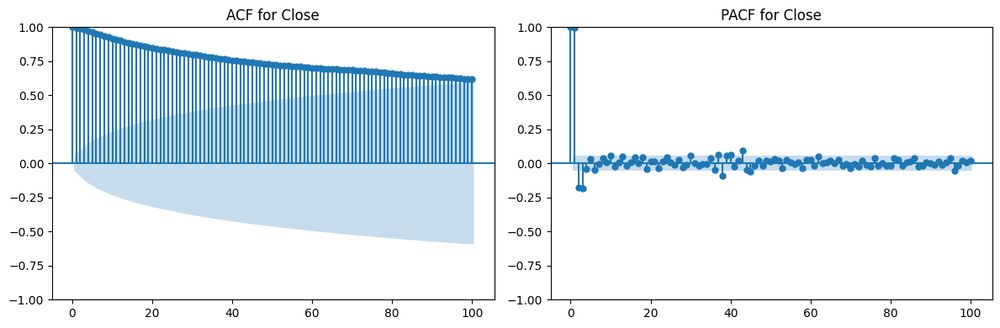

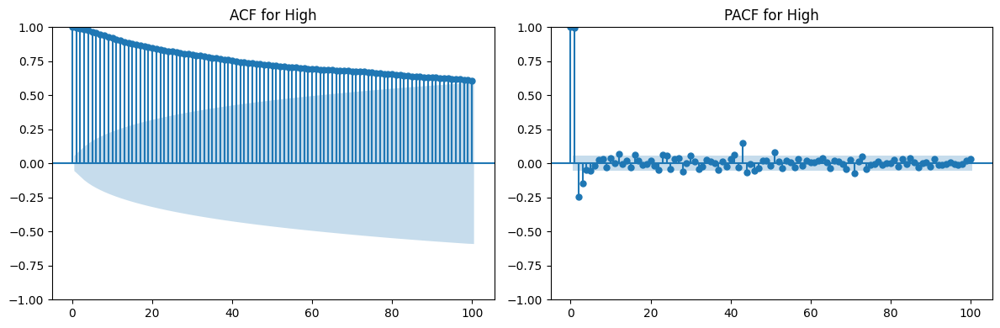

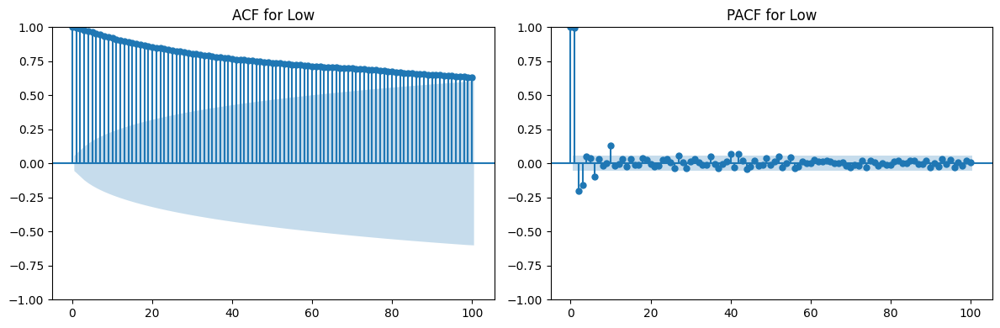

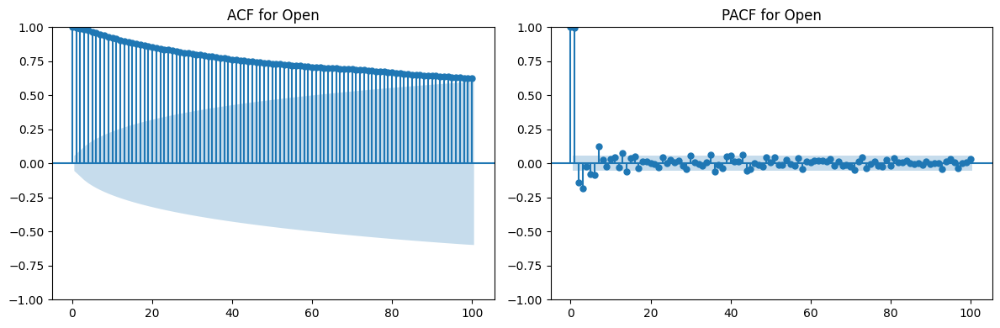

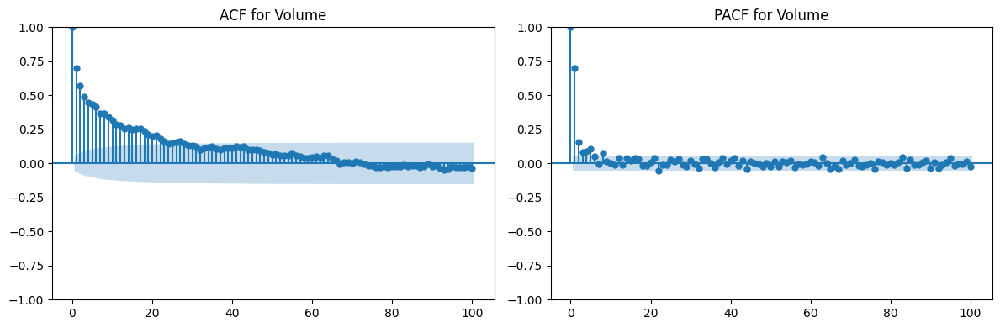

In [ ]:
max_lags = 100

for col in PSKY.columns:
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    plot_acf(PSKY[col], lags=max_lags, ax=axes[0])
    axes[0].set_title(f'ACF for {col}')
    plot_pacf(PSKY[col], lags=max_lags, ax=axes[1], method='ywm')
    axes[1].set_title(f'PACF for {col}')
    plt.tight_layout()
    plt.show()

In [ ]:
print('ADF results:')
for name, col in PSKY.items():
    adf_test(col, name=name)

ADF results:
ADF on "Close": ADF-stat=-2.430,  p=0.133, 
Critical Values: {'1%': -3.4355964295197743, '5%': -2.863856825923603, '10%': -2.5680035060041626}
 — Non-stationary
ADF on "High": ADF-stat=-2.450,  p=0.128, 
Critical Values: {'1%': -3.435592223709696, '5%': -2.8638549702604803, '10%': -2.56800251776}
 — Non-stationary
ADF on "Low": ADF-stat=-1.972,  p=0.299, 
Critical Values: {'1%': -3.4356133204636095, '5%': -2.8638642784217305, '10%': -2.5680074748794373}
 — Non-stationary
ADF on "Open": ADF-stat=-1.919,  p=0.323, 
Critical Values: {'1%': -3.4356431428057386, '5%': -2.8638774363142963, '10%': -2.568014482215048}
 — Non-stationary
ADF on "Volume": ADF-stat=-6.425,  p=0.000, 
Critical Values: {'1%': -3.4356048614183443, '5%': -2.8638605461891617, '10%': -2.5680054872544145}
 — Stationary


In [ ]:
stationary_series, num_diffs, final_p = adf_diff_until_stationary(PSKY[["Open"]])
stationary_series, num_diffs, final_p = adf_diff_until_stationary(PSKY[["Close"]])
stationary_series, num_diffs, final_p = adf_diff_until_stationary(PSKY[["High"]])
stationary_series, num_diffs, final_p = adf_diff_until_stationary(PSKY[["Low"]])

Initial Series: Open
Diff 0: ADF Statistic=-1.9192, p-value=0.3231, 
Critical Values: {'1%': -3.4356431428057386, '5%': -2.8638774363142963, '10%': -2.568014482215048}

Diff 1: ADF Statistic=-10.1395, p-value=0.0000, 
Critical Values: {'1%': -3.435638861796935, '5%': -2.863875547501718, '10%': -2.5680134763122906}

=> Series is stationary.

Initial Series: Close
Diff 0: ADF Statistic=-2.4302, p-value=0.1334, 
Critical Values: {'1%': -3.4355964295197743, '5%': -2.863856825923603, '10%': -2.5680035060041626}

Diff 1: ADF Statistic=-11.8986, p-value=0.0000, 
Critical Values: {'1%': -3.4356133204636095, '5%': -2.8638642784217305, '10%': -2.5680074748794373}

=> Series is stationary.

Initial Series: High
Diff 0: ADF Statistic=-2.4497, p-value=0.1282, 
Critical Values: {'1%': -3.435592223709696, '5%': -2.8638549702604803, '10%': -2.56800251776}

Diff 1: ADF Statistic=-7.9119, p-value=0.0000, 
Critical Values: {'1%': -3.4356776419985953, '5%': -2.863892657513944, '10%': -2.5680225884063717}


Thus we draw the same conclusion for Pharma sector share data columns as well.

Hence, all the variables are stationary in `Apple`, `Infosys` and `Paramount Skydance` share datasets. Thus, we can model VAR and VARMA on the datasets and forecast future predictions.

This ends our data preprocessing.

# **Time Series Anaysis and Model fitting (VAR and VARMA)**

## **Importing Necessary Libraries**

In [ ]:
%%capture
!pip install pmdarima
!pip install numpy==1.26.4

In [ ]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline

# Libraries to define the required functions
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.vector_ar.vecm import coint_johansen

from pmdarima.model_selection import train_test_split as time_train_test_split
from sklearn import metrics
from sklearn.model_selection import ParameterGrid

from statsmodels.tsa.api import VAR
from statsmodels.tsa.statespace.varmax import VARMAX
from pmdarima import auto_arima


import warnings
warnings.filterwarnings("ignore")

## **Utils**

In [ ]:
def mean_absolute_percentage_error_func(y_true, y_pred):
    '''
    Calculate the mean absolute percentage error as a metric for evaluation MAPE

    Args:
        y_true (float64): Y values for the dependent variable (test part), numpy array of floats
        y_pred (float64): Predicted values for the dependen variable (test parrt), numpy array of floats

    Returns:
        Mean absolute percentage error
    '''
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [ ]:
def timeseries_evaluation_metrics_func(y_true, y_pred):
    '''
    Calculate the following evaluation metrics:
        - MSE
        - MAE
        - RMSE
        - MAPE
        - R²

    Args:
        y_true (float64): Y values for the dependent variable (test part), numpy array of floats
        y_pred (float64): Predicted values for the dependen variable (test parrt), numpy array of floats

    Returns:
        MSE, MAE, RMSE, MAPE and R²
    '''
    print('Evaluation metric results: ')
    print(f'MSE is : {metrics.mean_squared_error(y_true, y_pred)}')
    print(f'MAE is : {metrics.mean_absolute_error(y_true, y_pred)}')
    print(f'RMSE is : {np.sqrt(metrics.mean_squared_error(y_true, y_pred))}')
    print(f'MAPE is : {mean_absolute_percentage_error_func(y_true, y_pred)}')
    print(f'R2 is : {metrics.r2_score(y_true, y_pred)}',end='\n\n')

In [ ]:
def Augmented_Dickey_Fuller_Test_func(timeseries , column_name):
    '''
    Calculates statistical values whether the available data are stationary or not

    Args:
        series (float64): Values of the column for which stationarity is to be checked, numpy array of floats
        column_name (str): Name of the column for which stationarity is to be checked

    Returns:
        p-value that indicates whether the data are stationary or not
    '''
    print (f'Results of Dickey-Fuller Test for column: {column_name}')
    adfTest = adfuller(timeseries, autolag='AIC')
    dfResults = pd.Series(adfTest[0:4], index=['ADF Test Statistic','P-Value','# Lags Used','# Observations Used'])
    for key, value in adfTest[4].items():
       dfResults['Critical Value (%s)'%key] = value
    print (dfResults)
    if adfTest[1] <= 0.05:
        print()
        print("Conclusion:")
        print("Reject the null hypothesis")
        print('\033[92m' + "Data is stationary" + '\033[0m')
    else:
        print()
        print("Conclusion:")
        print("Fail to reject the null hypothesis")
        print('\033[91m' + "Data is non-stationary" + '\033[0m')

In [ ]:
def cointegration_test_func(df):
    '''
    Test if there is a long-run relationship between features

    Args:
        dataframe (float64): Values of the columns to be checked, numpy array of floats

    Returns:
        True or False whether a variable has a long-run relationship between other features
    '''
    johansen_cointegration_test = coint_johansen(df,-1,5)
    c = {'0.90':0, '0.95':1, '0.99':2}
    traces = johansen_cointegration_test.lr1
    cvts = johansen_cointegration_test.cvt[:, c[str(1-0.05)]]
    def adjust(val, length= 6):
        return str(val).ljust(length)
    print('Column_Name  >  Test_Stat  >  C(95%)  =>  Signif  \n', '--'*25)
    for col, trace, cvt in zip(df.columns, traces, cvts):
        print(adjust(col), '  >  ',
              adjust(round(trace,2), 9), "  >  ",
              adjust(cvt, 8), '  => ' ,
              trace > cvt)

In [ ]:
def inverse_diff_func(actual_df, pred_df):
    '''
    Transforms the differentiated values back

    Args:
        actual dataframe (float64): Values of the columns, numpy array of floats
        predicted dataframe (float64): Values of the columns, numpy array of floats

    Returns:
        Dataframe with the predicted values
    '''
    df_temp = pred_df.copy()
    columns = actual_df.columns
    for col in columns:
        df_temp[str(col)+'_inv_diff'] = actual_df[col].iloc[-1] + df_temp[str(col)].cumsum()
    return df_temp

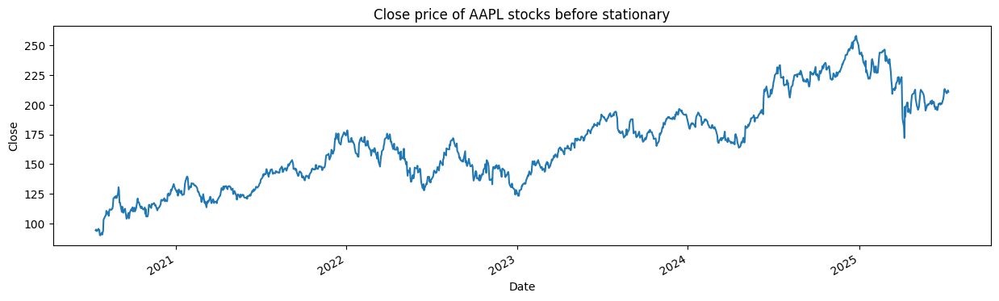

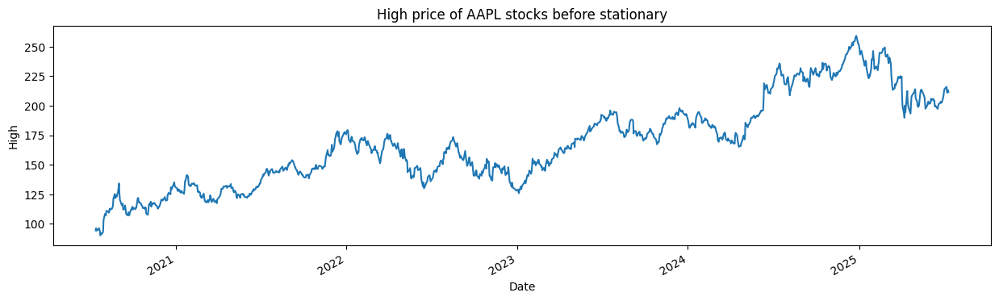

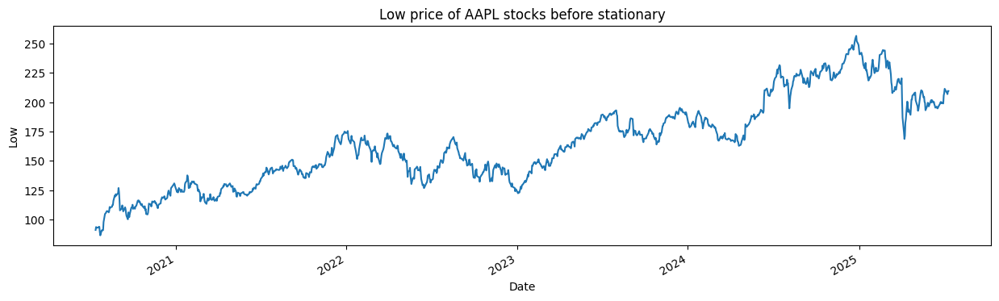

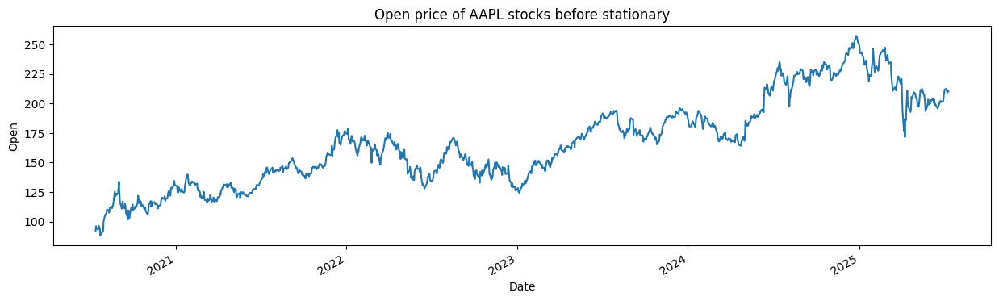

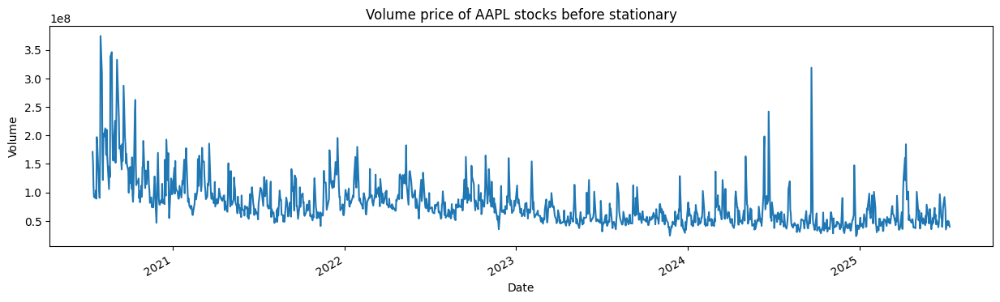

In [ ]:
for feature in AAPL.columns:
    AAPL[str(feature)].plot(figsize=(15, 4))
    plt.xlabel("Date")
    plt.ylabel(feature)
    plt.title(f"{str(feature)} price of AAPL stocks before stationary")
    plt.show()

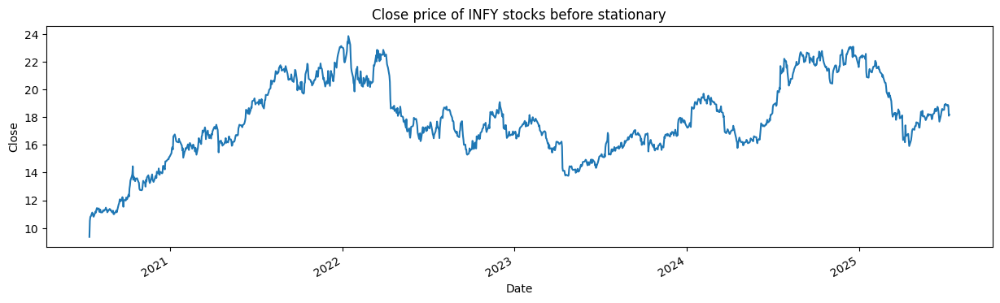

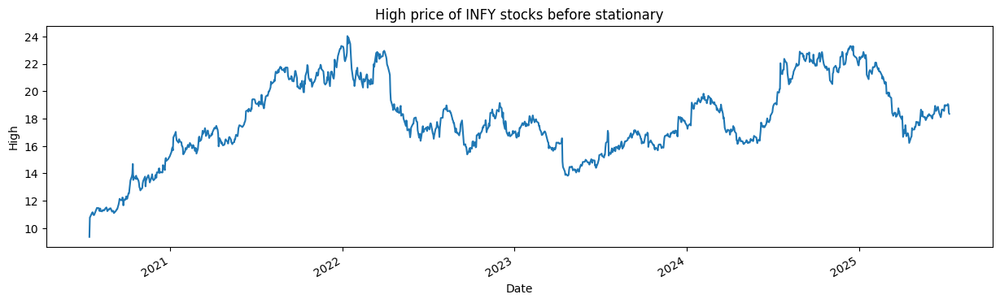

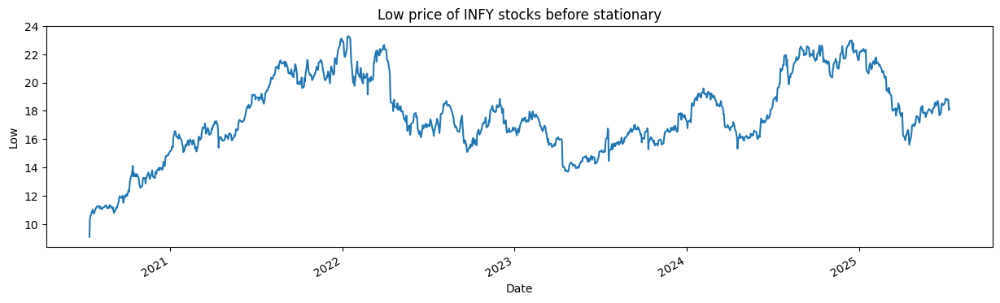

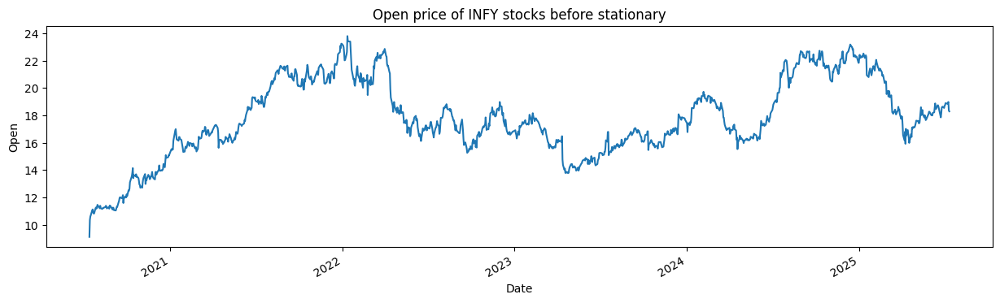

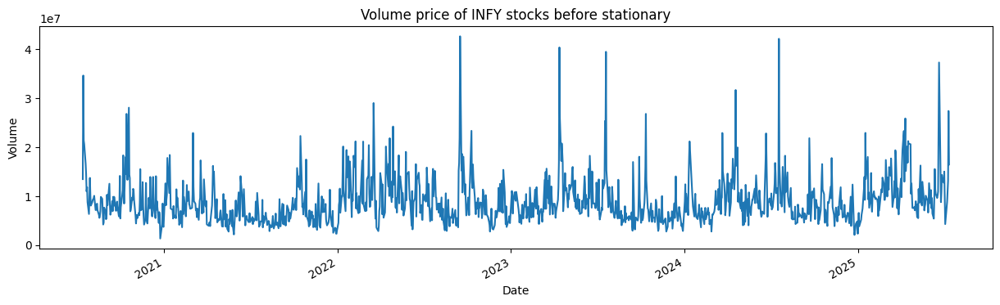

In [ ]:
for feature in INFY.columns:
    INFY[str(feature)].plot(figsize=(15, 4))
    plt.xlabel("Date")
    plt.ylabel(feature)
    plt.title(f"{str(feature)} price of INFY stocks before stationary")
    plt.show()

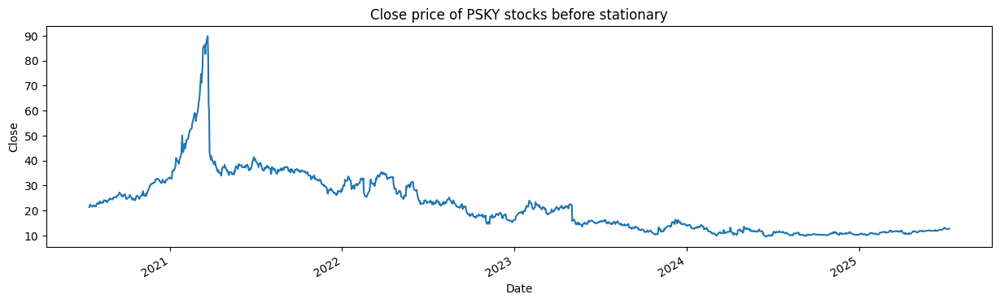

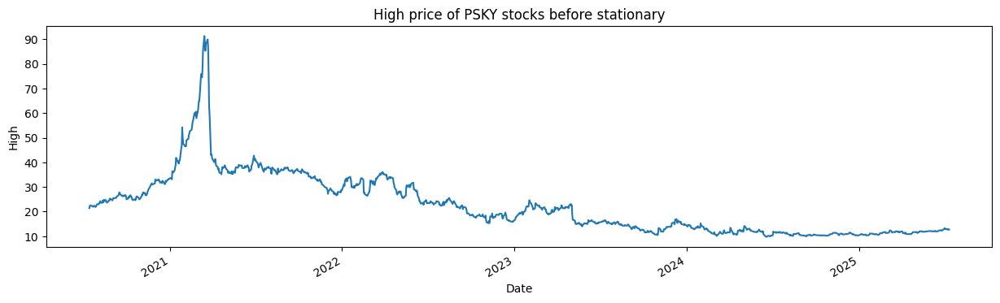

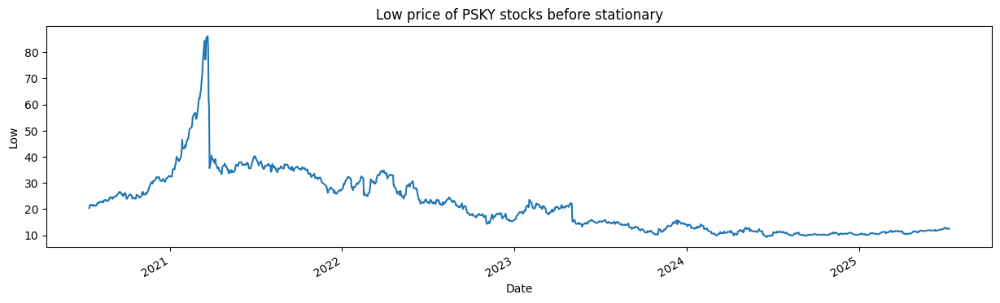

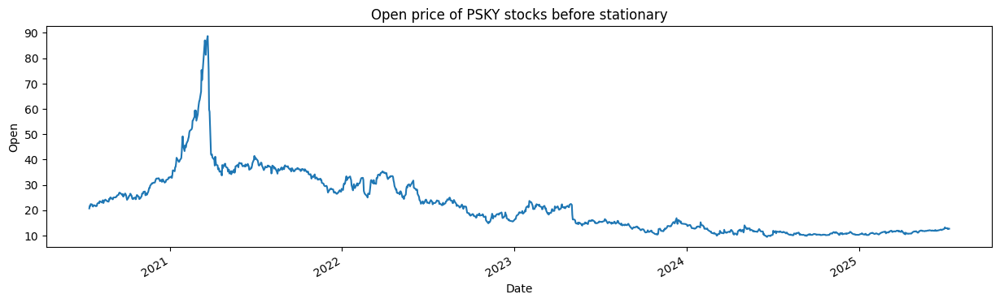

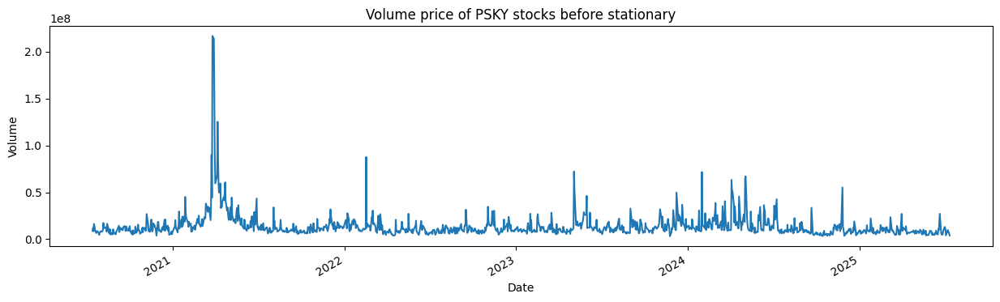

In [ ]:
for feature in PSKY.columns:
    PSKY[str(feature)].plot(figsize=(15, 4))
    plt.xlabel("Date")
    plt.ylabel(feature)
    plt.title(f"{str(feature)} price of PSKY stocks before stationary")
    plt.show()

## **Time Series Modelling for Apple**

### **Test for Stationarity and Cointegration**

In [ ]:
for name, column in AAPL[AAPL.columns].items():
    Augmented_Dickey_Fuller_Test_func(AAPL[name],name)
    print('\n')

Results of Dickey-Fuller Test for column: Close
ADF Test Statistic        -1.881618
P-Value                    0.340757
# Lags Used                0.000000
# Observations Used     1254.000000
Critical Value (1%)       -3.435575
Critical Value (5%)       -2.863848
Critical Value (10%)      -2.567999
dtype: float64

Conclusion:
Fail to reject the null hypothesis
Data is non-stationary


Results of Dickey-Fuller Test for column: High
ADF Test Statistic        -1.834392
P-Value                    0.363525
# Lags Used                5.000000
# Observations Used     1249.000000
Critical Value (1%)       -3.435596
Critical Value (5%)       -2.863857
Critical Value (10%)      -2.568004
dtype: float64

Conclusion:
Fail to reject the null hypothesis
Data is non-stationary


Results of Dickey-Fuller Test for column: Low
ADF Test Statistic        -1.892411
P-Value                    0.335639
# Lags Used                7.000000
# Observations Used     1247.000000
Critical Value (1%)       -3.435605

In [ ]:
X = AAPL

trainX, testX = time_train_test_split(X, test_size=120)

In [ ]:
train_diff = trainX.diff()
train_diff.dropna(inplace = True)

In [ ]:
for name, column in train_diff.items():
    Augmented_Dickey_Fuller_Test_func(train_diff[name],name)
    print('\n')

Results of Dickey-Fuller Test for column: Close
ADF Test Statistic       -33.192779
P-Value                    0.000000
# Lags Used                0.000000
# Observations Used     1133.000000
Critical Value (1%)       -3.436135
Critical Value (5%)       -2.864094
Critical Value (10%)      -2.568130
dtype: float64

Conclusion:
Reject the null hypothesis
Data is stationary


Results of Dickey-Fuller Test for column: High
ADF Test Statistic       -23.503861
P-Value                    0.000000
# Lags Used                1.000000
# Observations Used     1132.000000
Critical Value (1%)       -3.436140
Critical Value (5%)       -2.864097
Critical Value (10%)      -2.568131
dtype: float64

Conclusion:
Reject the null hypothesis
Data is stationary


Results of Dickey-Fuller Test for column: Low
ADF Test Statistic       -20.282574
P-Value                    0.000000
# Lags Used                2.000000
# Observations Used     1131.000000
Critical Value (1%)       -3.436145
Critical Value (5%)    

In [ ]:
cointegration_test_func(train_diff)

Column_Name  >  Test_Stat  >  C(95%)  =>  Signif  
 --------------------------------------------------
Close    >   1889.77     >   60.0627    =>  True
High     >   1383.37     >   40.1749    =>  True
Low      >   923.52      >   24.2761    =>  True
Open     >   528.75      >   12.3212    =>  True
Volume   >   152.97      >   4.1296     =>  True


### **VAR Modelling of Apple**

In [ ]:
resu = []
AAPL_results_VAR = pd.DataFrame()

for i in [1,2,3,4,5,6,7,8,9]:
    fit_v = VAR(train_diff).fit(i)
    aic = fit_v.aic
    bic = fit_v.bic
    df1 = pd.DataFrame([{'AR_Term':i, 'AIC': aic, 'BIC': bic}])
    AAPL_results_VAR = pd.concat([AAPL_results_VAR, df1], ignore_index=True)
    clist = ['AR_Term','AIC','BIC']
    AAPL_results_VAR = AAPL_results_VAR[clist]

In [ ]:
AAPL_results_VAR.sort_values(by=['AIC', 'BIC'], ascending=True)

,AR_Term,AIC,BIC
8,9,36.393868,37.421311
7,8,36.426439,37.341553
6,7,36.446542,37.249485
5,6,36.489108,37.180040
4,5,36.519932,37.099012
3,4,36.600668,37.068054
2,3,36.775604,37.131456
1,2,37.022107,37.266582
0,1,37.547081,37.680337


Selecting best lag order for VAR modelling of Apple using AIC and BIC criterion.



In [ ]:
best_values_VAR = AAPL_results_VAR.sort_values(by=['AIC', 'BIC']).head(1)
best_values_VAR

,AR_Term,AIC,BIC
8,9,36.393868,37.421311


In [ ]:
AR_Term_value_VAR = best_values_VAR['AR_Term'].iloc[0]

print("AR_Term_value_VAR: ", AR_Term_value_VAR)

AR_Term_value_VAR:  9


In [ ]:
model = VAR(train_diff).fit(int(AR_Term_value_VAR))

result = model.forecast(y=train_diff.values, steps=len(testX))

In [ ]:
model.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 22, Sep, 2025
Time:                     09:24:39
--------------------------------------------------------------------
No. of Equations:         5.00000    BIC:                    37.4213
Nobs:                     1125.00    HQIC:                   36.7821
Log likelihood:          -28223.1    FPE:                6.39374e+15
AIC:                      36.3939    Det(Omega_mle):     5.23279e+15
--------------------------------------------------------------------
Results for equation Close
               coefficient       std. error           t-stat            prob
----------------------------------------------------------------------------
const             0.125610         0.082518            1.522           0.128
L1.Close         -0.120646         0.080263           -1.503           0.133
L1.High          -0.020098         0.100355           -0.200           0.841

In [ ]:
AAPL_pred = pd.DataFrame(result, columns=train_diff.columns)
AAPL_pred["new_index"] = range(len(trainX), len(X))
AAPL_pred = AAPL_pred.set_index("new_index")
AAPL_pred.head()

,Close,High,Low,Open,Volume
new_index,,,,,
1135,-0.123413,-7.254360,-3.462880,-10.059705,-5.883139e+06
1136,0.413707,-0.122683,-0.345830,0.549946,2.481967e+06
1137,-0.408546,0.125525,0.627261,0.684998,-1.740758e+07
1138,0.395653,0.401045,0.124764,-0.266982,-9.780715e+05
1139,-0.990643,-0.883948,-0.503398,-0.063276,1.159796e+07


### **Forecast Values**

In [ ]:
res = inverse_diff_func(trainX, AAPL_pred)
res.head()

,Close,High,Low,Open,Volume,Close_inv_diff,High_inv_diff,Low_inv_diff,Open_inv_diff,Volume_inv_diff
new_index,,,,,,,,,,
1135,-0.123413,-7.254360,-3.462880,-10.059705,-5.883139e+06,227.329148,229.913711,223.760498,226.450712,6.587596e+07
1136,0.413707,-0.122683,-0.345830,0.549946,2.481967e+06,227.742855,229.791028,223.414669,227.000658,6.835793e+07
1137,-0.408546,0.125525,0.627261,0.684998,-1.740758e+07,227.334309,229.916553,224.041929,227.685656,5.095035e+07
1138,0.395653,0.401045,0.124764,-0.266982,-9.780715e+05,227.729962,230.317598,224.166693,227.418674,4.997228e+07
1139,-0.990643,-0.883948,-0.503398,-0.063276,1.159796e+07,226.739319,229.433649,223.663295,227.355398,6.157024e+07


In [ ]:
for i in ['Open', 'High', 'Low', 'Close' ]:
    print(f'Evaluation metric for {i}')
    timeseries_evaluation_metrics_func(testX[str(i)] , res[str(i)+'_inv_diff'])

Evaluation metric for Open
Evaluation metric results: 
MSE is : 779.361886245044
MAE is : 24.010245664779664
RMSE is : 27.917053681308207
MAPE is : 11.764247171996928
R2 is : -1.967590509501163

Evaluation metric for High
Evaluation metric results: 
MSE is : 759.6342513395451
MAE is : 23.91557171426829
RMSE is : 27.561463156725644
MAPE is : 11.50226131444946
R2 is : -2.064909625102641

Evaluation metric for Low
Evaluation metric results: 
MSE is : 747.9394786922471
MAE is : 23.449745180793705
RMSE is : 27.348482200887258
MAPE is : 11.651005371068935
R2 is : -1.8036558587780473

Evaluation metric for Close
Evaluation metric results: 
MSE is : 764.6263360198484
MAE is : 23.913552645765932
RMSE is : 27.65187762195993
MAPE is : 11.683071110587614
R2 is : -1.9272961866468936



### **Forecast Plot**

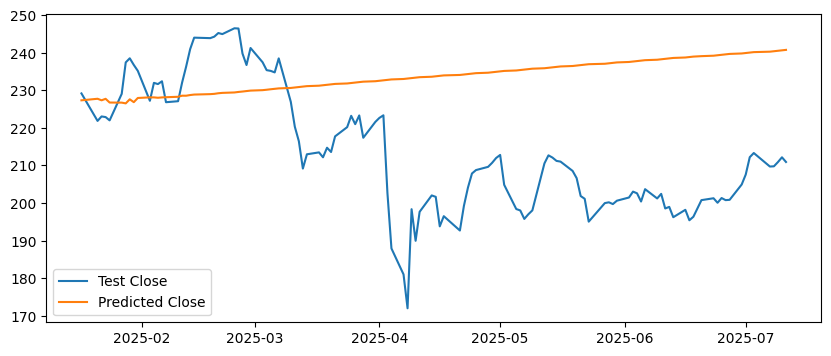

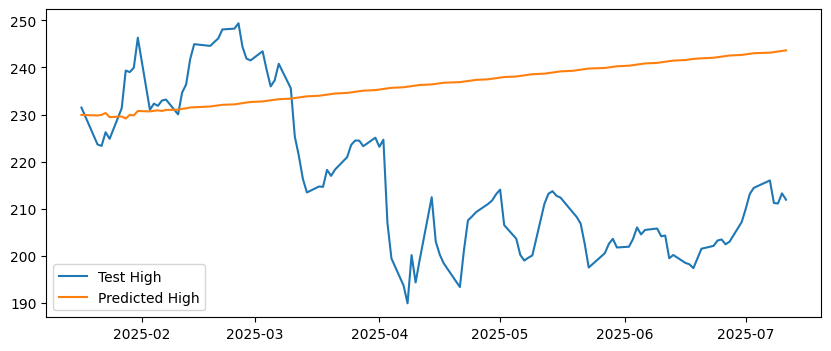

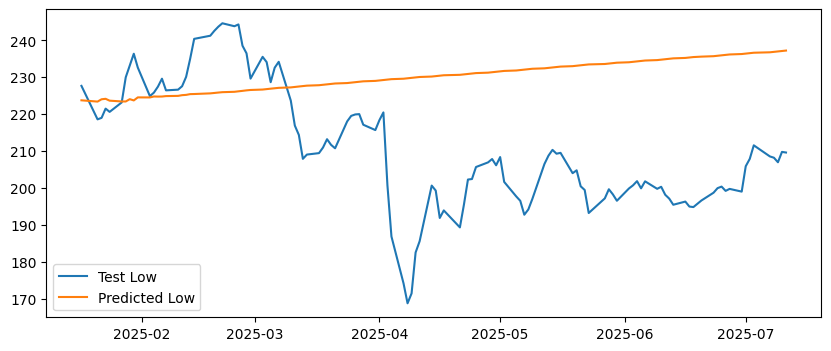

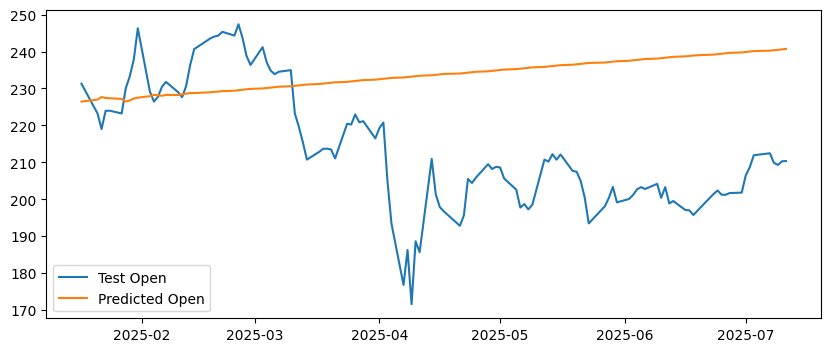

In [ ]:
for i in AAPL.columns[:4]:

    plt.rcParams["figure.figsize"] = [10,4]
    plt.plot(testX[str(i)], label='Test '+str(i))
    res_indexed = res.set_index(testX.index)
    plt.plot(res_indexed[str(i)+'_inv_diff'], label='Predicted '+str(i))
    plt.legend(loc='best')
    plt.show()

### **VARMA Modelling of Apple**

In [ ]:
pq = []
for name, column in train_diff[AAPL.columns].items():
    print(f'Searching order of p and q for : {name}')
    stepwise_model = auto_arima(train_diff[name],start_p=1, start_q=1,max_p=7, max_q=7, seasonal=False,
        trace=True,error_action='ignore',suppress_warnings=True, stepwise=True,maxiter=1000)
    parameter = stepwise_model.get_params().get('order')
    print(f'optimal order for:{name} is: {parameter} \n\n')
    pq.append(stepwise_model.get_params().get('order'))

Searching order of p and q for : Close
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=3510.300, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=3576.877, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=3538.201, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=3549.535, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=3500.922, Time=0.35 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=3499.797, Time=0.09 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=3500.572, Time=0.16 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=3500.381, Time=0.36 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=3501.761, Time=0.18 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0]          
Total fit time: 1.431 seconds
optimal order for:Close is: (2, 0, 0) 


Searching order of p and q for : High
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=3364.965, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=3467.381, Time=0.

In [ ]:
pq

[(2, 0, 0), (3, 0, 3), (6, 0, 0), (2, 0, 0), (1, 0, 2)]

In [ ]:
AAPL_results_VARMA_2 = pd.DataFrame(columns=['p', 'q','RMSE Open','RMSE High','RMSE Low','RMSE Close'])

for i in pq:
    if i[0]== 0 and i[2] ==0:
        pass
    else:
        print(f' Running for {i}')
        model = VARMAX(train_diff, order=(i[0],i[2])).fit(disp=False,method="nm")
        result = model.forecast(steps = len(testX))
        inv_res = inverse_diff_func(trainX, result)
        openrmse = np.sqrt(metrics.mean_squared_error(testX.Open, inv_res.Open_inv_diff))
        highrmse = np.sqrt(metrics.mean_squared_error(testX.High, inv_res.High_inv_diff))
        lowrmse = np.sqrt(metrics.mean_squared_error(testX.Low, inv_res.Low_inv_diff))
        closermse = np.sqrt(metrics.mean_squared_error(testX.Close, inv_res.Close_inv_diff))
        df1=pd.DataFrame([{'p': i[0], 'q': i[2], 'RMSE Open':openrmse,'RMSE High':highrmse,'RMSE Low':lowrmse,'RMSE Close':closermse }])

        AAPL_results_VARMA_2 = pd.concat([AAPL_results_VARMA_2,df1],ignore_index=True)

 Running for (2, 0, 0)
 Running for (3, 0, 3)
 Running for (6, 0, 0)
 Running for (2, 0, 0)
 Running for (1, 0, 2)


In [ ]:
AAPL_results_VARMA_2

,p,q,RMSE Open,RMSE High,RMSE Low,RMSE Close
0,2,0,2.168843,2.299059,2.221938,2.380911
1,3,3,3172.948266,3443.364065,3772.717573,3697.476001
2,6,0,2.208509,2.308189,2.244648,2.354010
3,2,0,2.168843,2.299059,2.221938,2.380911
4,1,2,4074.155410,5665.587572,15697.005211,13410.813572


In [ ]:
best_values_VAR_2 = AAPL_results_VARMA_2.sort_values(by=['RMSE Open', 'RMSE High',
                                                       'RMSE Low', 'RMSE Close']).head(1)
best_values_VAR_2


,p,q,RMSE Open,RMSE High,RMSE Low,RMSE Close
0,2,0,2.168843,2.299059,2.221938,2.380911


In [ ]:
p_value_VARMA_2 = best_values_VAR_2['p'].iloc[0]
q_value_VARMA_2 = best_values_VAR_2['q'].iloc[0]

print("p_value_VARMA_2: ", p_value_VARMA_2)
print("q_value_VARMA_2: ", q_value_VARMA_2)

p_value_VARMA_2:  2
q_value_VARMA_2:  0


In [ ]:
model = VARMAX(train_diff,
               order=(int(p_value_VARMA_2),int(q_value_VARMA_2))).fit(disp=False,method='nm')
result = model.forecast(steps = len(testX))

In [ ]:
AAPL_pred = pd.DataFrame(result, columns=train_diff.columns)
AAPL_pred["new_index"] = range(len(trainX), len(X))
AAPL_pred = AAPL_pred.set_index("new_index")
AAPL_pred.head()

,Close,High,Low,Open,Volume
new_index,,,,,
1135,-0.074862,-0.158333,-0.093605,-0.146937,-2.749582e+06
1136,-0.024428,-0.051925,-0.027999,-0.092636,-3.969213e+05
1137,-0.047516,-0.002137,-0.063512,0.004727,1.009669e+06
1138,-0.013569,-0.053943,-0.003019,-0.047403,-2.409845e+05
1139,-0.011005,0.000290,-0.012284,-0.006194,-4.306497e+04


### **Forecast Values**

In [ ]:
res = inverse_diff_func(trainX, AAPL_pred)
res.head()

,Close,High,Low,Open,Volume,Close_inv_diff,High_inv_diff,Low_inv_diff,Open_inv_diff,Volume_inv_diff
new_index,,,,,,,,,,
1135,-0.074862,-0.158333,-0.093605,-0.146937,-2.749582e+06,9.972332,10.195420,9.953589,10.177149,1.221622e+07
1136,-0.024428,-0.051925,-0.027999,-0.092636,-3.969213e+05,9.947904,10.143495,9.925590,10.084513,1.181930e+07
1137,-0.047516,-0.002137,-0.063512,0.004727,1.009669e+06,9.900388,10.141358,9.862078,10.089240,1.282897e+07
1138,-0.013569,-0.053943,-0.003019,-0.047403,-2.409845e+05,9.886819,10.087414,9.859059,10.041837,1.258798e+07
1139,-0.011005,0.000290,-0.012284,-0.006194,-4.306497e+04,9.875814,10.087705,9.846775,10.035643,1.254492e+07


In [ ]:
for i in ['Open', 'High', 'Low', 'Close']:
    print(f'Evaluation metric for {i}')
    timeseries_evaluation_metrics_func(testX[str(i)] , res[str(i)+'_inv_diff'])


Evaluation metric for Open
Evaluation metric results: 
MSE is : 4.70387794559579
MAE is : 1.9706927087208002
RMSE is : 2.1688425359153647
MAPE is : 16.770092851794814
R2 is : -10.843760652602509

Evaluation metric for High
Evaluation metric results: 
MSE is : 5.285671737147791
MAE is : 2.1136180520213466
RMSE is : 2.2990588807483356
MAPE is : 17.78549698383645
R2 is : -13.13647269689577

Evaluation metric for Low
Evaluation metric results: 
MSE is : 4.937009700667724
MAE is : 2.02898447603767
RMSE is : 2.221938275620573
MAPE is : 17.471874338570746
R2 is : -11.4902614932426

Evaluation metric for Close
Evaluation metric results: 
MSE is : 5.668739367600676
MAE is : 2.1963854103107194
RMSE is : 2.3809114573206362
MAPE is : 18.705685657999396
R2 is : -13.830039976523688



### **Forecast Plots**

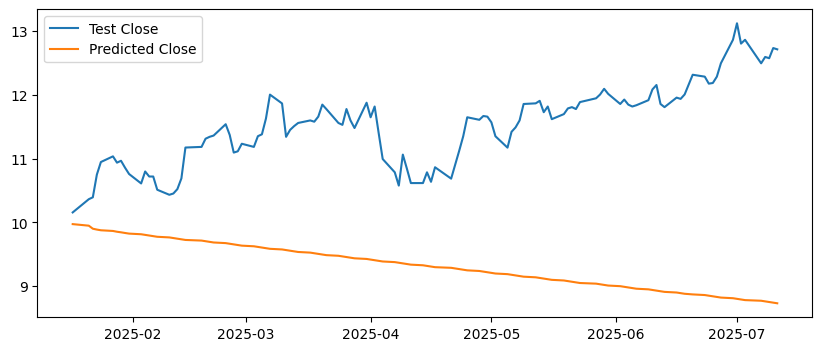

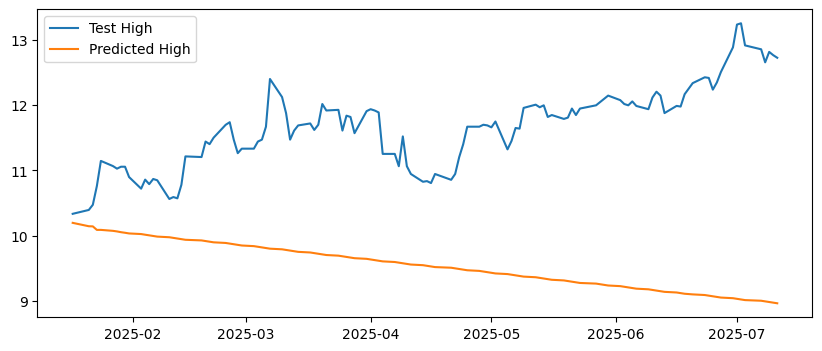

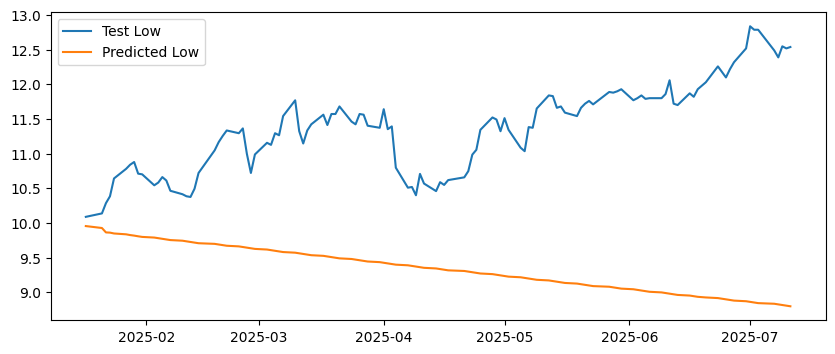

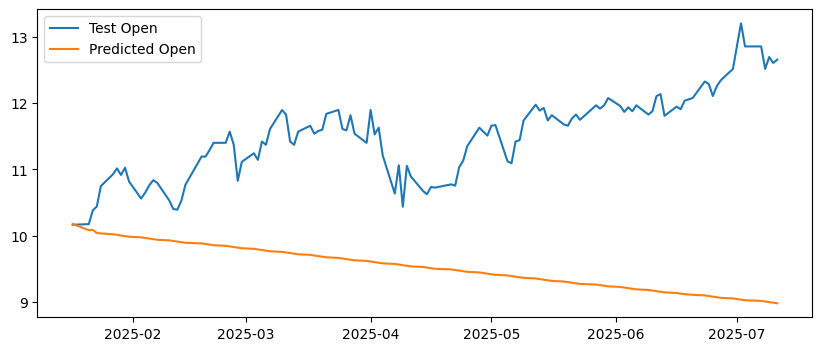

In [ ]:
for i in AAPL.columns[:4]:

    plt.rcParams["figure.figsize"] = [10,4]
    plt.plot(testX[str(i)], label='Test '+str(i))
    res_indexed = res.set_index(testX.index)
    plt.plot(res_indexed[str(i)+'_inv_diff'], label='Predicted '+str(i))
    plt.legend(loc='best')
    plt.show()

## **Time Series Modelling for Infosys**

### **Test for Stationarity and Cointegration**

In [ ]:
for name, column in INFY[INFY.columns].items():
    Augmented_Dickey_Fuller_Test_func(INFY[name],name)
    print('\n')

Results of Dickey-Fuller Test for column: Close
ADF Test Statistic        -3.058792
P-Value                    0.029757
# Lags Used                0.000000
# Observations Used     1254.000000
Critical Value (1%)       -3.435575
Critical Value (5%)       -2.863848
Critical Value (10%)      -2.567999
dtype: float64

Conclusion:
Reject the null hypothesis
Data is stationary


Results of Dickey-Fuller Test for column: High
ADF Test Statistic        -2.651387
P-Value                    0.082835
# Lags Used                3.000000
# Observations Used     1251.000000
Critical Value (1%)       -3.435588
Critical Value (5%)       -2.863853
Critical Value (10%)      -2.568002
dtype: float64

Conclusion:
Fail to reject the null hypothesis
Data is non-stationary


Results of Dickey-Fuller Test for column: Low
ADF Test Statistic        -3.098670
P-Value                    0.026652
# Lags Used                0.000000
# Observations Used     1254.000000
Critical Value (1%)       -3.435575
Critical Va

In [ ]:
X = INFY

trainX, testX = time_train_test_split(X, test_size=120)

In [ ]:
train_diff = trainX.diff()
train_diff.dropna(inplace = True)

In [ ]:
for name, column in train_diff.items():
    Augmented_Dickey_Fuller_Test_func(train_diff[name],name)
    print('\n')

Results of Dickey-Fuller Test for column: Close
ADF Test Statistic       -33.971582
P-Value                    0.000000
# Lags Used                0.000000
# Observations Used     1133.000000
Critical Value (1%)       -3.436135
Critical Value (5%)       -2.864094
Critical Value (10%)      -2.568130
dtype: float64

Conclusion:
Reject the null hypothesis
Data is stationary


Results of Dickey-Fuller Test for column: High
ADF Test Statistic     -1.875500e+01
P-Value                 2.027113e-30
# Lags Used             2.000000e+00
# Observations Used     1.131000e+03
Critical Value (1%)    -3.436145e+00
Critical Value (5%)    -2.864099e+00
Critical Value (10%)   -2.568132e+00
dtype: float64

Conclusion:
Reject the null hypothesis
Data is stationary


Results of Dickey-Fuller Test for column: Low
ADF Test Statistic       -32.556547
P-Value                    0.000000
# Lags Used                0.000000
# Observations Used     1133.000000
Critical Value (1%)       -3.436135
Critical Value (

In [ ]:
cointegration_test_func(train_diff)

Column_Name  >  Test_Stat  >  C(95%)  =>  Signif  
 --------------------------------------------------
Close    >   1929.55     >   60.0627    =>  True
High     >   1404.54     >   40.1749    =>  True
Low      >   931.59      >   24.2761    =>  True
Open     >   512.18      >   12.3212    =>  True
Volume   >   185.17      >   4.1296     =>  True


### **VAR Modelling of Infosys**

In [ ]:
resu = []
INFY_results_VAR = pd.DataFrame()

for i in [1,2,3,4,5,6,7,8,9]:
    fit_v = VAR(train_diff).fit(i)
    aic = fit_v.aic
    bic = fit_v.bic
    df1 = pd.DataFrame([{'AR_Term':i, 'AIC': aic, 'BIC': bic}])
    INFY_results_VAR = pd.concat([INFY_results_VAR, df1], ignore_index=True)
    clist = ['AR_Term','AIC','BIC']
    INFY_results_VAR = INFY_results_VAR[clist]

Selecting best lag order for VAR modelling of Apple using AIC and BIC criterion.

In [ ]:
INFY_results_VAR.sort_values(by=['AIC', 'BIC'], ascending=True).head(1)

,AR_Term,AIC,BIC
8,9,13.789802,14.817245


In [ ]:
AR_Term_value_VAR = best_values_VAR['AR_Term'].iloc[0]

print("AR_Term_value_VAR: ", AR_Term_value_VAR)

AR_Term_value_VAR:  9


In [ ]:
model = VAR(train_diff).fit(int(AR_Term_value_VAR))

result = model.forecast(y=train_diff.values, steps=len(testX))

In [ ]:
model.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 22, Sep, 2025
Time:                     09:28:10
--------------------------------------------------------------------
No. of Equations:         5.00000    BIC:                    14.8172
Nobs:                     1125.00    HQIC:                   14.1781
Log likelihood:          -15508.3    FPE:                    974841.
AIC:                      13.7898    Det(Omega_mle):         797833.
--------------------------------------------------------------------
Results for equation Close
               coefficient       std. error           t-stat            prob
----------------------------------------------------------------------------
const             0.009344         0.008921            1.047           0.295
L1.Close          0.011047         0.102323            0.108           0.914
L1.High          -0.183532         0.126275           -1.453           0.146

In [ ]:
INFY_pred = pd.DataFrame(result, columns=train_diff.columns)
INFY_pred["new_index"] = range(len(trainX), len(X))
INFY_pred = INFY_pred.set_index("new_index")
INFY_pred.head()

,Close,High,Low,Open,Volume
new_index,,,,,
1135,-0.326614,-0.969269,-0.281971,-1.243382,-6.277946e+06
1136,0.069405,-0.103867,0.037971,-0.088698,-3.002399e+06
1137,0.083741,0.165911,0.086239,0.112785,-3.484781e+05
1138,0.054542,-0.034607,0.051525,0.024293,-1.686113e+06
1139,0.068948,0.221403,0.114968,0.217161,2.181476e+06


### **Forecast Values**

In [ ]:
res = inverse_diff_func(trainX, INFY_pred)
res.head()

,Close,High,Low,Open,Volume,Close_inv_diff,High_inv_diff,Low_inv_diff,Open_inv_diff,Volume_inv_diff
new_index,,,,,,,,,,
1135,-0.326614,-0.969269,-0.281971,-1.243382,-6.277946e+06,20.943088,21.316095,20.731351,21.041982,1.664475e+07
1136,0.069405,-0.103867,0.037971,-0.088698,-3.002399e+06,21.012494,21.212227,20.769322,20.953284,1.364235e+07
1137,0.083741,0.165911,0.086239,0.112785,-3.484781e+05,21.096235,21.378138,20.855561,21.066069,1.329388e+07
1138,0.054542,-0.034607,0.051525,0.024293,-1.686113e+06,21.150776,21.343531,20.907087,21.090362,1.160776e+07
1139,0.068948,0.221403,0.114968,0.217161,2.181476e+06,21.219724,21.564934,21.022055,21.307523,1.378924e+07


In [ ]:
for i in ['Open', 'High', 'Low', 'Close' ]:
    print(f'Evaluation metric for {i}')
    timeseries_evaluation_metrics_func(testX[str(i)] , res[str(i)+'_inv_diff'])

Evaluation metric for Open
Evaluation metric results: 
MSE is : 12.5937595556242
MAE is : 3.1186251372773675
RMSE is : 3.5487687379743695
MAPE is : 17.428783783035968
R2 is : -4.298701810422953

Evaluation metric for High
Evaluation metric results: 
MSE is : 13.299459927067439
MAE is : 3.2241731386755683
RMSE is : 3.6468424598640725
MAPE is : 17.841055081687173
R2 is : -4.689509687806025

Evaluation metric for Low
Evaluation metric results: 
MSE is : 11.902360406897719
MAE is : 3.0255806582821965
RMSE is : 3.4499797690562937
MAPE is : 17.082625287983642
R2 is : -3.8565584782212925

Evaluation metric for Close
Evaluation metric results: 
MSE is : 12.424316776002952
MAE is : 3.103121336376272
RMSE is : 3.5248144314279797
MAPE is : 17.34744847141579
R2 is : -4.073633703070646



### **Forecast Plots**

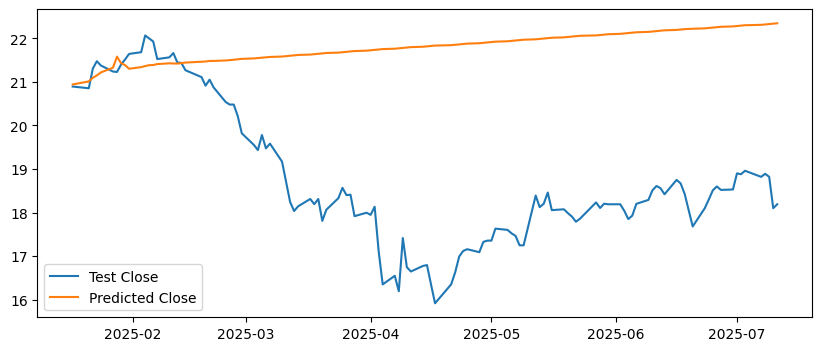

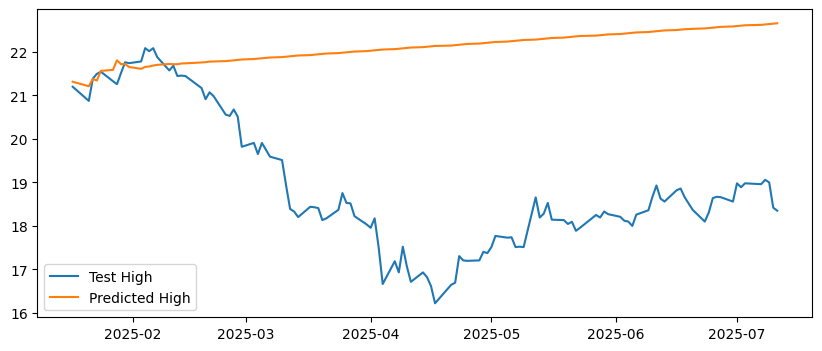

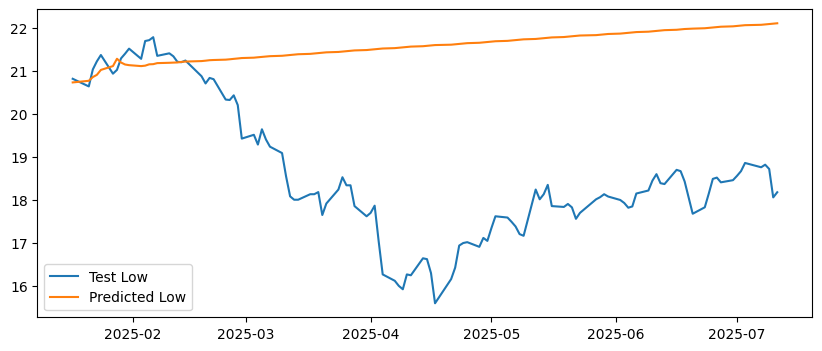

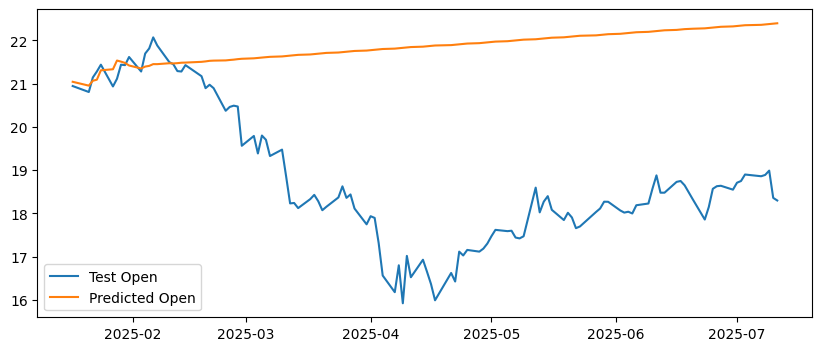

In [ ]:
for i in INFY.columns[:4]:

    plt.rcParams["figure.figsize"] = [10,4]
    plt.plot(testX[str(i)], label='Test '+str(i))
    res_indexed = res.set_index(testX.index)
    plt.plot(res_indexed[str(i)+'_inv_diff'], label='Predicted '+str(i))
    plt.legend(loc='best')
    plt.show()

### **VARMA Modelling of Infosys**

In [ ]:
pq = []
for name, column in train_diff[INFY.columns].items():
    print(f'Searching order of p and q for : {name}')
    stepwise_model = auto_arima(train_diff[name],start_p=1, start_q=1,max_p=7, max_q=7, seasonal=False,
        trace=True,error_action='ignore',suppress_warnings=True, stepwise=True,maxiter=1000)
    parameter = stepwise_model.get_params().get('order')
    print(f'optimal order for:{name} is: {parameter} \n\n')
    pq.append(stepwise_model.get_params().get('order'))

Searching order of p and q for : Close
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=3510.300, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=3576.877, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=3538.201, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=3549.535, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=3500.922, Time=0.72 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=3499.797, Time=0.75 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=3500.572, Time=0.72 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=3500.381, Time=0.76 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=3501.761, Time=0.40 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0]          
Total fit time: 3.671 seconds
optimal order for:Close is: (2, 0, 0) 


Searching order of p and q for : High
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=3364.965, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=3467.381, Time=0.

In [ ]:
pq

[(2, 0, 0), (3, 0, 3), (6, 0, 0), (2, 0, 0), (1, 0, 2)]

In [ ]:
INFY_results_VARMA = pd.DataFrame(columns=['p', 'q','RMSE Open','RMSE High','RMSE Low','RMSE Close'])

for i in pq:
    if i[0]== 0 and i[2] ==0:
        pass
    else:
        print(f' Running for {i}')
        model = VARMAX(train_diff, order=(i[0],i[2])).fit(disp=False,method="nm")
        result = model.forecast(steps = len(testX))
        inv_res = inverse_diff_func(trainX, result)
        openrmse = np.sqrt(metrics.mean_squared_error(testX.Open, inv_res.Open_inv_diff))
        highrmse = np.sqrt(metrics.mean_squared_error(testX.High, inv_res.High_inv_diff))
        lowrmse = np.sqrt(metrics.mean_squared_error(testX.Low, inv_res.Low_inv_diff))
        closermse = np.sqrt(metrics.mean_squared_error(testX.Close, inv_res.Close_inv_diff))
        df1=pd.DataFrame([{'p': i[0], 'q': i[2], 'RMSE Open':openrmse,'RMSE High':highrmse,'RMSE Low':lowrmse,'RMSE Close':closermse }])

        INFY_results_VARMA = pd.concat([INFY_results_VARMA,df1],ignore_index=True)

 Running for (2, 0, 0)
 Running for (3, 0, 3)
 Running for (6, 0, 0)
 Running for (2, 0, 0)
 Running for (1, 0, 2)


In [ ]:
INFY_results_VARMA

,p,q,RMSE Open,RMSE High,RMSE Low,RMSE Close
0,2,0,2.168843,2.299059,2.221938,2.380911
1,3,3,3172.948266,3443.364065,3772.717573,3697.476001
2,6,0,2.208509,2.308189,2.244648,2.354010
3,2,0,2.168843,2.299059,2.221938,2.380911
4,1,2,4074.155410,5665.587572,15697.005211,13410.813572


In [ ]:
best_values_VARMA = INFY_results_VARMA.sort_values(by=['RMSE Open', 'RMSE High',
                                                       'RMSE Low', 'RMSE Close']).head(1)
best_values_VARMA


,p,q,RMSE Open,RMSE High,RMSE Low,RMSE Close
0,2,0,2.168843,2.299059,2.221938,2.380911


In [ ]:
p_value_VARMA = best_values_VARMA['p'].iloc[0]
q_value_VARMA = best_values_VARMA['q'].iloc[0]

print("p_value_VARMA_2: ", p_value_VARMA)
print("q_value_VARMA_2: ", q_value_VARMA)

p_value_VARMA_2:  2
q_value_VARMA_2:  0


In [ ]:
model = VARMAX(train_diff,
               order=(int(p_value_VARMA),int(q_value_VARMA))).fit(disp=False,method='nm')
result = model.forecast(steps = len(testX))

In [ ]:
INFY_pred = pd.DataFrame(result, columns=train_diff.columns)
INFY_pred["new_index"] = range(len(trainX), len(X))
INFY_pred = INFY_pred.set_index("new_index")
INFY_pred.head()

,Close,High,Low,Open,Volume
new_index,,,,,
1135,-0.074862,-0.158333,-0.093605,-0.146937,-2.749582e+06
1136,-0.024428,-0.051925,-0.027999,-0.092636,-3.969213e+05
1137,-0.047516,-0.002137,-0.063512,0.004727,1.009669e+06
1138,-0.013569,-0.053943,-0.003019,-0.047403,-2.409845e+05
1139,-0.011005,0.000290,-0.012284,-0.006194,-4.306497e+04


### **Forecast Values**

In [ ]:
res = inverse_diff_func(trainX, INFY_pred)
res.head()

,Close,High,Low,Open,Volume,Close_inv_diff,High_inv_diff,Low_inv_diff,Open_inv_diff,Volume_inv_diff
new_index,,,,,,,,,,
1135,-0.074862,-0.158333,-0.093605,-0.146937,-2.749582e+06,9.972332,10.195420,9.953589,10.177149,1.221622e+07
1136,-0.024428,-0.051925,-0.027999,-0.092636,-3.969213e+05,9.947904,10.143495,9.925590,10.084513,1.181930e+07
1137,-0.047516,-0.002137,-0.063512,0.004727,1.009669e+06,9.900388,10.141358,9.862078,10.089240,1.282897e+07
1138,-0.013569,-0.053943,-0.003019,-0.047403,-2.409845e+05,9.886819,10.087414,9.859059,10.041837,1.258798e+07
1139,-0.011005,0.000290,-0.012284,-0.006194,-4.306497e+04,9.875814,10.087705,9.846775,10.035643,1.254492e+07


In [ ]:
for i in ['Open', 'High', 'Low', 'Close']:
    print(f'Evaluation metric for {i}')
    timeseries_evaluation_metrics_func(testX[str(i)] , res[str(i)+'_inv_diff'])


Evaluation metric for Open
Evaluation metric results: 
MSE is : 4.70387794559579
MAE is : 1.9706927087208002
RMSE is : 2.1688425359153647
MAPE is : 16.770092851794814
R2 is : -10.843760652602509

Evaluation metric for High
Evaluation metric results: 
MSE is : 5.285671737147791
MAE is : 2.1136180520213466
RMSE is : 2.2990588807483356
MAPE is : 17.78549698383645
R2 is : -13.13647269689577

Evaluation metric for Low
Evaluation metric results: 
MSE is : 4.937009700667724
MAE is : 2.02898447603767
RMSE is : 2.221938275620573
MAPE is : 17.471874338570746
R2 is : -11.4902614932426

Evaluation metric for Close
Evaluation metric results: 
MSE is : 5.668739367600676
MAE is : 2.1963854103107194
RMSE is : 2.3809114573206362
MAPE is : 18.705685657999396
R2 is : -13.830039976523688



### **Forecast Plots**

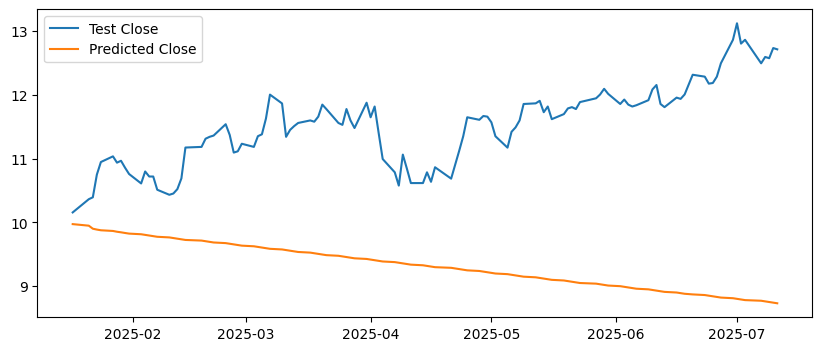

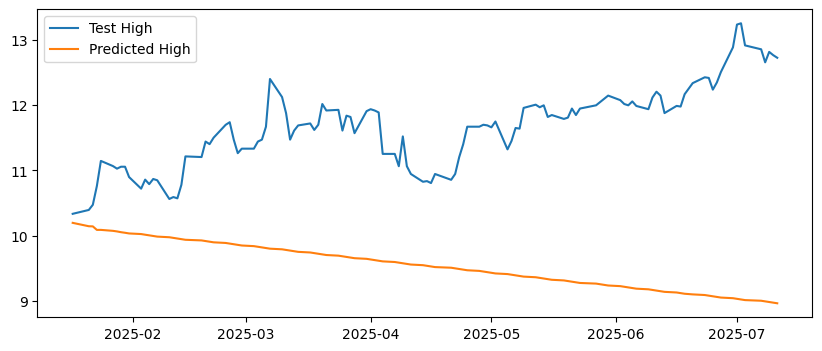

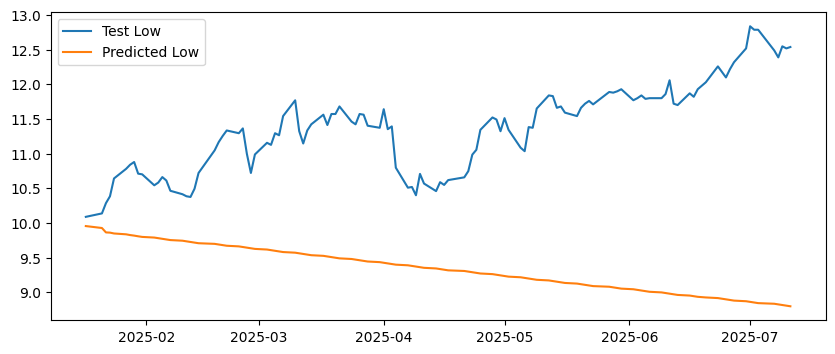

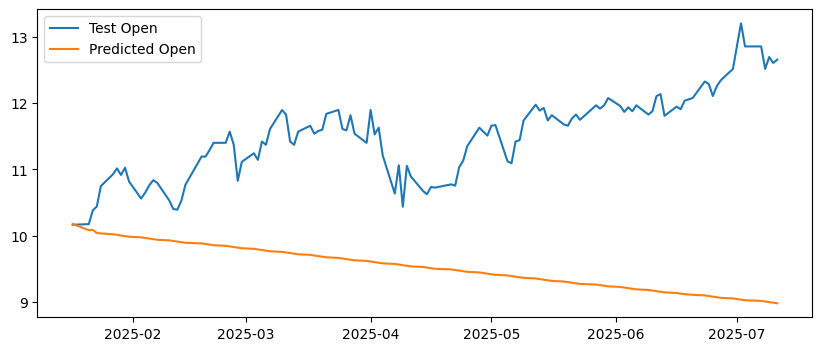

In [ ]:
for i in INFY.columns[:4]:

    plt.rcParams["figure.figsize"] = [10,4]
    plt.plot(testX[str(i)], label='Test '+str(i))
    res_indexed = res.set_index(testX.index)
    plt.plot(res_indexed[str(i)+'_inv_diff'], label='Predicted '+str(i))
    plt.legend(loc='best')
    plt.show()

## **Time Series Modelling for PSKY**

### **Stationarity and Cointegration Tests**

In [ ]:
for name, column in PSKY[PSKY.columns].items():
    Augmented_Dickey_Fuller_Test_func(PSKY[name],name)
    print('\n')

Results of Dickey-Fuller Test for column: Close
ADF Test Statistic        -2.430224
P-Value                    0.133387
# Lags Used                5.000000
# Observations Used     1249.000000
Critical Value (1%)       -3.435596
Critical Value (5%)       -2.863857
Critical Value (10%)      -2.568004
dtype: float64

Conclusion:
Fail to reject the null hypothesis
Data is non-stationary


Results of Dickey-Fuller Test for column: High
ADF Test Statistic        -2.449687
P-Value                    0.128201
# Lags Used                4.000000
# Observations Used     1250.000000
Critical Value (1%)       -3.435592
Critical Value (5%)       -2.863855
Critical Value (10%)      -2.568003
dtype: float64

Conclusion:
Fail to reject the null hypothesis
Data is non-stationary


Results of Dickey-Fuller Test for column: Low
ADF Test Statistic        -1.972449
P-Value                    0.298782
# Lags Used                9.000000
# Observations Used     1245.000000
Critical Value (1%)       -3.435613

In [ ]:
X = PSKY

trainX, testX = time_train_test_split(X, test_size=120)

In [ ]:
train_diff = trainX.diff()
train_diff.dropna(inplace = True)

In [ ]:
for name, column in train_diff.items():
    Augmented_Dickey_Fuller_Test_func(train_diff[name],name)
    print('\n')

Results of Dickey-Fuller Test for column: Close
ADF Test Statistic     -1.772408e+01
P-Value                 3.457999e-30
# Lags Used             1.000000e+00
# Observations Used     1.132000e+03
Critical Value (1%)    -3.436140e+00
Critical Value (5%)    -2.864097e+00
Critical Value (10%)   -2.568131e+00
dtype: float64

Conclusion:
Reject the null hypothesis
Data is stationary


Results of Dickey-Fuller Test for column: High
ADF Test Statistic     -1.298908e+01
P-Value                 2.837358e-24
# Lags Used             3.000000e+00
# Observations Used     1.130000e+03
Critical Value (1%)    -3.436150e+00
Critical Value (5%)    -2.864101e+00
Critical Value (10%)   -2.568134e+00
dtype: float64

Conclusion:
Reject the null hypothesis
Data is stationary


Results of Dickey-Fuller Test for column: Low
ADF Test Statistic     -1.214407e+01
P-Value                 1.625892e-22
# Lags Used             8.000000e+00
# Observations Used     1.125000e+03
Critical Value (1%)    -3.436176e+00
Crit

In [ ]:
cointegration_test_func(train_diff)

Column_Name  >  Test_Stat  >  C(95%)  =>  Signif  
 --------------------------------------------------
Close    >   1933.46     >   60.0627    =>  True
High     >   1322.61     >   40.1749    =>  True
Low      >   852.29      >   24.2761    =>  True
Open     >   448.42      >   12.3212    =>  True
Volume   >   127.4       >   4.1296     =>  True


### **VAR Modelling of PSKY**

In [ ]:
resu = []
PSKY_results_VAR = pd.DataFrame()

for i in [1,2,3,4,5,6,7,8,9]:
    fit_v = VAR(train_diff).fit(i)
    aic = fit_v.aic
    bic = fit_v.bic
    df1 = pd.DataFrame([{'AR_Term':i, 'AIC': aic, 'BIC': bic}])
    PSKY_results_VAR = pd.concat([PSKY_results_VAR, df1], ignore_index=True)
    clist = ['AR_Term','AIC','BIC']
    PSKY_results_VAR = PSKY_results_VAR[clist]

Best Lag Order Selection:

In [ ]:
PSKY_results_VAR.sort_values(by=['AIC', 'BIC'], ascending=True).head(1)

,AR_Term,AIC,BIC
8,9,25.837507,26.864951


Lag Order 9 is selected by AIC/BIC criterion.

In [ ]:
AR_Term_value_VAR = best_values_VAR['AR_Term'].iloc[0]

print("AR_Term_value_VAR: ", AR_Term_value_VAR)

AR_Term_value_VAR:  9


In [ ]:
model = VAR(train_diff).fit(int(AR_Term_value_VAR))

result = model.forecast(y=train_diff.values, steps=len(testX))

In [ ]:
model.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 22, Sep, 2025
Time:                     09:31:44
--------------------------------------------------------------------
No. of Equations:         5.00000    BIC:                    26.8650
Nobs:                     1125.00    HQIC:                   26.2258
Log likelihood:          -22285.1    FPE:                1.66412e+11
AIC:                      25.8375    Det(Omega_mle):     1.36196e+11
--------------------------------------------------------------------
Results for equation Close
               coefficient       std. error           t-stat            prob
----------------------------------------------------------------------------
const            -0.007292         0.029937           -0.244           0.808
L1.Close          0.579207         0.086121            6.726           0.000
L1.High          -0.454538         0.089450           -5.081           0.000

In [ ]:
PSKY_pred = pd.DataFrame(result, columns=train_diff.columns)
PSKY_pred["new_index"] = range(len(trainX), len(X))
PSKY_pred = PSKY_pred.set_index("new_index")
PSKY_pred.head()

,Close,High,Low,Open,Volume
new_index,,,,,
1135,-0.008262,-0.139768,-0.170591,-0.241845,-3.244803e+06
1136,-0.062477,-0.026776,-0.045091,-0.011352,-6.507917e+05
1137,-0.000842,-0.043014,0.051222,0.000797,-1.514253e+05
1138,-0.004404,-0.089306,0.055088,-0.029124,-5.667851e+05
1139,-0.081800,-0.000490,-0.134426,-0.072283,6.723344e+05


### **Forecast Values**

In [ ]:
res = inverse_diff_func(trainX, PSKY_pred)
res.head()

,Close,High,Low,Open,Volume,Close_inv_diff,High_inv_diff,Low_inv_diff,Open_inv_diff,Volume_inv_diff
new_index,,,,,,,,,,
1135,-0.008262,-0.139768,-0.170591,-0.241845,-3.244803e+06,10.038932,10.213985,9.876603,10.082240,1.172100e+07
1136,-0.062477,-0.026776,-0.045091,-0.011352,-6.507917e+05,9.976455,10.187209,9.831512,10.070888,1.107020e+07
1137,-0.000842,-0.043014,0.051222,0.000797,-1.514253e+05,9.975614,10.144195,9.882733,10.071685,1.091878e+07
1138,-0.004404,-0.089306,0.055088,-0.029124,-5.667851e+05,9.971209,10.054889,9.937821,10.042561,1.035199e+07
1139,-0.081800,-0.000490,-0.134426,-0.072283,6.723344e+05,9.889409,10.054400,9.803396,9.970278,1.102433e+07


In [ ]:
for i in ['Open', 'High', 'Low', 'Close' ]:
    print(f'Evaluation metric for {i}')
    timeseries_evaluation_metrics_func(testX[str(i)] , res[str(i)+'_inv_diff'])

Evaluation metric for Open
Evaluation metric results: 
MSE is : 5.519780664619794
MAE is : 2.1419379585053293
RMSE is : 2.3494213467617495
MAPE is : 18.23912439336702
R2 is : -12.898098930868345

Evaluation metric for High
Evaluation metric results: 
MSE is : 5.928509557047675
MAE is : 2.239564938500416
RMSE is : 2.4348530873643432
MAPE is : 18.849000023492312
R2 is : -14.85573559127491

Evaluation metric for Low
Evaluation metric results: 
MSE is : 5.5161015990215905
MAE is : 2.1452819885866696
RMSE is : 2.348638243540625
MAPE is : 18.476695700285532
R2 is : -12.955320238839112

Evaluation metric for Close
Evaluation metric results: 
MSE is : 5.94685964254217
MAE is : 2.242920544435203
RMSE is : 2.438618388051351
MAPE is : 19.09531848216756
R2 is : -14.557632925890463



### **Forecast Plots**

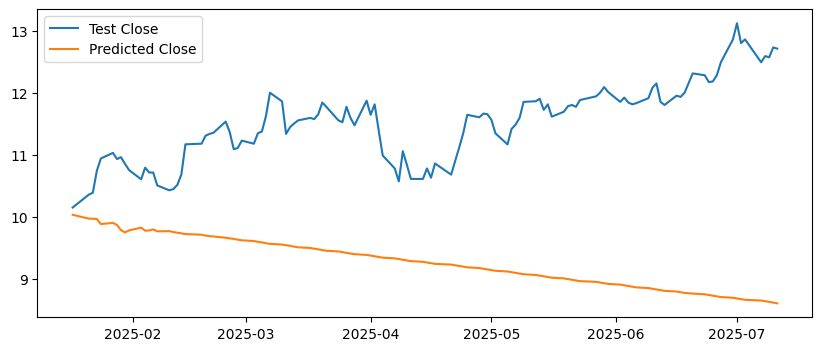

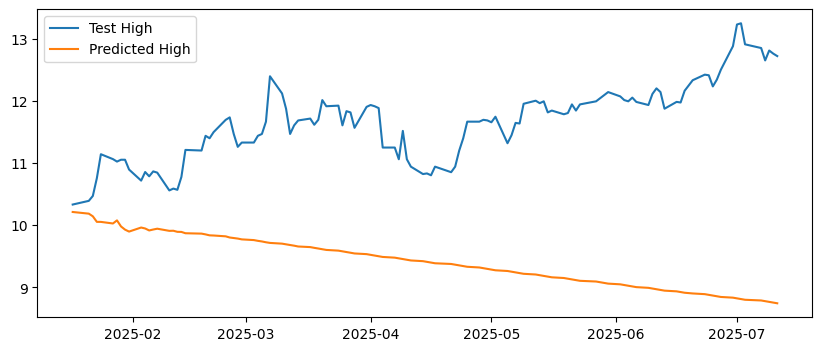

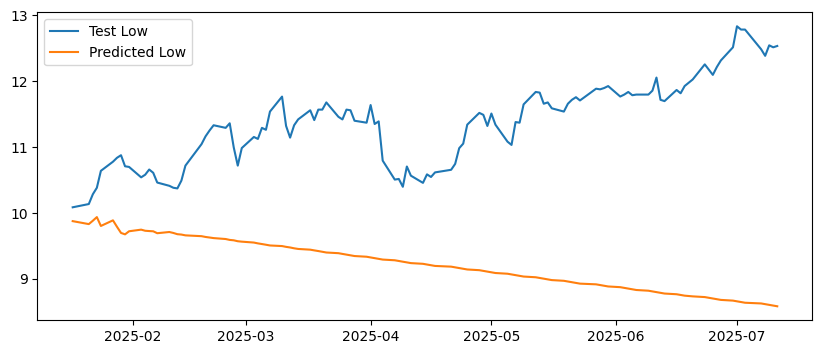

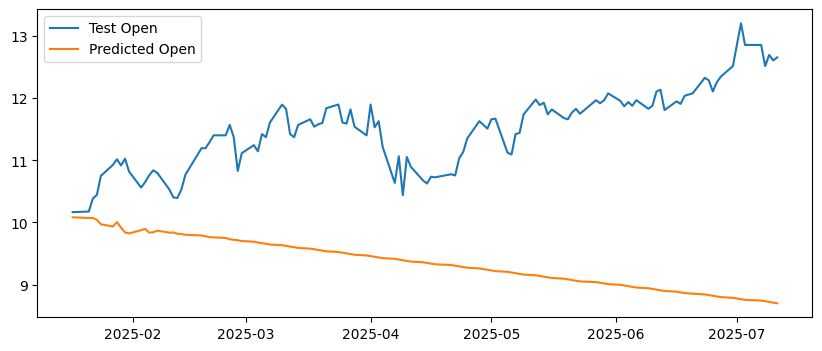

In [ ]:
for i in PSKY.columns[:4]:

    plt.rcParams["figure.figsize"] = [10,4]
    plt.plot(testX[str(i)], label='Test '+str(i))
    res_indexed = res.set_index(testX.index)
    plt.plot(res_indexed[str(i)+'_inv_diff'], label='Predicted '+str(i))
    plt.legend(loc='best')
    plt.show()

### **VARMA Modelling of PSKY**

In [ ]:
pq = []
for name, column in train_diff[PSKY.columns].items():
    print(f'Searching order of p and q for : {name}')
    stepwise_model = auto_arima(train_diff[name],start_p=1, start_q=1,max_p=7, max_q=7, seasonal=False,
        trace=True,error_action='ignore',suppress_warnings=True, stepwise=True,maxiter=1000)
    parameter = stepwise_model.get_params().get('order')
    print(f'optimal order for:{name} is: {parameter} \n\n')
    pq.append(stepwise_model.get_params().get('order'))

Searching order of p and q for : Close
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=3510.300, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=3576.877, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=3538.201, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=3549.535, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=3500.922, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=3499.797, Time=0.09 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=3500.572, Time=0.13 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=3500.381, Time=0.36 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=3501.761, Time=0.19 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0]          
Total fit time: 1.484 seconds
optimal order for:Close is: (2, 0, 0) 


Searching order of p and q for : High
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=3364.965, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=3467.381, Time=0.

In [ ]:
pq

[(2, 0, 0), (3, 0, 3), (6, 0, 0), (2, 0, 0), (1, 0, 2)]

In [ ]:
PSKY_results_VARMA = pd.DataFrame(columns=['p', 'q','RMSE Open','RMSE High','RMSE Low','RMSE Close'])

for i in pq:
    if i[0]== 0 and i[2] ==0:
        pass
    else:
        print(f' Running for {i}')
        model = VARMAX(train_diff, order=(i[0],i[2])).fit(disp=False,method="nm")
        result = model.forecast(steps = len(testX))
        inv_res = inverse_diff_func(trainX, result)
        openrmse = np.sqrt(metrics.mean_squared_error(testX.Open, inv_res.Open_inv_diff))
        highrmse = np.sqrt(metrics.mean_squared_error(testX.High, inv_res.High_inv_diff))
        lowrmse = np.sqrt(metrics.mean_squared_error(testX.Low, inv_res.Low_inv_diff))
        closermse = np.sqrt(metrics.mean_squared_error(testX.Close, inv_res.Close_inv_diff))
        df1=pd.DataFrame([{'p': i[0], 'q': i[2], 'RMSE Open':openrmse,'RMSE High':highrmse,'RMSE Low':lowrmse,'RMSE Close':closermse }])

        PSKY_results_VARMA = pd.concat([PSKY_results_VARMA,df1],ignore_index=True)

 Running for (2, 0, 0)
 Running for (3, 0, 3)
 Running for (6, 0, 0)
 Running for (2, 0, 0)
 Running for (1, 0, 2)


In [ ]:
PSKY_results_VARMA

,p,q,RMSE Open,RMSE High,RMSE Low,RMSE Close
0,2,0,2.168843,2.299059,2.221938,2.380911
1,3,3,3172.948266,3443.364065,3772.717573,3697.476001
2,6,0,2.208509,2.308189,2.244648,2.354010
3,2,0,2.168843,2.299059,2.221938,2.380911
4,1,2,4074.155410,5665.587572,15697.005211,13410.813572


In [ ]:
best_values_VARMA = PSKY_results_VARMA.sort_values(by=['RMSE Open', 'RMSE High',
                                                       'RMSE Low', 'RMSE Close']).head(1)
best_values_VARMA

,p,q,RMSE Open,RMSE High,RMSE Low,RMSE Close
0,2,0,2.168843,2.299059,2.221938,2.380911


In [ ]:
p_value_VARMA = best_values_VARMA['p'].iloc[0]
q_value_VARMA = best_values_VARMA['q'].iloc[0]

print("p_value_VARMA: ", p_value_VARMA)
print("q_value_VARMA: ", q_value_VARMA)

p_value_VARMA:  2
q_value_VARMA:  0


In [ ]:
model = VARMAX(train_diff,
               order=(int(p_value_VARMA),int(q_value_VARMA))).fit(disp=False,method='nm')
result = model.forecast(steps = len(testX))

In [ ]:
PSKY_pred = pd.DataFrame(result, columns=train_diff.columns)
PSKY_pred["new_index"] = range(len(trainX), len(X))
PSKY_pred = PSKY_pred.set_index("new_index")
PSKY_pred.head()

,Close,High,Low,Open,Volume
new_index,,,,,
1135,-0.074862,-0.158333,-0.093605,-0.146937,-2.749582e+06
1136,-0.024428,-0.051925,-0.027999,-0.092636,-3.969213e+05
1137,-0.047516,-0.002137,-0.063512,0.004727,1.009669e+06
1138,-0.013569,-0.053943,-0.003019,-0.047403,-2.409845e+05
1139,-0.011005,0.000290,-0.012284,-0.006194,-4.306497e+04


### **Forecast Values**

In [ ]:
res = inverse_diff_func(trainX, PSKY_pred)
res.head()

,Close,High,Low,Open,Volume,Close_inv_diff,High_inv_diff,Low_inv_diff,Open_inv_diff,Volume_inv_diff
new_index,,,,,,,,,,
1135,-0.074862,-0.158333,-0.093605,-0.146937,-2.749582e+06,9.972332,10.195420,9.953589,10.177149,1.221622e+07
1136,-0.024428,-0.051925,-0.027999,-0.092636,-3.969213e+05,9.947904,10.143495,9.925590,10.084513,1.181930e+07
1137,-0.047516,-0.002137,-0.063512,0.004727,1.009669e+06,9.900388,10.141358,9.862078,10.089240,1.282897e+07
1138,-0.013569,-0.053943,-0.003019,-0.047403,-2.409845e+05,9.886819,10.087414,9.859059,10.041837,1.258798e+07
1139,-0.011005,0.000290,-0.012284,-0.006194,-4.306497e+04,9.875814,10.087705,9.846775,10.035643,1.254492e+07


In [ ]:
for i in ['Open', 'High', 'Low', 'Close']:
    print(f'Evaluation metric for {i}')
    timeseries_evaluation_metrics_func(testX[str(i)] , res[str(i)+'_inv_diff'])


Evaluation metric for Open
Evaluation metric results: 
MSE is : 4.70387794559579
MAE is : 1.9706927087208002
RMSE is : 2.1688425359153647
MAPE is : 16.770092851794814
R2 is : -10.843760652602509

Evaluation metric for High
Evaluation metric results: 
MSE is : 5.285671737147791
MAE is : 2.1136180520213466
RMSE is : 2.2990588807483356
MAPE is : 17.78549698383645
R2 is : -13.13647269689577

Evaluation metric for Low
Evaluation metric results: 
MSE is : 4.937009700667724
MAE is : 2.02898447603767
RMSE is : 2.221938275620573
MAPE is : 17.471874338570746
R2 is : -11.4902614932426

Evaluation metric for Close
Evaluation metric results: 
MSE is : 5.668739367600676
MAE is : 2.1963854103107194
RMSE is : 2.3809114573206362
MAPE is : 18.705685657999396
R2 is : -13.830039976523688



### **Forecast Plots**

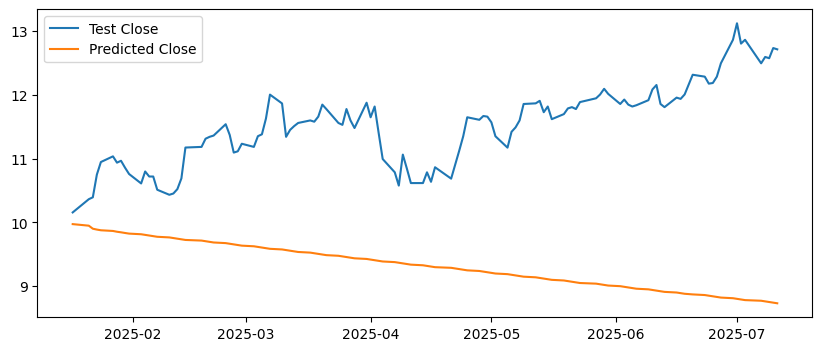

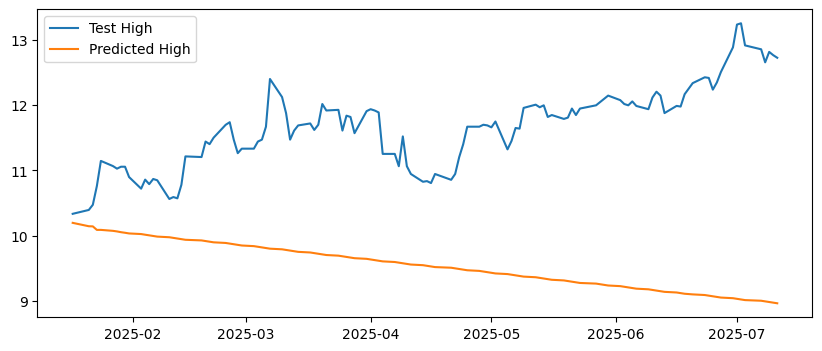

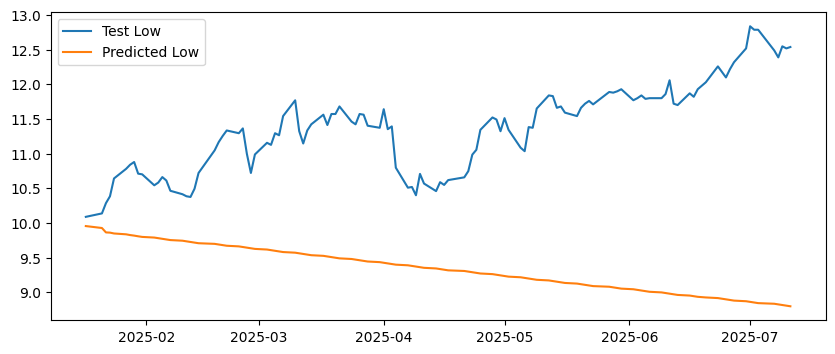

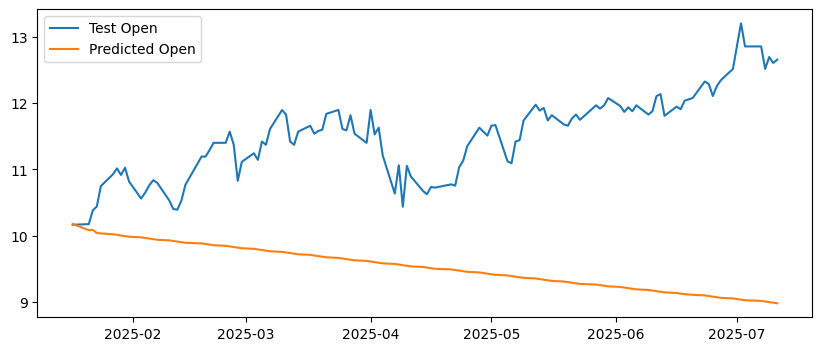

In [ ]:
for i in PSKY.columns[:4]:

    plt.rcParams["figure.figsize"] = [10,4]
    plt.plot(testX[str(i)], label='Test '+str(i))
    res_indexed = res.set_index(testX.index)
    plt.plot(res_indexed[str(i)+'_inv_diff'], label='Predicted '+str(i))
    plt.legend(loc='best')
    plt.show()

# **Deep Learning Models**
Here, we will split the data with 21 days as the window which will predict one day in the future.

## **Data Prep**

In [11]:
%%capture
!pip install keras-tuner

In [9]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error, root_mean_squared_error
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
import numpy as np

class Data:
    def __init__(self, n_timesteps):
        self.n_timesteps = n_timesteps

    def prep_data(self, df):
        # Assuming df has columns ["Close", "High", "Low", "Open", "Volume"]
        data = df.values
        scaler = MinMaxScaler(feature_range=(0, 1))
        scaled_data = scaler.fit_transform(data)

        X, y = [], []
        for i in range(self.n_timesteps, len(scaled_data)):
            X.append(scaled_data[i - self.n_timesteps:i])
            y.append(scaled_data[i, :4]) # Only take the first 4 features for y

        X, y = np.array(X), np.array(y)
        return X, y, scaler

    def train_test_split(self, df):
        # Assuming df has columns ["Close", "High", "Low", "Open", "Volume"]
        data = df.values
        scaler = MinMaxScaler(feature_range=(0, 1))
        scaled_data = scaler.fit_transform(data)

        X, y = [], []
        for i in range(self.n_timesteps, len(scaled_data)):
            X.append(scaled_data[i - self.n_timesteps:i])
            y.append(scaled_data[i, :4]) # Only take the first 4 features for y

        X, y = np.array(X), np.array(y)

        train_size = int(len(X) * 0.8)
        X_train, X_test = X[0:train_size], X[train_size:len(X)]
        y_train, y_test = y[0:train_size], y[train_size:len(y)]
        return X_train, y_train, X_test, y_test, scaler, train_size

    def plot(self,df, X_train, y_train, X_test, y_test, scaler, model, split_index, model_name=""):
        """
        Plots the training and testing predictions against the actual data for each feature.
        """
        train_actual_color = "#23B2DE"
        train_predicted_color = "#20063F"
        test_actual_color = "#E98B06"
        test_predicted_color = "#510A0A"

        n_features = scaler.n_features_in_

        # Predictions
        y_train_predict = model.predict(X_train)
        y_test_predict = model.predict(X_test)

        # Pad actual values
        y_train_padded = np.zeros((y_train.shape[0], n_features))
        y_train_padded[:, :4] = y_train
        y_test_padded = np.zeros((y_test.shape[0], n_features))
        y_test_padded[:, :4] = y_test

        # Pad predictions
        y_train_predict_padded = np.zeros((y_train_predict.shape[0], n_features))
        y_train_predict_padded[:, :4] = y_train_predict
        y_test_predict_padded = np.zeros((y_test_predict.shape[0], n_features))
        y_test_predict_padded[:, :4] = y_test_predict

        # Inverse transform
        y_train_inv = scaler.inverse_transform(y_train_padded)
        y_train_predict_inv = scaler.inverse_transform(y_train_predict_padded)
        y_test_inv = scaler.inverse_transform(y_test_padded)
        y_test_predict_inv = scaler.inverse_transform(y_test_predict_padded)

        # Align indices
        train_start = split_index - len(y_train_inv)
        train_index = df.index[train_start:split_index]

        test_start = split_index + self.n_timesteps
        test_index = df.index[test_start: test_start + len(y_test_inv)]

        # Plot for each of first 4 features
        for i, name in enumerate(df.columns[:4]):
            plt.figure(figsize=(15, 7))

            plt.plot(train_index, y_train_inv[:, i],
                     label="Training Data (Actual)", color=train_actual_color, linewidth=3)
            plt.plot(train_index, y_train_predict_inv[:, i],
                     label="Training Predictions", color=train_predicted_color, linewidth=2, linestyle='--')

            plt.plot(test_index, y_test_inv[:, i],
                     label="Testing Data (Actual)", color=test_actual_color, linewidth=3)
            plt.plot(test_index, y_test_predict_inv[:, i],
                     label="Testing Predictions", color=test_predicted_color, linewidth=2, linestyle='--')

            plt.title(f"{name} Price Prediction with {model_name} Model", fontsize=16)
            plt.xlabel("Date", fontsize=12)
            plt.ylabel(f"Price ({name})", fontsize=12)
            plt.xticks(rotation=45)
            plt.legend(fontsize=10)
            plt.grid(True, which='both', linestyle='--', linewidth=0.5)
            plt.tight_layout()
            plt.show()


    def plot_validation(self,df, model, X, y, scaler, model_name='Model'):
        n_features = scaler.n_features_in_
        y_predict = model.predict(X)

        # Pad y and y_predict before inverse transformation
        y_padded = np.zeros((y.shape[0], n_features))
        y_padded[:, :4] = y
        y_predict_padded = np.zeros((y_predict.shape[0], n_features))
        y_predict_padded[:, :4] = y_predict

        y_inv = scaler.inverse_transform(y_padded)
        y_predict_inv = scaler.inverse_transform(y_predict_padded)

        # Create separate plots for each feature
        labels = ['Close', 'High', 'Low', 'Open']
        for i in range(4):
            plt.figure(figsize=(15, 7))
            plt.title(f'{model_name} Validation Predictions vs Actual - {labels[i]}')
            plt.plot(df.index[self.n_timesteps:], y_inv[:, i], label=f'Actual - {labels[i]}', linestyle='-')
            plt.plot(df.index[self.n_timesteps:], y_predict_inv[:, i], label=f'Predictions - {labels[i]}', linestyle='--')
            plt.xlabel("Date")
            plt.ylabel("Value")
            plt.legend()
            plt.grid(True)
            plt.show()

In [10]:
d = Data(21)

The above is declaring our 21 days window.

In [17]:
AAPL_X_train, AAPL_y_train, AAPL_X_test, AAPL_y_test, AAPL_scaler,AAPL_index = d.train_test_split(df=AAPL)
INFY_X_train, INFY_y_train, INFY_X_test, INFY_y_test, INFY_scaler,INFY_index = d.train_test_split(df=INFY)
PSKY_X_train, PSKY_y_train, PSKY_X_test, PSKY_y_test, PSKY_scaler,PSKY_index = d.train_test_split(df=PSKY)

In [18]:
X_train = np.concatenate((AAPL_X_train, INFY_X_train, PSKY_X_train))
y_train = np.concatenate((AAPL_y_train, INFY_y_train, PSKY_y_train))
X_test = np.concatenate((AAPL_X_test, INFY_X_test, PSKY_X_test))
y_test = np.concatenate((AAPL_y_test, INFY_y_test, PSKY_y_test))

Now, since the DL models will be saved based on lowest validation/test loss.
To actually check my model's performance on these stocks using the weights which is saved, I will create a validation set of the next 2 months of my data.

In [3]:
import yfinance as yf

AAPL_val = yf.download("AAPL",start = "2025-07-15", end = "2025-09-18")
AAPL_val.columns = ["Close", "High","Low","Open","Volume"]

INFY_val = yf.download("INFY",start = "2025-07-15", end = "2025-09-18")
INFY_val.columns = ["Close", "High","Low","Open","Volume"]

PSKY_val = yf.download("PSKY",start = "2025-07-15", end = "2025-09-18")
PSKY_val.columns = ["Close", "High","Low","Open","Volume"]

/tmp/ipython-input-3400789117.py:3: FutureWarning: YF.download() has changed argument auto_adjust default to True
  AAPL_val = yf.download("AAPL",start = "2025-07-15", end = "2025-09-18")
[*********************100%***********************]  1 of 1 completed
/tmp/ipython-input-3400789117.py:6: FutureWarning: YF.download() has changed argument auto_adjust default to True
  INFY_val = yf.download("INFY",start = "2025-07-15", end = "2025-09-18")
[*********************100%***********************]  1 of 1 completed
/tmp/ipython-input-3400789117.py:9: FutureWarning: YF.download() has changed argument auto_adjust default to True
  PSKY_val = yf.download("PSKY",start = "2025-07-15", end = "2025-09-18")
[*********************100%***********************]  1 of 1 completed


In [4]:
AAPL_X_val, AAPL_y_val, AAPL_val_scaler = d.prep_data(AAPL_val)
INFY_X_val, INFY_y_val, INFY_val_scaler = d.prep_data(INFY_val)
PSKY_X_val, PSKY_y_val, PSKY_val_scaler = d.prep_data(PSKY_val)

In [5]:
AAPL_X_val.shape,AAPL_y_val.shape

((25, 21, 5), (25, 4))

## **Set Finetuning Environment Using `keras-tuner`**

In [19]:
input_shape = (X_train.shape[1], X_train.shape[2])
input_shape

(21, 5)

In [20]:
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential,Model
from tensorflow.keras.layers import (Input, LSTM, Dropout, Softmax, Dense, Conv1D,GlobalAveragePooling1D,
                                     MaxPooling1D, BatchNormalization, Flatten,MultiHeadAttention,Add,LayerNormalization)
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras import backend as K
import keras_tuner as kt
from tensorflow.keras.layers import Layer
import keras

In [21]:
def build_lstm_tuner(hp, input_shape):
    """Builds a tunable Stacked LSTM model."""
    model = Sequential()
    model.add(Input(shape=input_shape))

    # Tune the number of LSTM layers
    for i in range(hp.Int('num_lstm_layers', 1, 4)):
        # Tune the number of units in each LSTM layer
        model.add(LSTM(
            units=hp.Int(f'lstm_{i}_units', min_value=50, max_value=200, step=50),
            return_sequences=True,kernel_regularizer=tf.keras.regularizers.l2(1e-5)
        ))
        # Tune the dropout rate
        model.add(Dropout(hp.Float(f'dropout_{i}', 0.1, 0.5, step=0.1)))

    # Add a final LSTM layer (return_sequences=False)
    model.add(LSTM(units=hp.Int('lstm_final_units', min_value=50, max_value=200, step=50),kernel_regularizer=tf.keras.regularizers.l2(1e-5)))
    model.add(Dropout(hp.Float('dropout_final', 0.1, 0.5, step=0.1)))

    # Tune the number of units in the final Dense layer
    model.add(Dense(units=4))

    # Tune the learning rate for the optimizer
    hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=hp_learning_rate),
        loss='mean_squared_error',
        metrics=['mae','r2_score']
    )
    return model

class SelfAttention(Layer):
    def __init__(self, d_k, **kwargs):
        super(SelfAttention, self).__init__(**kwargs)
        self.d_k = d_k  # dimension of keys/queries

    def build(self, input_shape):
        d_model = input_shape[-1]

        # Learnable projection matrices
        self.W_q = self.add_weight(shape=(d_model, self.d_k),
                                   initializer="glorot_uniform",
                                   trainable=True)
        self.W_k = self.add_weight(shape=(d_model, self.d_k),
                                   initializer="glorot_uniform",
                                   trainable=True)
        self.W_v = self.add_weight(shape=(d_model, self.d_k),
                                   initializer="glorot_uniform",
                                   trainable=True)
        super(SelfAttention, self).build(input_shape)

    def call(self, inputs):
        # Linear projections
        Q = tf.matmul(inputs, self.W_q)
        K = tf.matmul(inputs, self.W_k)
        V = tf.matmul(inputs, self.W_v)

        # Scaled dot-product attention
        scores = tf.matmul(Q, K, transpose_b=True) / tf.math.sqrt(tf.cast(self.d_k, tf.float32))
        weights = tf.nn.softmax(scores, axis=-1)
        output = tf.matmul(weights, V)
        return output

    def get_config(self):
        config = super(SelfAttention, self).get_config()
        config.update({"d_k": self.d_k})
        return config

def build_attention_lstm_tuner(hp, input_shape):
    inputs = Input(shape=input_shape)
    x = inputs  # keep track of the flowing tensor

    for i in range(hp.Int('num_lstm_layers', 1, 5)):
        # Tune the number of units in each LSTM layer
        lstm_units = hp.Int(f'lstm_{i}_units', min_value=50, max_value=200, step=50)
        x = LSTM(units=lstm_units,
                 return_sequences=True,
                 kernel_regularizer=tf.keras.regularizers.l2(1e-5))(x)

        # Tune the dropout rate
        x = Dropout(hp.Float(f'dropout_{i}', 0.1, 0.5, step=0.1))(x)

    # --- Self-Attention ---
    attn_dim = hp.Int('attention_dim', 32, 128, step=32)
    attention_out = SelfAttention(d_k=attn_dim)(x)

    # If mismatch → project LSTM to attn_dim
    if attn_dim != x.shape[-1]:
        lstm_proj = Dense(attn_dim)(x)
        attention_out = Add()([lstm_proj, attention_out])
    else:
        attention_out = Add()([x, attention_out])

    attention_out = LayerNormalization()(attention_out)

    # Global context pooling
    context_vector = GlobalAveragePooling1D()(attention_out)

    # Dense head
    dense_units = hp.Int('dense_units', 32, 128, step=32)
    dense_out = Dense(dense_units, activation='relu')(context_vector)
    dense_out = Dropout(0.2)(dense_out)

    outputs = Dense(4)(dense_out)

    model = Model(inputs, outputs)
    model.compile(
        optimizer=tf.keras.optimizers.Adam(
            learning_rate=hp.Choice('lr', [1e-2, 1e-3, 1e-4])
        ),
        loss='mse',
        metrics=['mae','r2_score']
    )
    return model



def build_cnnlstm_tuner(hp, input_shape):
    """Builds a tunable CNN-LSTM model."""
    model = Sequential()
    model.add(Input(shape=input_shape))

    # Tune Conv1D layers
    for i in range(hp.Int('num_conv_layers', 1, 5)):
        model.add(Conv1D(
            # Tune number of filters
            filters=hp.Int(f'conv_{i}_filters', min_value=32, max_value=128, step=32),
            # Tune kernel size
            kernel_size=hp.Choice(f'conv_{i}_kernel', values=[3, 5]),
            # Tune padding
            padding=hp.Choice(f'conv_{i}_padding', values=['same', 'valid']),
            activation='relu'
        ))

    model.add(MaxPooling1D(pool_size=2))
    model.add(BatchNormalization())

    for i in range(hp.Int('num_lstm_layers', 1, 4)):
        # Tune the number of units in each LSTM layer
        model.add(LSTM(
            units=hp.Int(f'lstm_{i}_units', min_value=50, max_value=200, step=50),
            return_sequences=True,kernel_regularizer=tf.keras.regularizers.l2(1e-5)
        ))
        # Tune the dropout rate
        model.add(Dropout(hp.Float(f'dropout_{i}', 0.1, 0.5, step=0.1)))

    model.add(Flatten())

    # Tune Dense layers
    for i in range(hp.Int('num_dense_layers', 1, 2)):
        model.add(Dense(
            units=hp.Int(f'dense_{i}_units', min_value=64, max_value=256, step=64),
            activation='relu'
        ))

    model.add(Dense(units=4))

    hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=hp_learning_rate),
        loss='mean_squared_error',
        metrics=['mae','r2_score']
    )
    return model

In [22]:
class HyperparameterTuner:
    """
    A class to find the best hyperparameters for a given model architecture.
    """
    def __init__(self, model_builder, input_shape, project_name):
        """
        Args:
            model_builder (function): A function that builds a Keras model and takes 'hp' and 'input_shape' as arguments.
            input_shape (tuple): The shape of the input data.
            project_name (str): A unique name for the tuning project.
        """
        self.model_builder = model_builder
        self.input_shape = input_shape
        self.project_name = project_name

    def tune(self, X_train, y_train, X_val, y_val, max_epochs=50, factor=3):
        """
        Performs the hyperparameter search.

        Args:
            X_train, y_train: Training data and labels.
            X_val, y_val: Validation data and labels.
            max_epochs (int): The maximum number of epochs to train one model.
            factor (int): The reduction factor for the Hyperband algorithm.

        Returns:
            A trained Keras model with the best found hyperparameters.
        """
        # We use Hyperband, an efficient algorithm for hyperparameter optimization
        tuner = kt.Hyperband(
            # Pass a lambda function to inject the input_shape into our builder
            lambda hp: self.model_builder(hp, self.input_shape),
            objective='val_loss',
            max_epochs=max_epochs,
            factor=factor,
            directory='keras_tuner_dir/keras_tuner_dir', # Directory to store results
            project_name=self.project_name
        )

        # Add an EarlyStopping callback to stop training if validation loss doesn't improve
        stop_early = EarlyStopping(monitor='val_loss', patience=10)

        print(f"\n--- Starting Hyperparameter Search for '{self.project_name}' ---")
        tuner.search(
            X_train, y_train,
            epochs=max_epochs,
            validation_data=(X_val, y_val),
            callbacks=[stop_early]
        )

        print(f"\n--- Search Complete. Best Hyperparameters for '{self.project_name}': ---")
        # Get the optimal hyperparameters
        best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

        # Print the best values for each hyperparameter
        for param in best_hps.values:
            print(f"- {param}: {best_hps.get(param)}")

        # Build the model with the optimal hyperparameters
        best_model = tuner.hypermodel.build(best_hps)

        # Retrain the best model on the full data for a few more epochs
        print("\n--- Retraining the best model on the data... ---")
        history = best_model.fit(
            X_train, y_train,
            epochs=500, # Train for longer on the best model
            validation_data=(X_val, y_val),
            callbacks=[EarlyStopping(monitor='val_loss', patience=50)] # Use a more patient early stopping
        )
        print("\n--- Best model retrained and ready to use! ---")

        return best_model, history

## **LSTM**

### Best LSTM Model Check

In [59]:
lstm_tuner = HyperparameterTuner(
        model_builder=build_lstm_tuner,
        input_shape=input_shape,
        project_name='LSTM_Tuning'
    )

In [60]:
best_lstm_model, lstm_history = lstm_tuner.tune(X_train, y_train, X_test, y_test, max_epochs=20)

Reloading Tuner from keras_tuner_dir/keras_tuner_dir/LSTM_Tuning/tuner0.json

--- Starting Hyperparameter Search for 'LSTM_Tuning' ---

--- Search Complete. Best Hyperparameters for 'LSTM_Tuning': ---
- num_lstm_layers: 1
- lstm_0_units: 150
- dropout_0: 0.2
- lstm_final_units: 50
- dropout_final: 0.5
- learning_rate: 0.01
- lstm_1_units: 50
- dropout_1: 0.1
- lstm_2_units: 150
- dropout_2: 0.5
- lstm_3_units: 150
- dropout_3: 0.1
- tuner/epochs: 20
- tuner/initial_epoch: 7
- tuner/bracket: 1
- tuner/round: 1
- tuner/trial_id: 0020

--- Retraining the best model on the data... ---
Epoch 1/500
93/93 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 0.0528 - mae: 0.1402 - r2_score: -0.0298 - val_loss: 0.0036 - val_mae: 0.0291 - val_r2_score: 0.9873
Epoch 2/500
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0067 - mae: 0.0499 - r2_score: 0.8962 - val_loss: 0.0041 - val_mae: 0.0484 - val_r2_score: 0.9789
Epoch 3/500
93/93 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.0042 - mae: 0.0395 - r2_score: 

### Best LSTM Model Summary

In [ ]:
best_lstm_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_3 (LSTM)                   │ (None, 21, 150)        │        93,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 21, 150)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_4 (LSTM)                   │ (None, 50)             │        40,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │           204 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 402,014 (1.53 MB)

 Trainable params: 134,004 (523.45 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 268,010 (1.02 MB)

### Plot Metrics

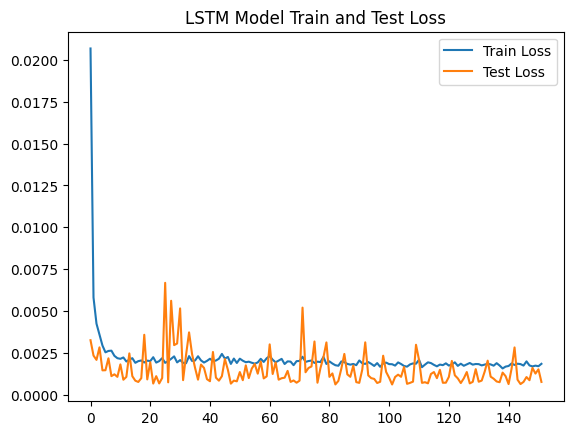

In [ ]:
plt.plot(lstm_history.history['loss'],label="Train Loss")
plt.plot(lstm_history.history['val_loss'],label="Test Loss")
plt.title("LSTM Model Train and Test Loss")
plt.legend()
plt.show()

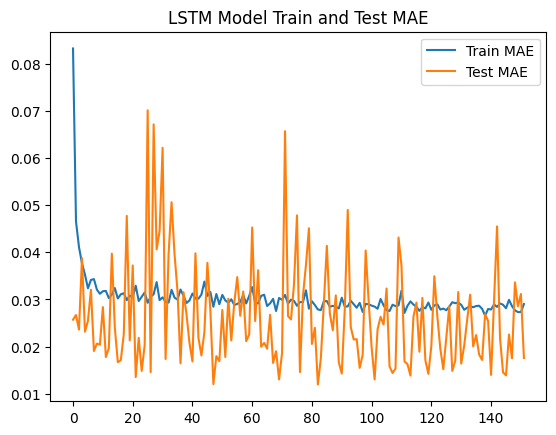

In [ ]:
plt.plot(lstm_history.history['mae'],label="Train MAE")
plt.plot(lstm_history.history['val_mae'],label="Test MAE")
plt.title("LSTM Model Train and Test MAE")
plt.legend()
plt.show()

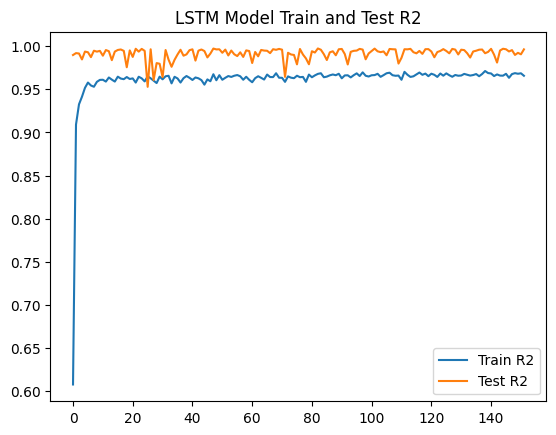

In [ ]:
plt.plot(lstm_history.history['r2_score'],label="Train R2")
plt.plot(lstm_history.history['val_r2_score'],label="Test R2")
plt.title("LSTM Model Train and Test R2")
plt.legend()
plt.show()

### Plot Model Predictions on Train and Test Data

31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


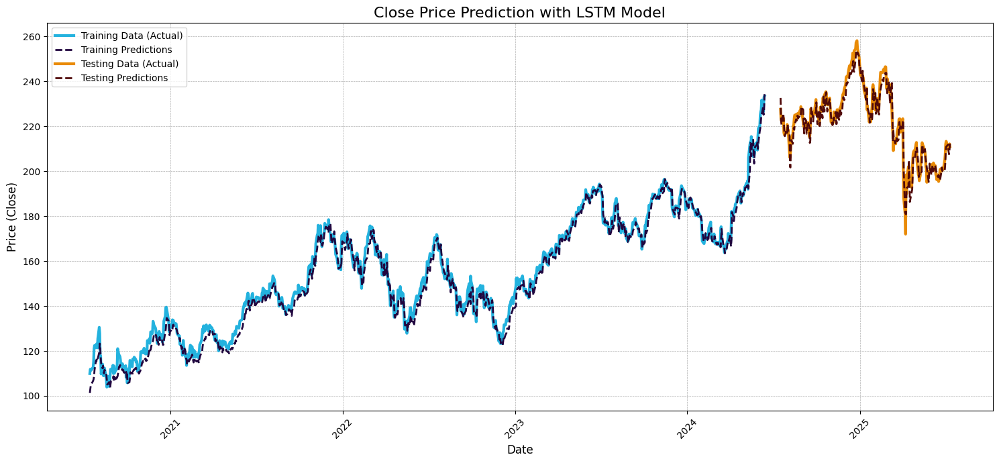

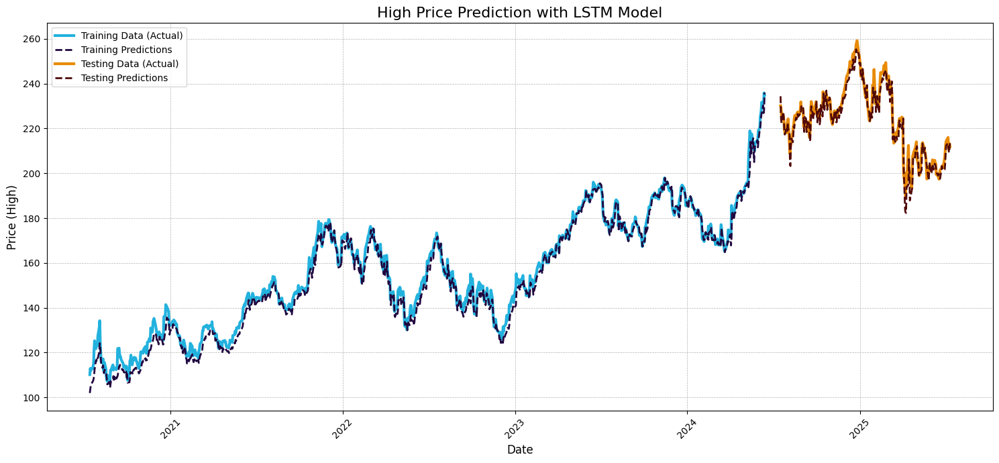

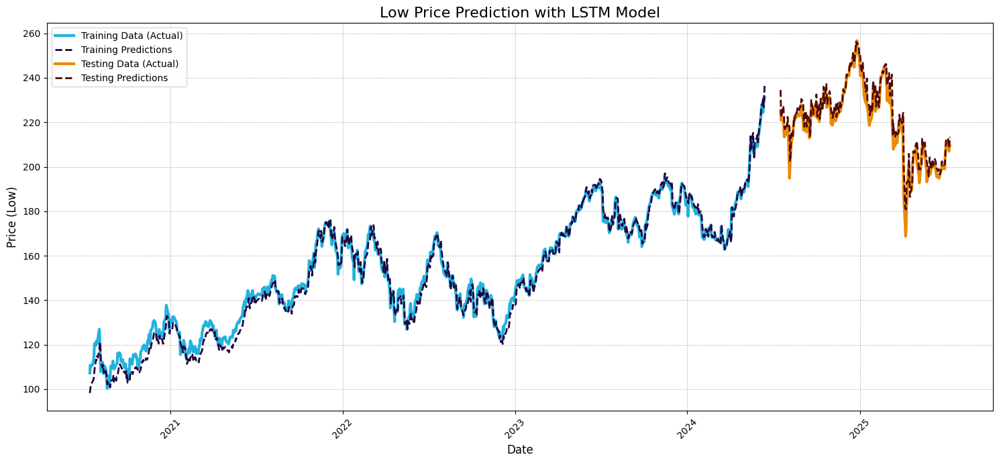

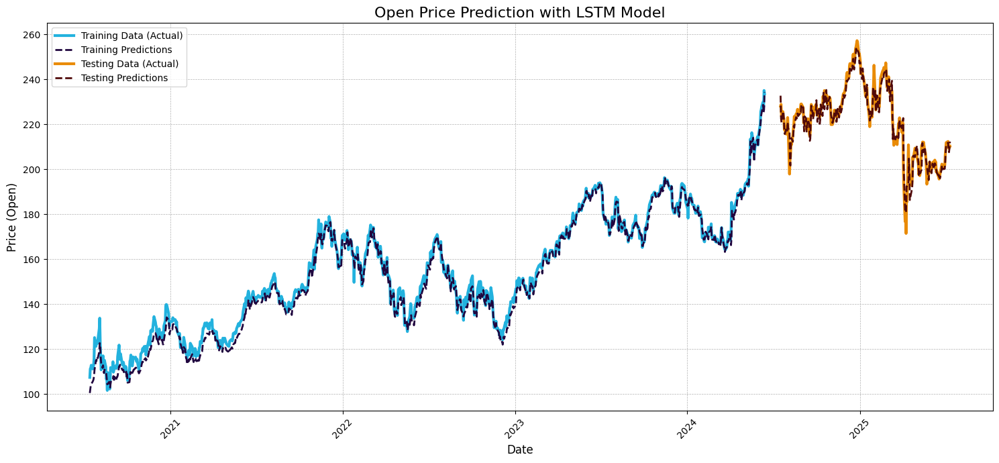

In [ ]:
original_df_for_plotting = AAPL[:]
d.plot(df=original_df_for_plotting,X_train = AAPL_X_train, y_train = AAPL_y_train, X_test = AAPL_X_test, y_test = AAPL_y_test,split_index=AAPL_index, scaler = AAPL_scaler, model = best_lstm_model, model_name='LSTM') # The name of the model you trained

31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


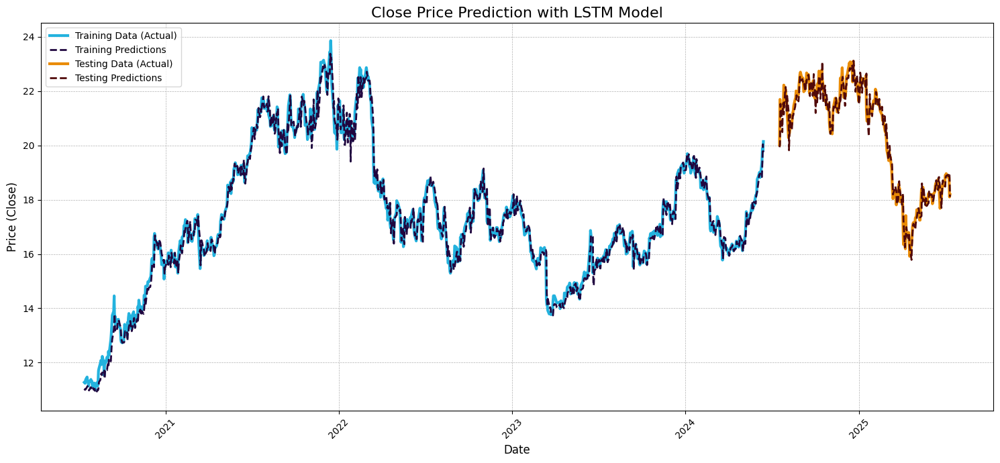

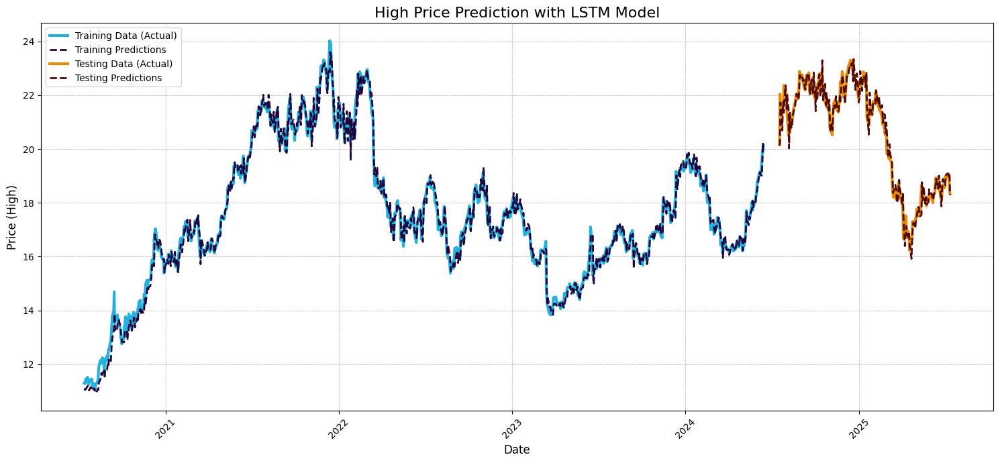

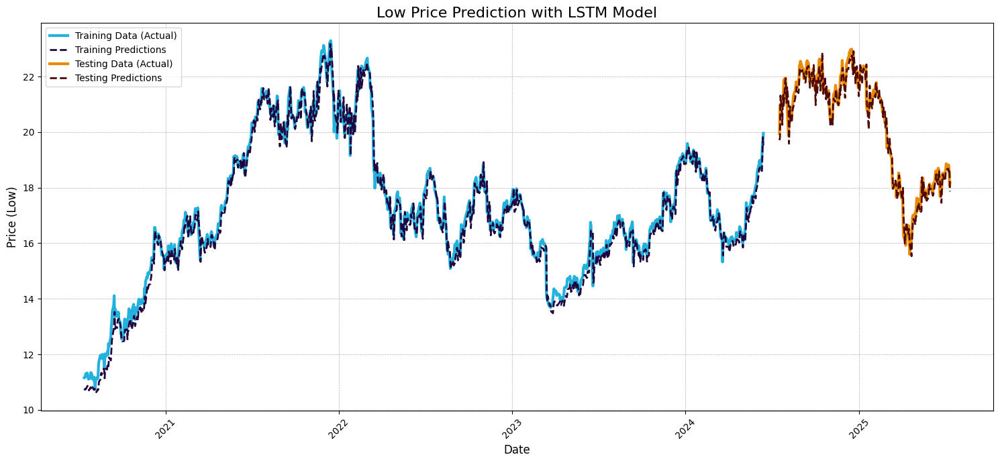

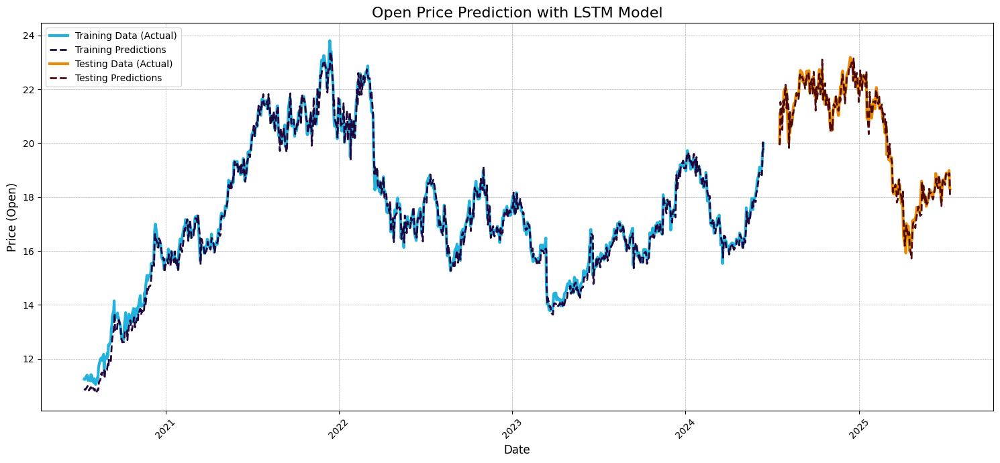

In [ ]:
original_df_for_plotting = INFY[:]
d.plot(df=original_df_for_plotting,X_train = INFY_X_train, y_train = INFY_y_train, X_test = INFY_X_test, y_test = INFY_y_test, scaler = INFY_scaler, split_index=INFY_index ,model = best_lstm_model, model_name='LSTM') # The name of the model you trained

31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


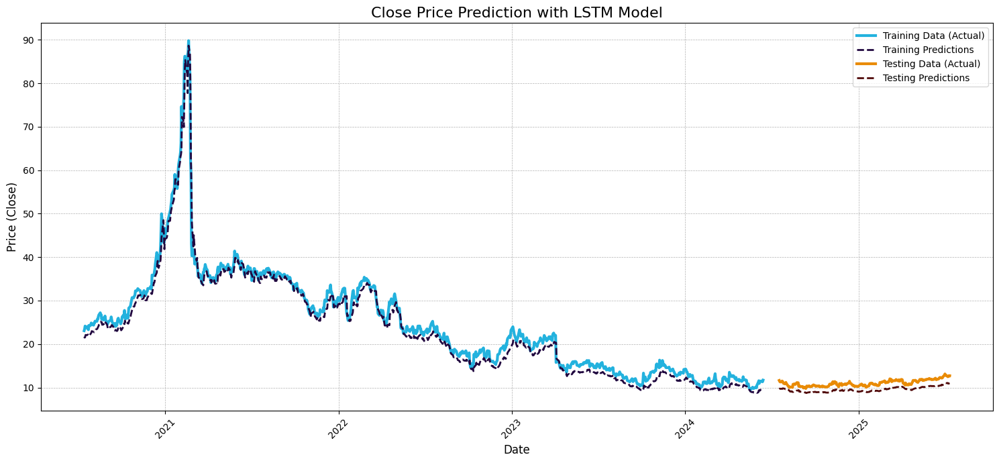

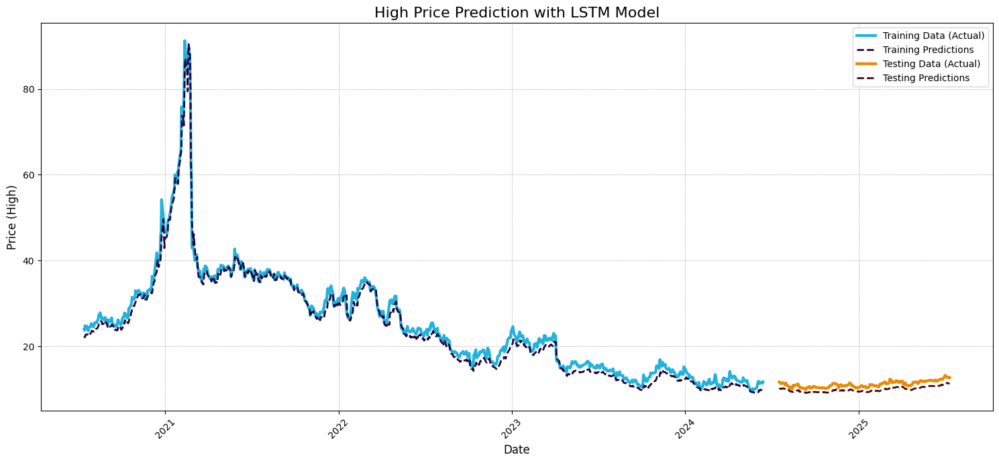

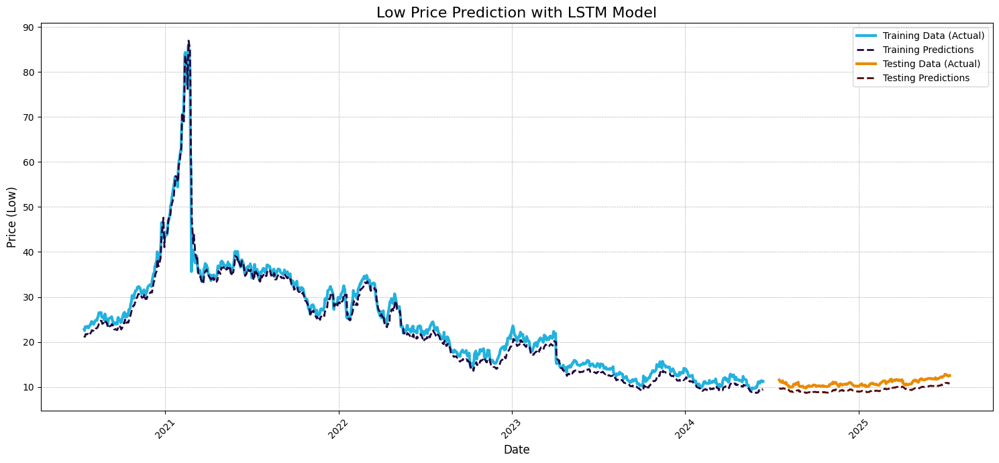

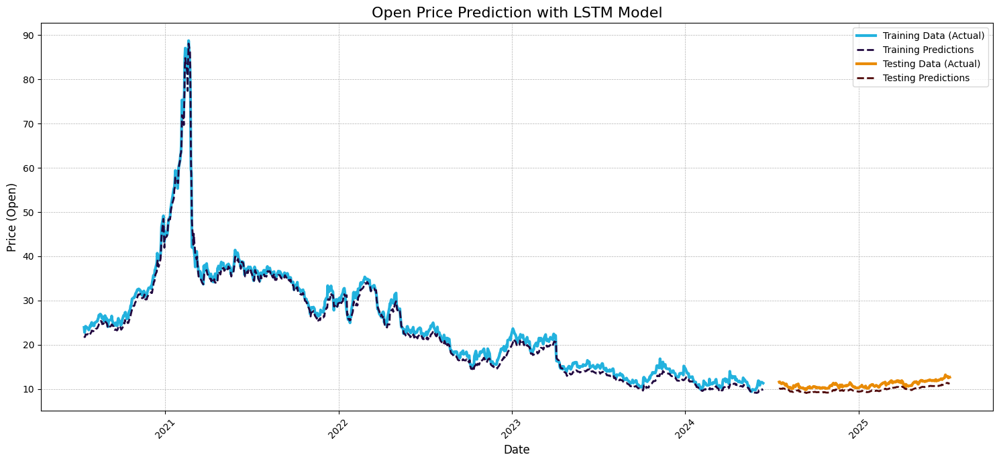

In [ ]:
original_df_for_plotting = PSKY[:]
d.plot(df=original_df_for_plotting,X_train = PSKY_X_train, y_train = PSKY_y_train, X_test = PSKY_X_test, y_test = PSKY_y_test, scaler = PSKY_scaler, model = best_lstm_model,split_index=PSKY_index, model_name='LSTM') # The name of the model you trained

### Save the best model

In [ ]:
best_lstm_model.save("best_lstm_model.keras")

In [23]:
from keras.models import load_model
lstm = load_model("best_lstm_model.keras")

### Plot Validation Sets

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


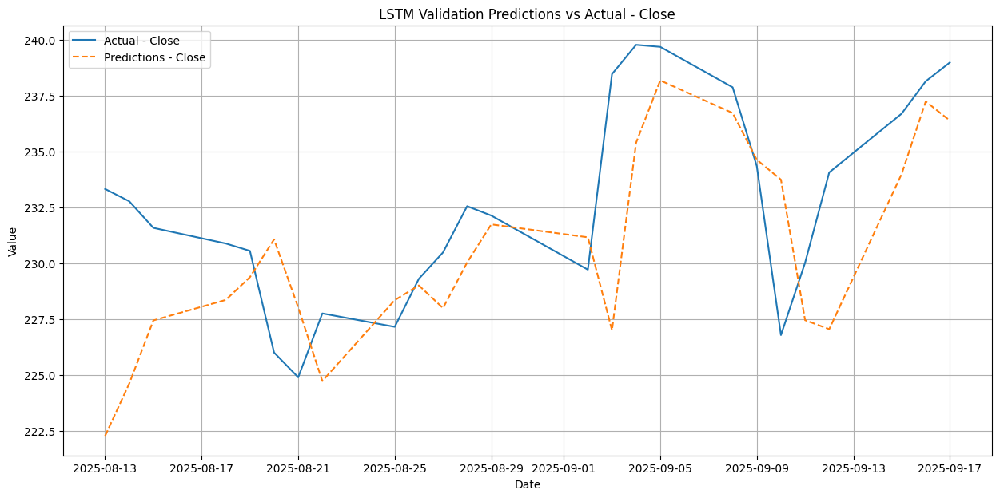

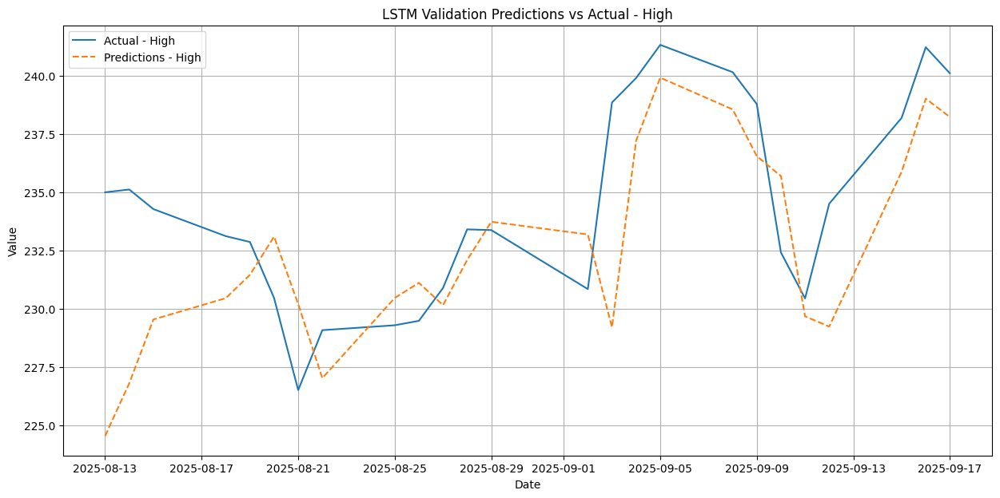

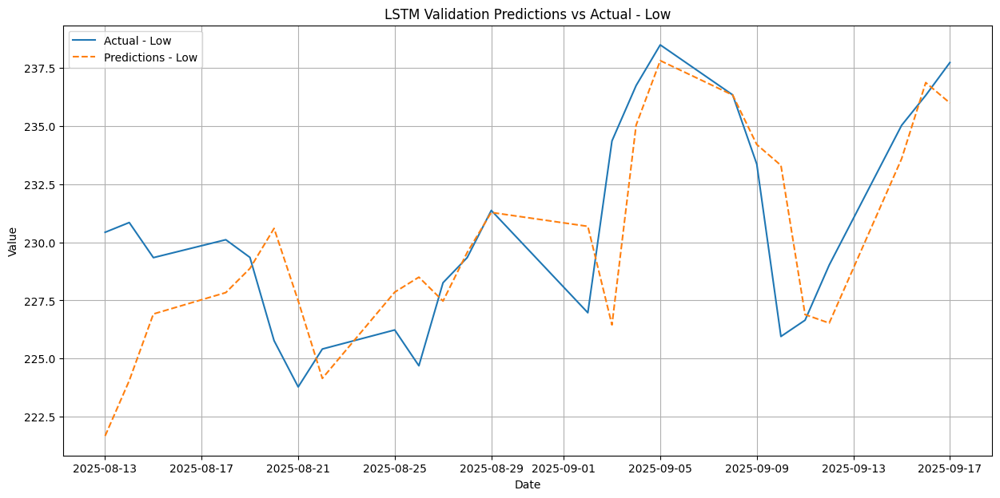

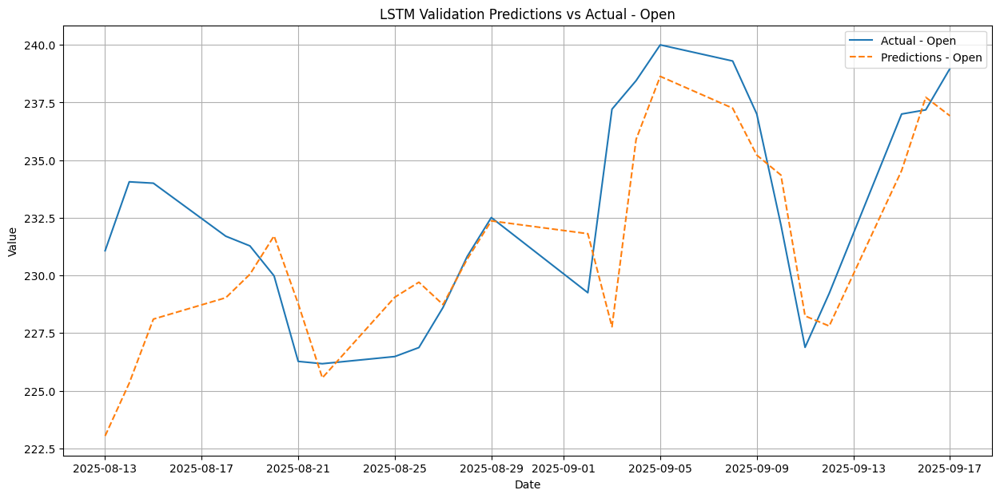

In [ ]:
d.plot_validation(df=AAPL_val,model=best_lstm_model,X=AAPL_X_val,y=AAPL_y_val,scaler=AAPL_val_scaler,model_name="LSTM")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


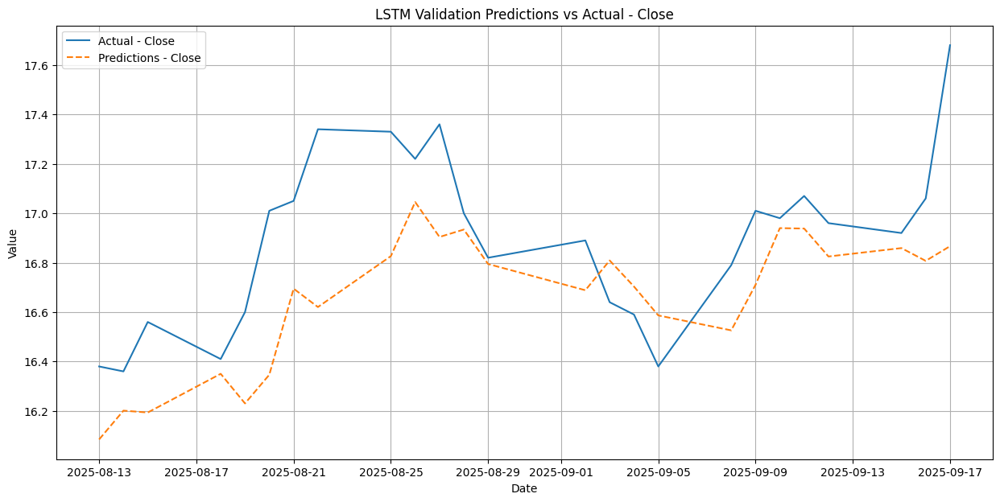

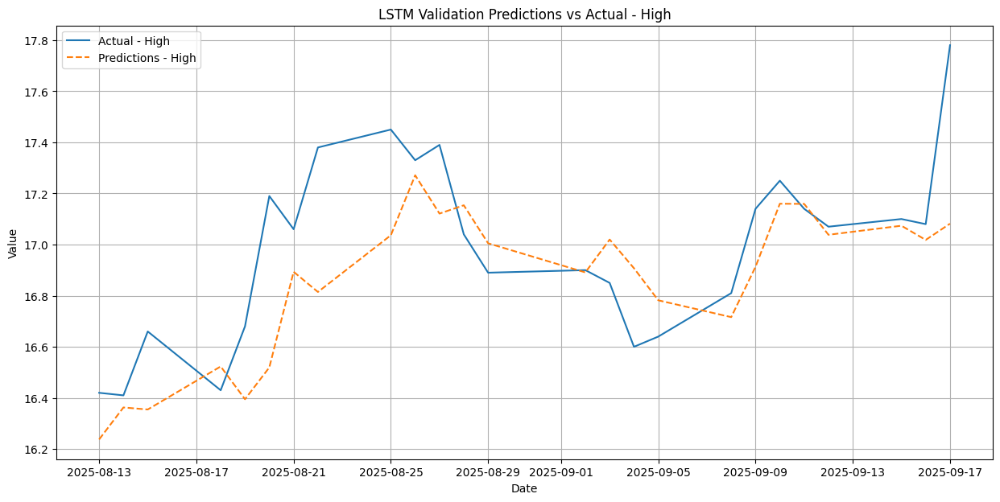

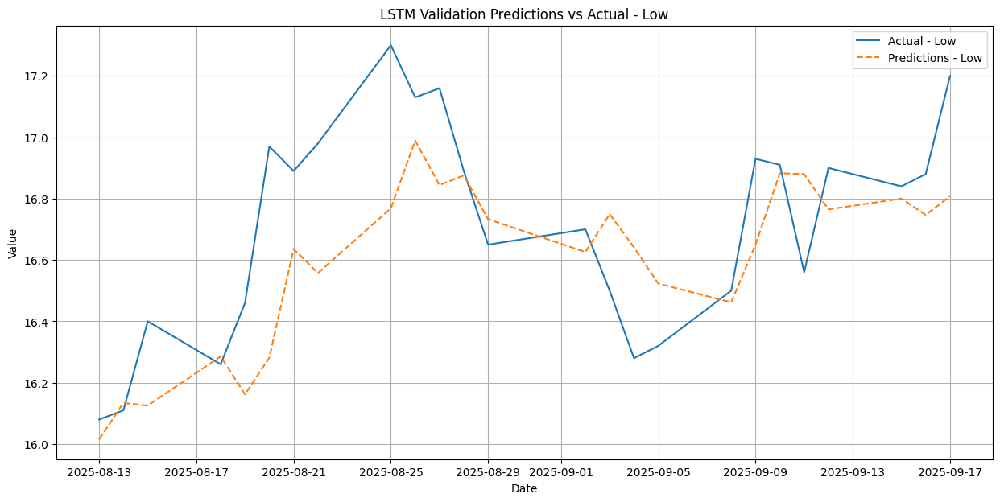

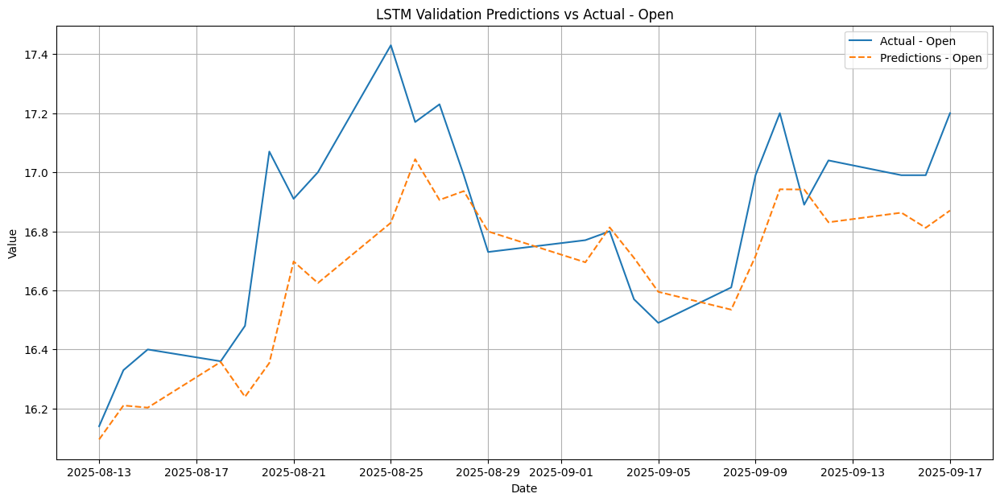

In [ ]:
d.plot_validation(INFY_val,lstm,INFY_X_val,INFY_y_val,INFY_val_scaler,model_name="LSTM")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


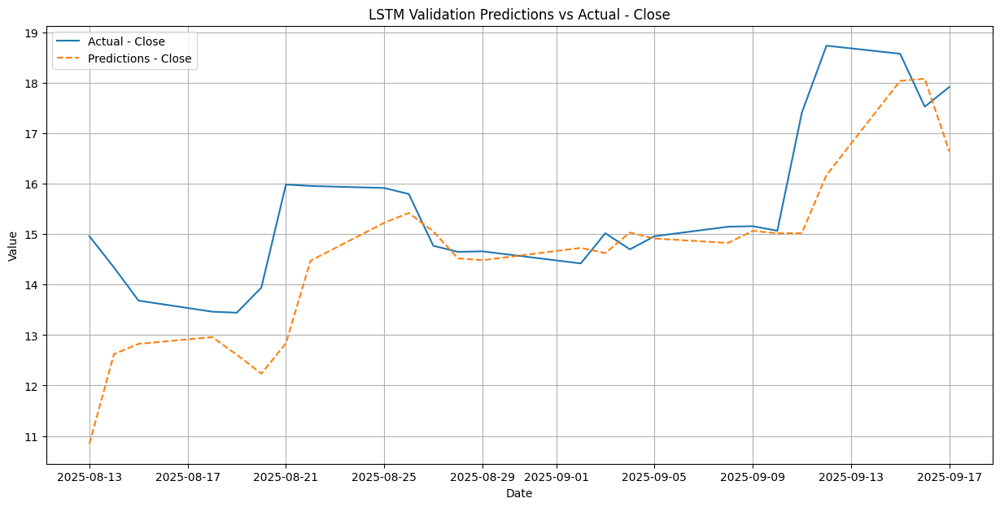

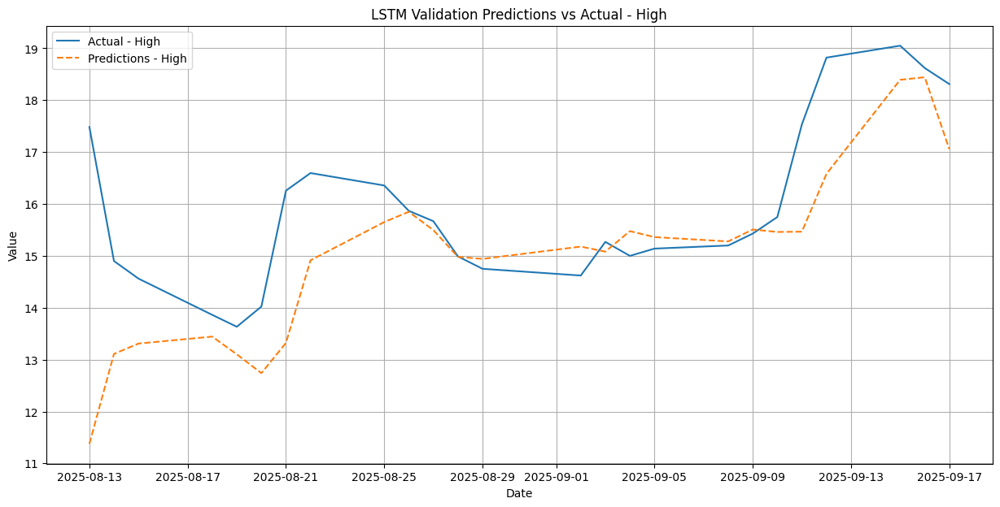

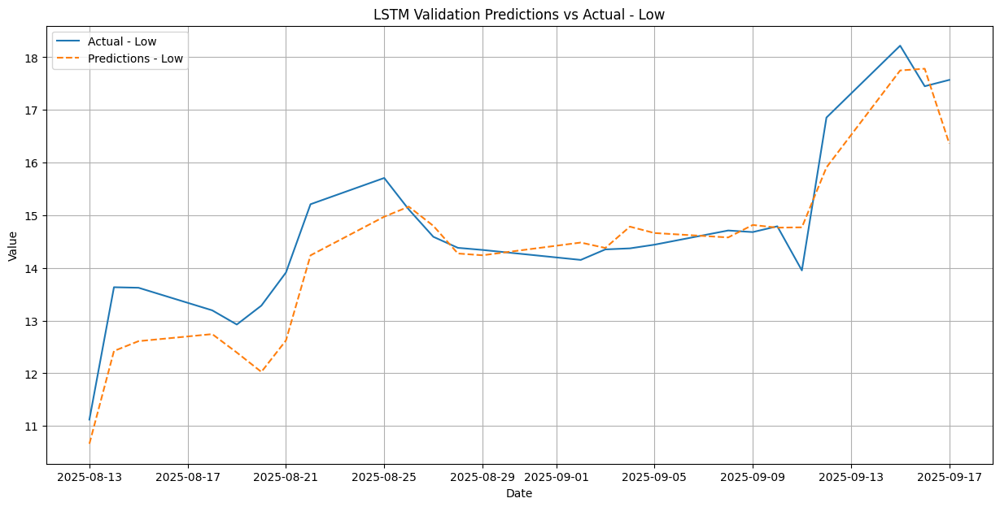

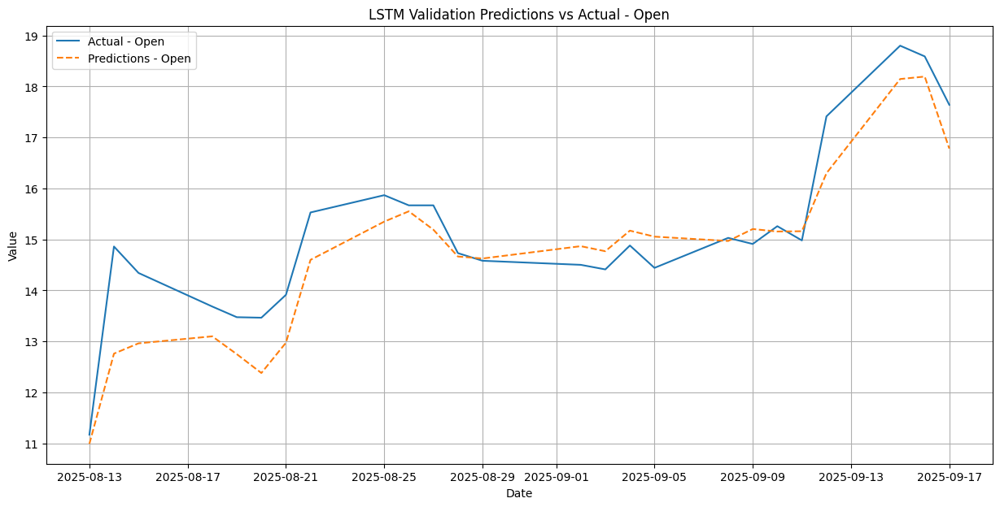

In [ ]:
d.plot_validation(PSKY_val,lstm,PSKY_X_val,PSKY_y_val,PSKY_val_scaler,model_name="LSTM")

## **CNNLSTM**

### Best CNNLSTM Model Check

In [61]:
cnnlstm_tuner = HyperparameterTuner(
        model_builder=build_cnnlstm_tuner,
        input_shape=input_shape,
        project_name='CNNLSTM_Tuning'
    )

In [62]:
best_cnnlstm_model, cnnlstm_history = cnnlstm_tuner.tune(X_train, y_train, X_test, y_test, max_epochs=20)

Reloading Tuner from keras_tuner_dir/keras_tuner_dir/CNNLSTM_Tuning/tuner0.json

--- Starting Hyperparameter Search for 'CNNLSTM_Tuning' ---

--- Search Complete. Best Hyperparameters for 'CNNLSTM_Tuning': ---
- num_conv_layers: 2
- conv_0_filters: 32
- conv_0_kernel: 5
- conv_0_padding: same
- num_lstm_layers: 1
- lstm_0_units: 200
- dropout_0: 0.4
- num_dense_layers: 2
- dense_0_units: 64
- learning_rate: 0.01
- lstm_1_units: 100
- dropout_1: 0.2
- lstm_2_units: 50
- dropout_2: 0.30000000000000004
- lstm_3_units: 200
- dropout_3: 0.2
- dense_1_units: 192
- conv_1_filters: 64
- conv_1_kernel: 5
- conv_1_padding: same
- conv_2_filters: 32
- conv_2_kernel: 3
- conv_2_padding: same
- conv_3_filters: 32
- conv_3_kernel: 5
- conv_3_padding: valid
- conv_4_filters: 64
- conv_4_kernel: 5
- conv_4_padding: same
- tuner/epochs: 20
- tuner/initial_epoch: 0
- tuner/bracket: 0
- tuner/round: 0

--- Retraining the best model on the data... ---
Epoch 1/500
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - 

### Model Summary

In [ ]:
best_cnnlstm_model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 21, 32)         │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_1 (Conv1D)               │ (None, 21, 64)         │        10,304 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d (MaxPooling1D)    │ (None, 10, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 10, 64)         │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_5 (LSTM)                   │ (None, 10, 200)        │       212,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 10, 200)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 2000)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │       128,064 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 192)            │        12,480 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 4)              │           772 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,093,870 (4.17 MB)

 Trainable params: 364,580 (1.39 MB)

 Non-trainable params: 128 (512.00 B)

 Optimizer params: 729,162 (2.78 MB)

### Plot Metrics

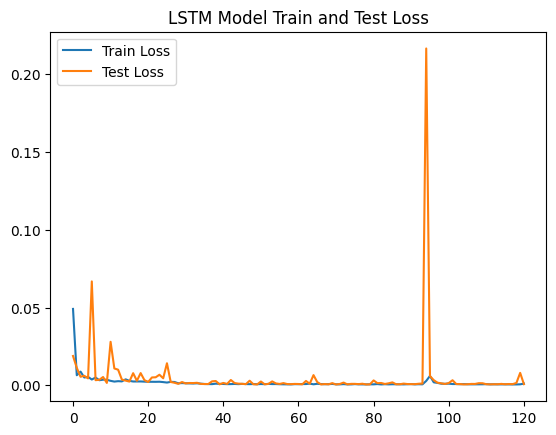

In [ ]:
plt.plot(cnnlstm_history.history['loss'],label="Train Loss")
plt.plot(cnnlstm_history.history['val_loss'],label="Test Loss")
plt.title("LSTM Model Train and Test Loss")
plt.legend()
plt.show()

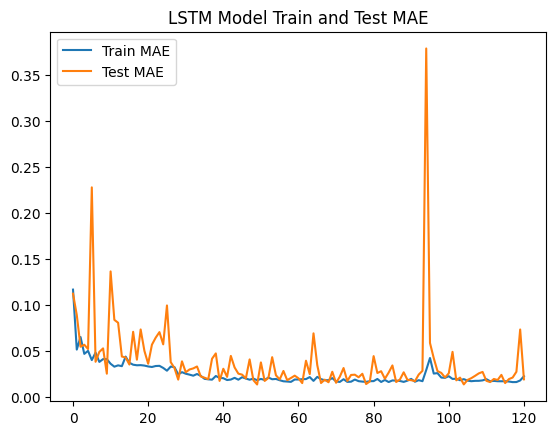

In [ ]:
plt.plot(cnnlstm_history.history['mae'],label="Train MAE")
plt.plot(cnnlstm_history.history['val_mae'],label="Test MAE")
plt.title("LSTM Model Train and Test MAE")
plt.legend()
plt.show()

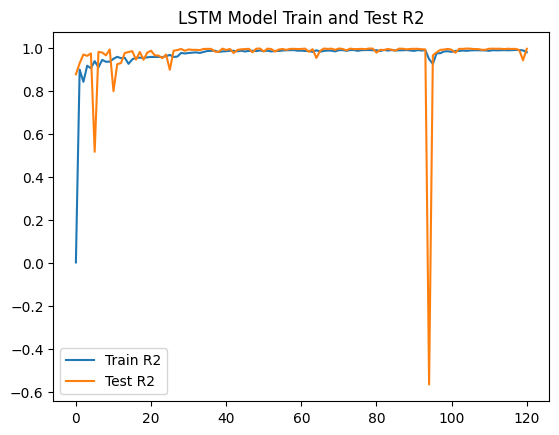

In [ ]:
plt.plot(cnnlstm_history.history['r2_score'],label="Train R2")
plt.plot(cnnlstm_history.history['val_r2_score'],label="Test R2")
plt.title("LSTM Model Train and Test R2")
plt.legend()
plt.show()

### Plot Model Predictions on Train and Test Data

31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


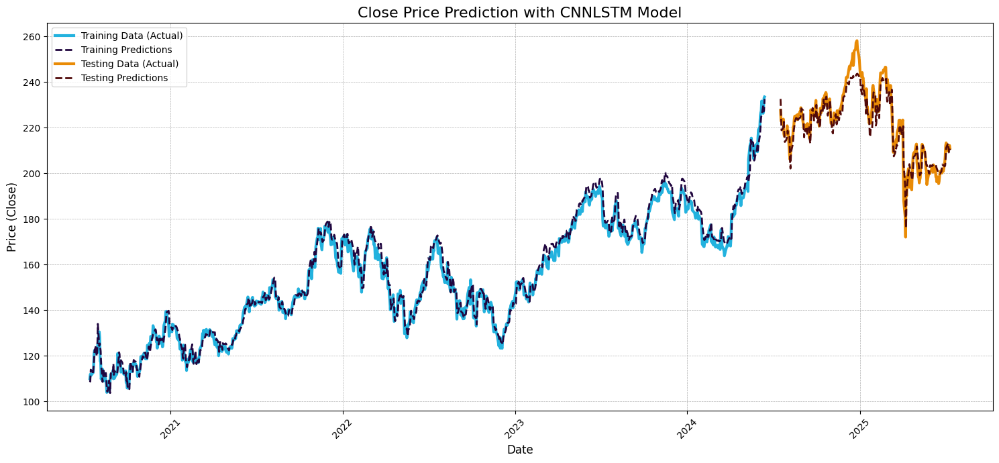

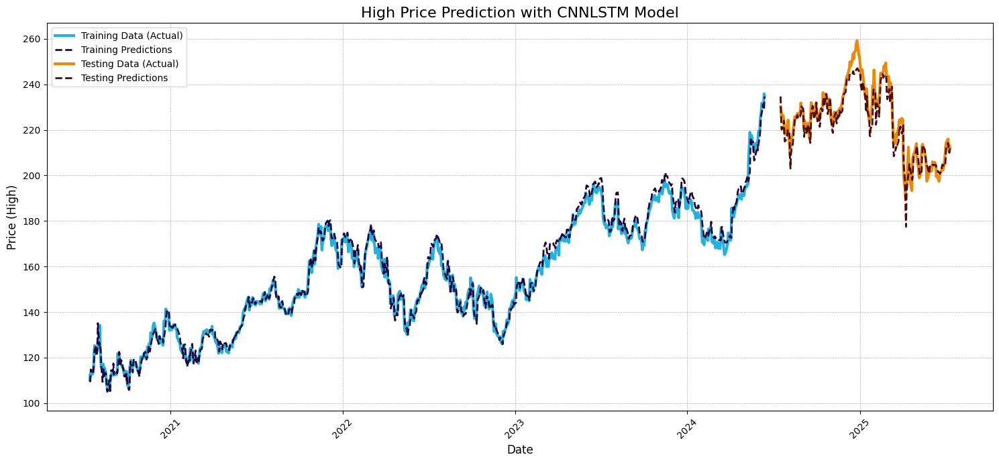

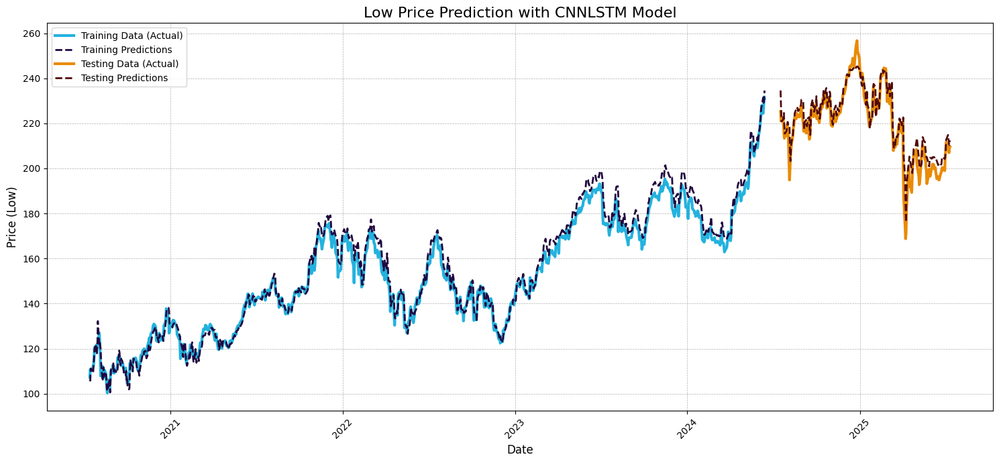

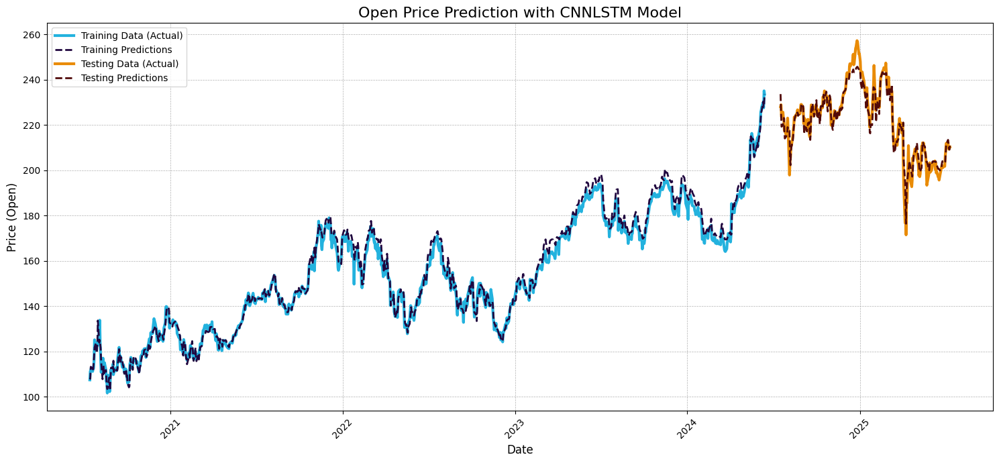

In [ ]:
original_df_for_plotting = AAPL[:]
d.plot(df=original_df_for_plotting,X_train = AAPL_X_train, y_train = AAPL_y_train, X_test = AAPL_X_test, y_test = AAPL_y_test,split_index=AAPL_index, scaler = AAPL_scaler, model = best_cnnlstm_model, model_name='CNNLSTM') # The name of the model you trained

31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


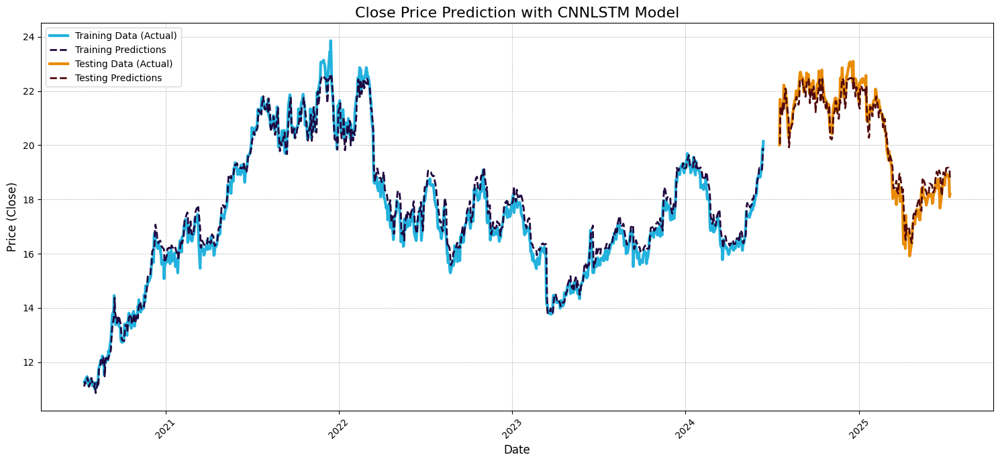

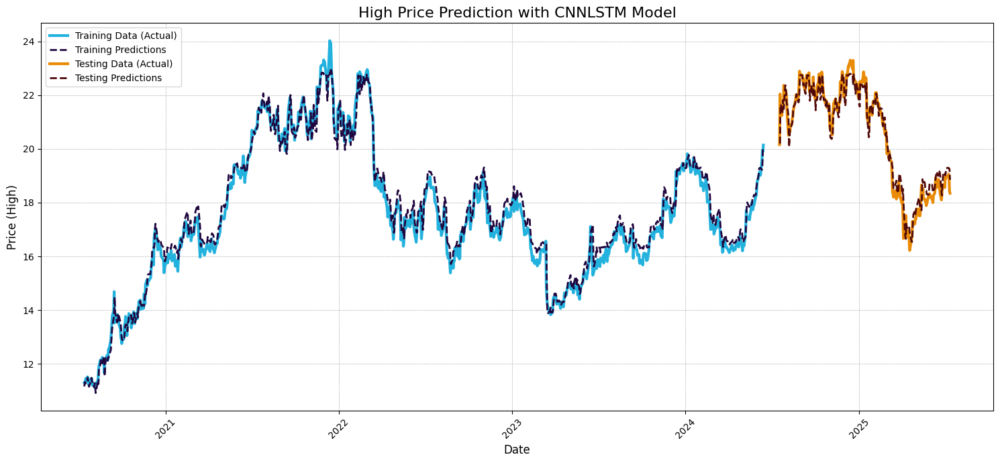

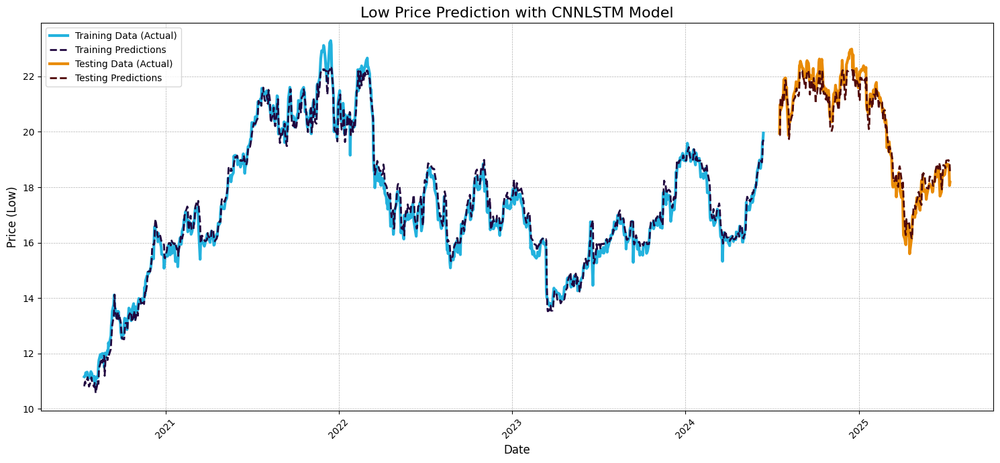

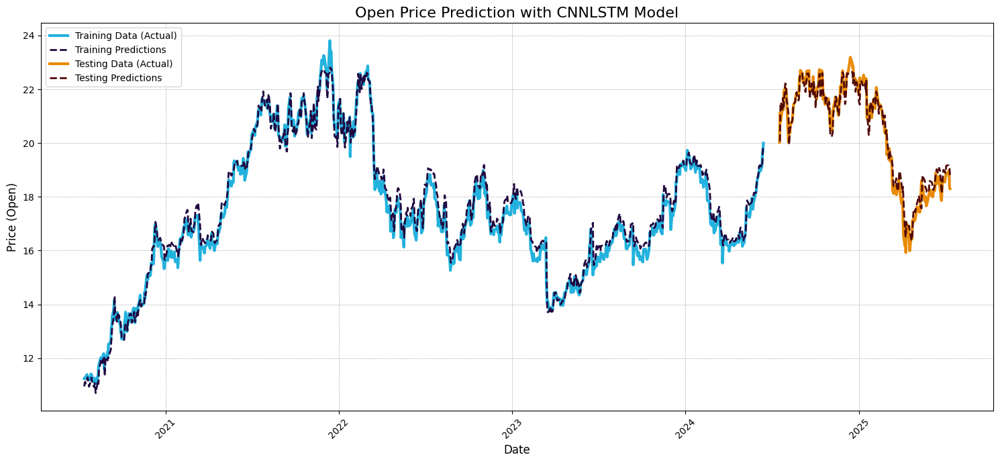

In [ ]:
original_df_for_plotting = INFY[:]
d.plot(df=original_df_for_plotting,X_train = INFY_X_train, y_train = INFY_y_train, X_test = INFY_X_test, y_test = INFY_y_test, scaler = INFY_scaler, split_index=INFY_index ,model = best_cnnlstm_model, model_name='CNNLSTM') # The name of the model you trained

31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


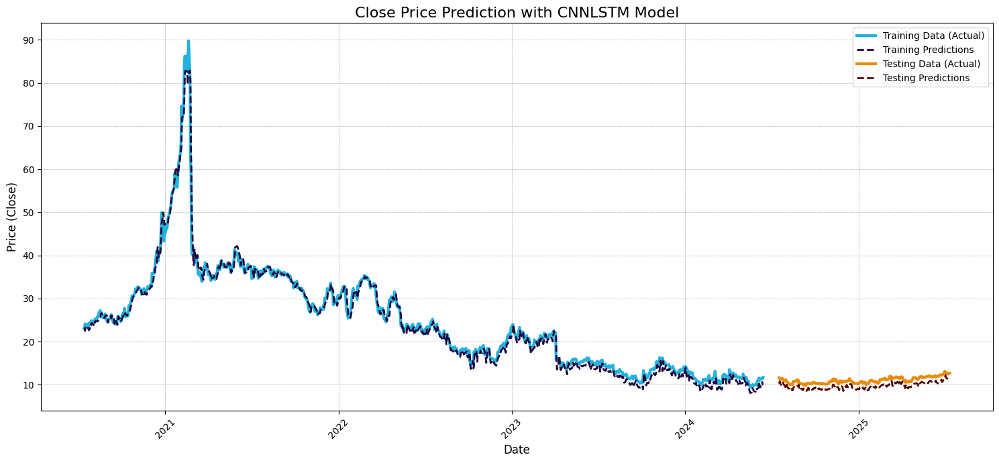

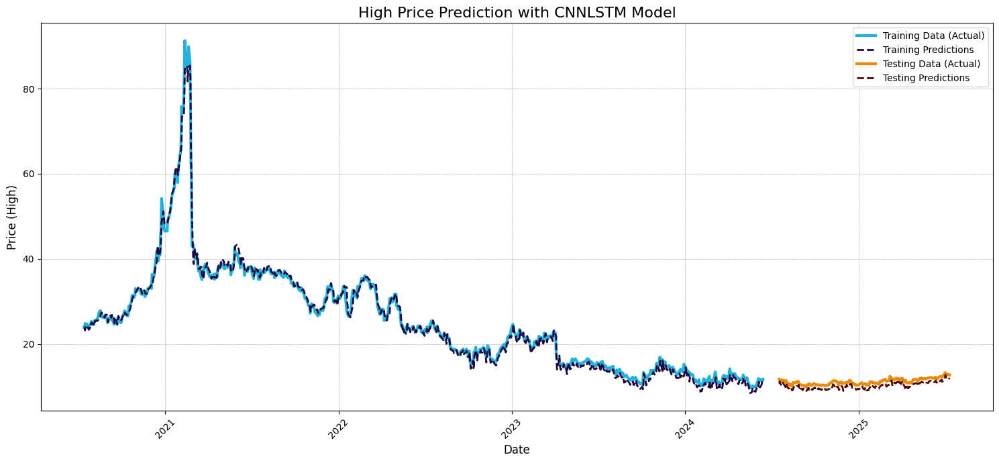

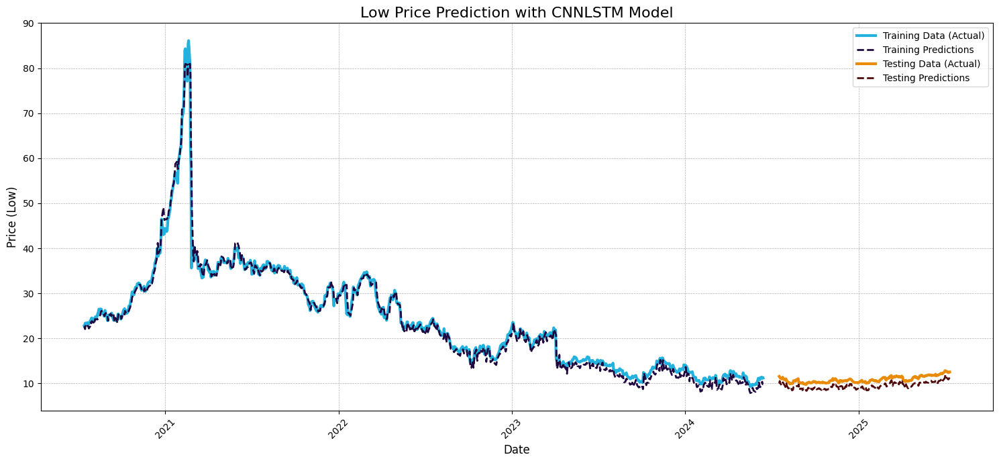

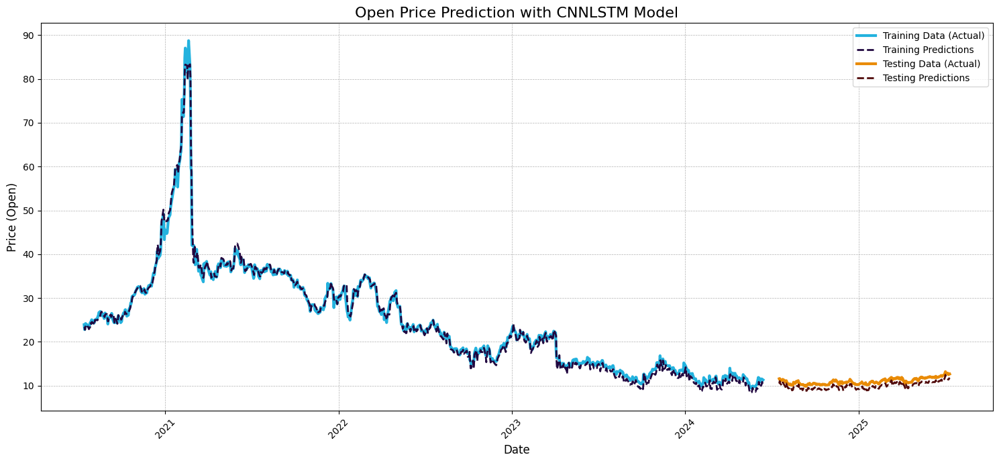

In [ ]:
original_df_for_plotting = PSKY[:]
d.plot(df=original_df_for_plotting,X_train = PSKY_X_train, y_train = PSKY_y_train, X_test = PSKY_X_test, y_test = PSKY_y_test, scaler = PSKY_scaler, model = best_cnnlstm_model,split_index=PSKY_index, model_name='CNNLSTM') # The name of the model you trained

### Save the best model

In [ ]:
best_cnnlstm_model.save("best_cnnlstm_model.keras")

In [2]:
from keras.models import load_model
cnnlstm = load_model("best_cnnlstm_model.keras")

### Plot Validation Sets

Apple Stocks Validation Prediction
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


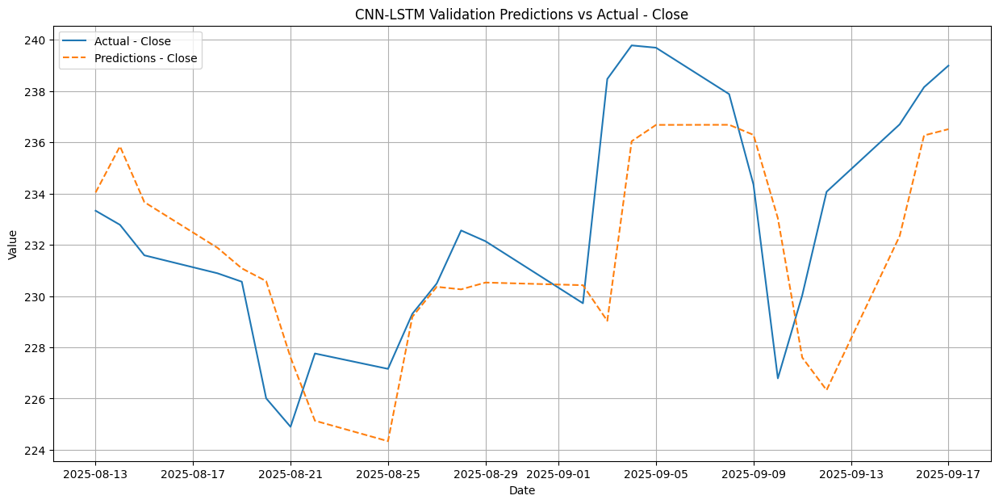

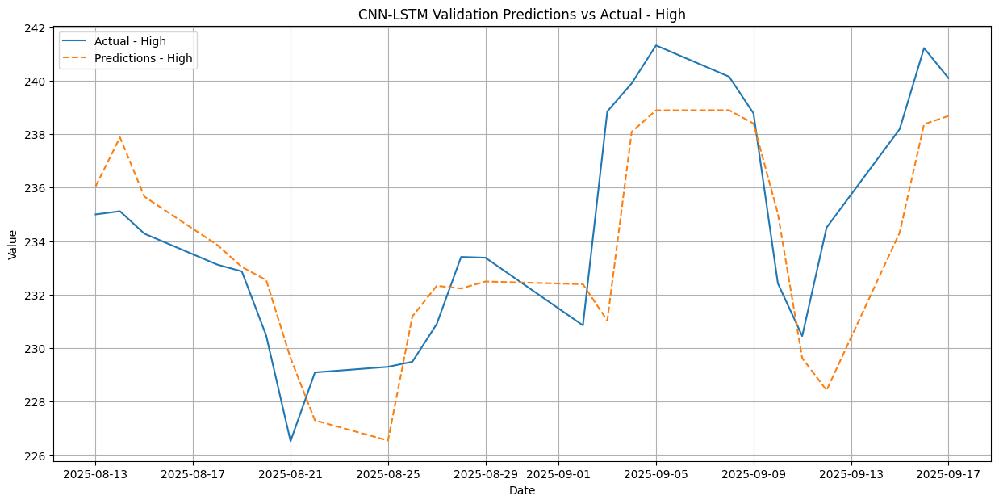

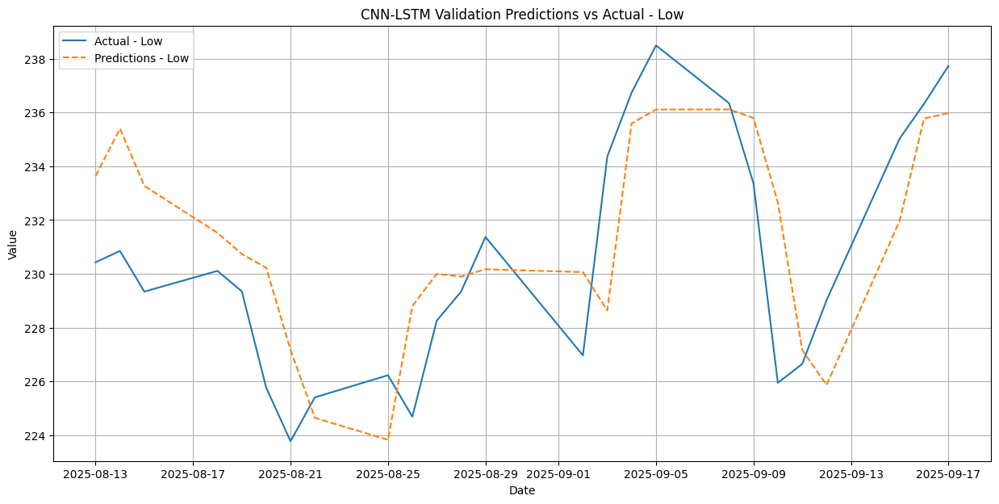

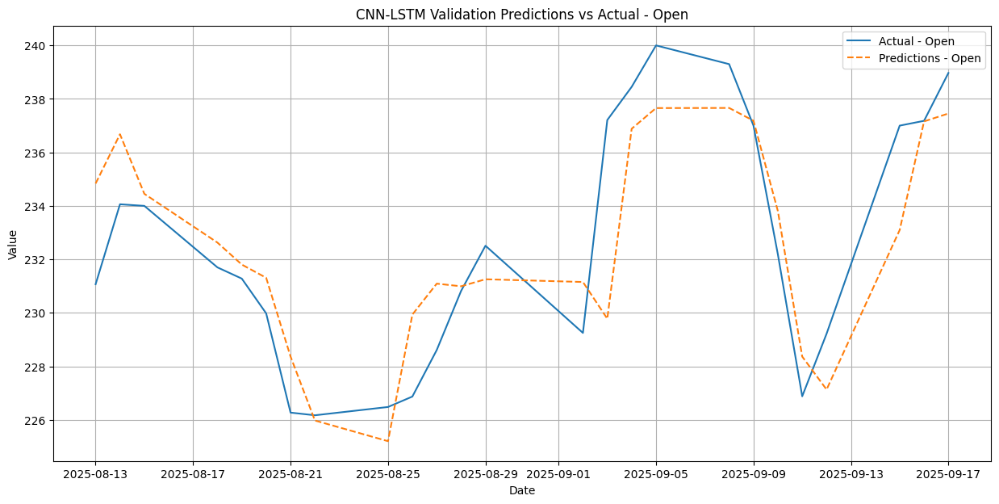

In [ ]:
print("Apple Stocks Validation Prediction")
d.plot_validation(AAPL_val,cnnlstm,AAPL_X_val,AAPL_y_val,AAPL_val_scaler,model_name="CNN-LSTM")

Infosys Stocks Validation Prediction
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


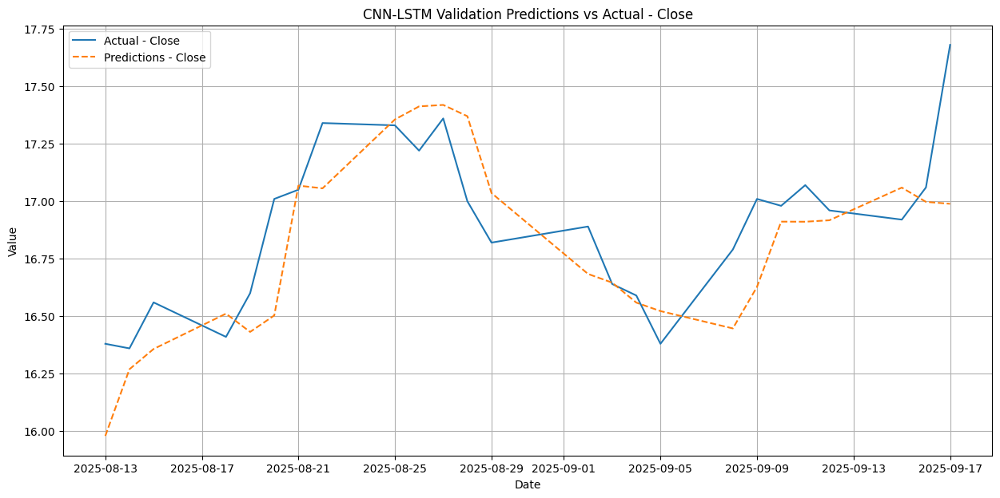

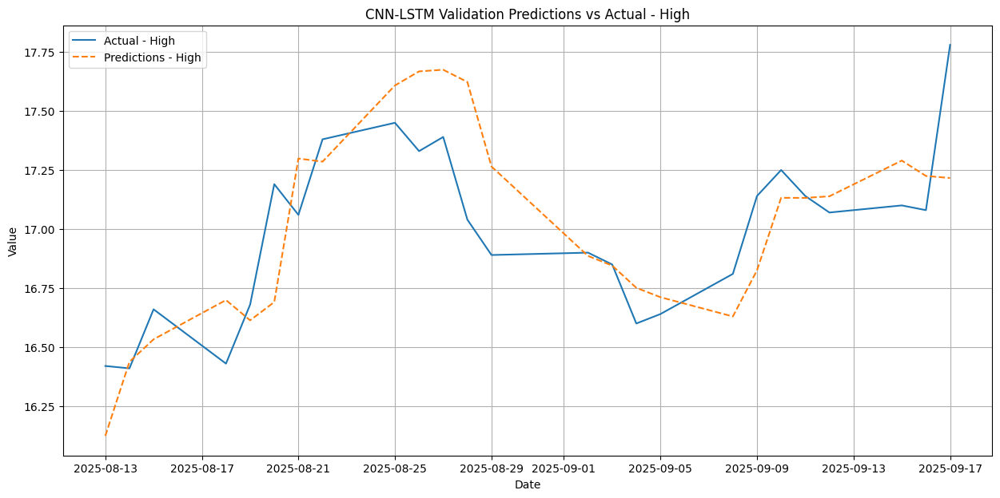

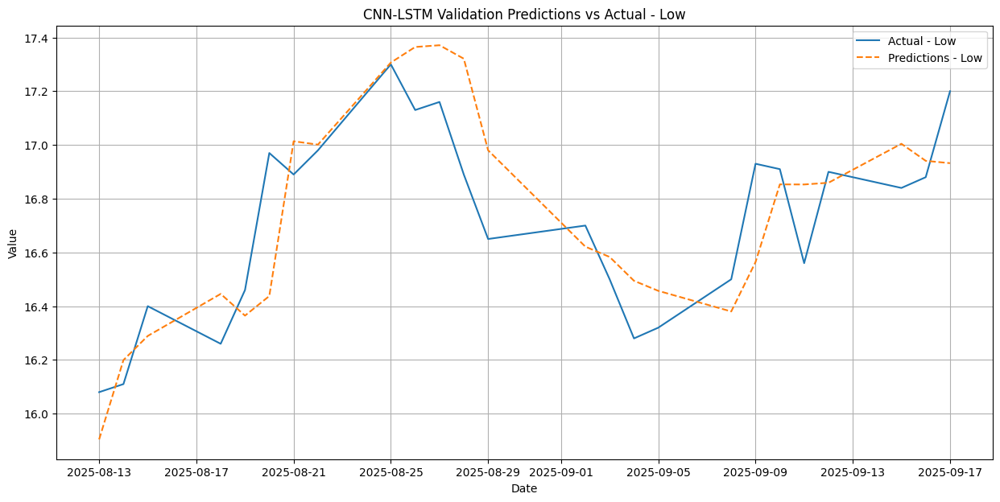

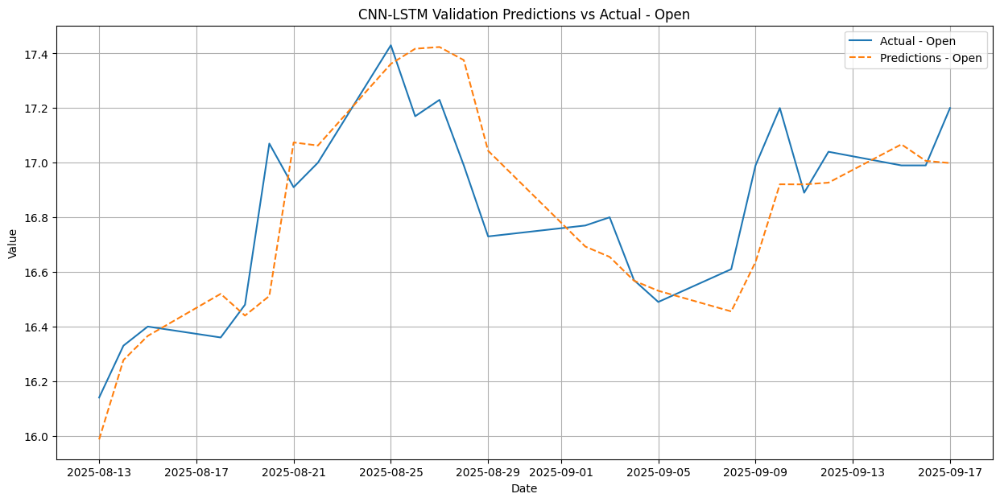

In [ ]:
print("Infosys Stocks Validation Prediction")
d.plot_validation(INFY_val,cnnlstm,INFY_X_val,INFY_y_val,INFY_val_scaler,model_name="CNN-LSTM")

Paramount Skydance Validation Prediction
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


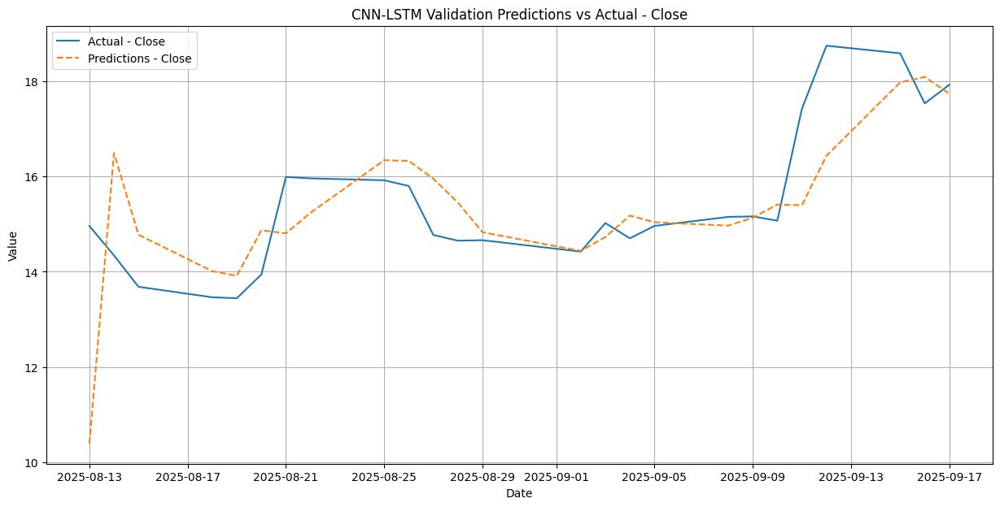

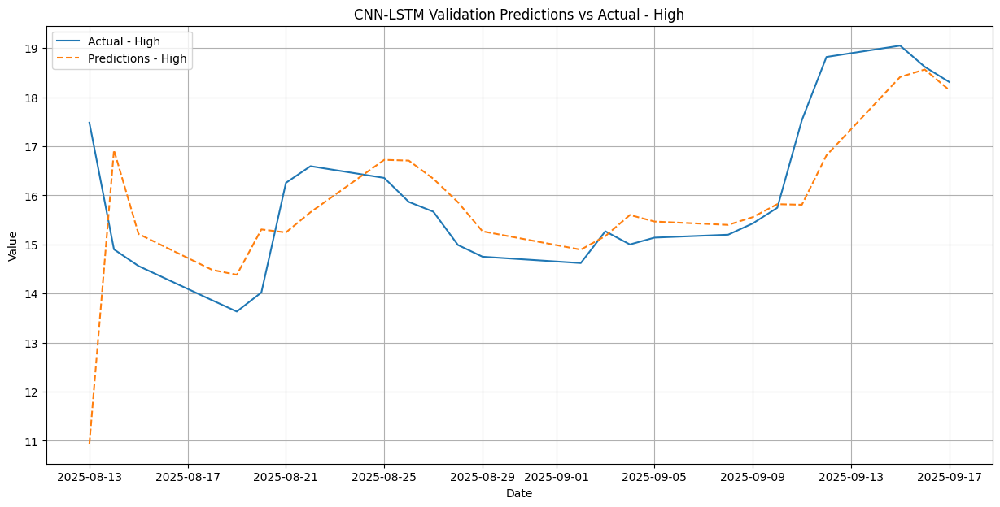

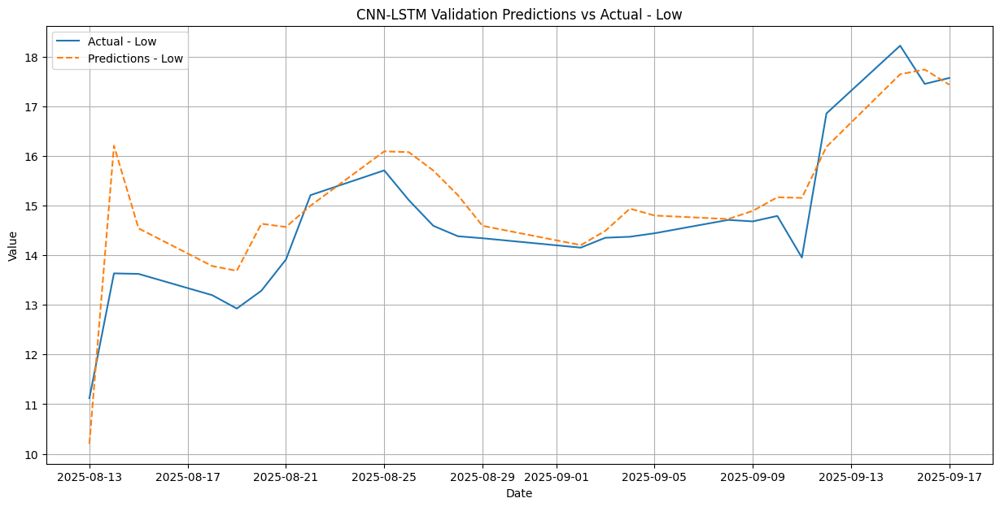

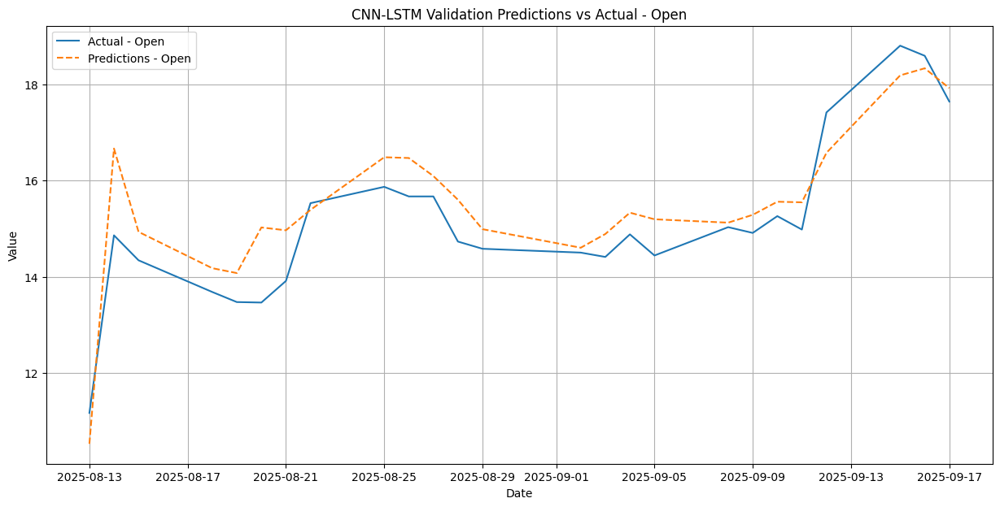

In [ ]:
print("Paramount Skydance Validation Prediction")
d.plot_validation(PSKY_val,cnnlstm,PSKY_X_val,PSKY_y_val,PSKY_val_scaler,model_name="CNN-LSTM")

## **Attention Based LSTM**

In [63]:
alstm_tuner = HyperparameterTuner(
        model_builder=build_attention_lstm_tuner,
        input_shape=input_shape,
        project_name='Attention Based LSTM_Tuning'
    )

### Best Model Selection

In [64]:
best_alstm_model, alstm_history = alstm_tuner.tune(X_train, y_train, X_test, y_test, max_epochs=20)

Reloading Tuner from keras_tuner_dir/keras_tuner_dir/Attention Based LSTM_Tuning/tuner0.json

--- Starting Hyperparameter Search for 'Attention Based LSTM_Tuning' ---

--- Search Complete. Best Hyperparameters for 'Attention Based LSTM_Tuning': ---
- num_lstm_layers: 1
- lstm_0_units: 50
- dropout_0: 0.30000000000000004
- attention_dim: 64
- dense_units: 96
- lr: 0.001
- lstm_1_units: 200
- dropout_1: 0.5
- lstm_2_units: 50
- dropout_2: 0.4
- lstm_3_units: 50
- dropout_3: 0.5
- lstm_4_units: 100
- dropout_4: 0.5
- tuner/epochs: 20
- tuner/initial_epoch: 7
- tuner/bracket: 2
- tuner/round: 2
- tuner/trial_id: 0013

--- Retraining the best model on the data... ---
Epoch 1/500
93/93 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 0.1075 - mae: 0.2199 - r2_score: -1.4980 - val_loss: 0.0066 - val_mae: 0.0624 - val_r2_score: 0.9521
Epoch 2/500
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0151 - mae: 0.0907 - r2_score: 0.6859 - val_loss: 0.0050 - val_mae: 0.0527 - val_r2_score: 0.9641
Epoch 3/5

### Model Summary

In [ ]:
best_alstm_model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 21, 5)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_5 (LSTM)       │ (None, 21, 50)    │     11,200 │ input_layer_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_6 (Dropout) │ (None, 21, 50)    │          0 │ lstm_5[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 21, 64)    │      3,264 │ dropout_6[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ self_attention_1    │ (None, 21, 64)    │      9,600 │ dropout_6[0][0]   │
│ (SelfAttention)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_1 (Add)         │ (None, 21, 64)    │          0 │ dense_3[0][0],    │
│                     │                   │            │ self_attention_1… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 21, 64)    │        128 │ add_1[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 64)        │          0 │ layer_normalizat… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 96)        │      6,240 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_7 (Dropout) │ (None, 96)        │          0 │ dense_4[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_5 (Dense)     │ (None, 4)         │        388 │ dropout_7[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 92,462 (361.18 KB)

 Trainable params: 30,820 (120.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 61,642 (240.79 KB)

### Plot Metrics

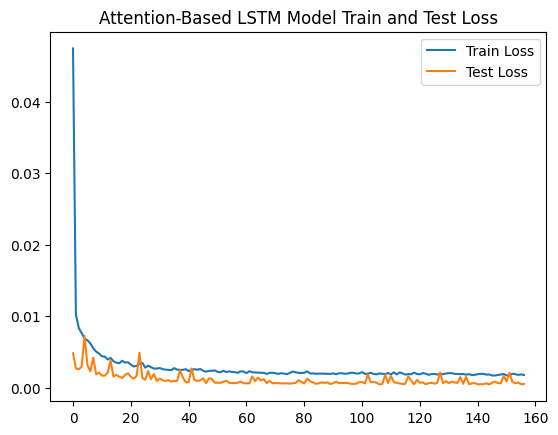

In [ ]:
plt.plot(alstm_history.history['loss'],label="Train Loss")
plt.plot(alstm_history.history['val_loss'],label="Test Loss")
plt.title("Attention-Based LSTM Model Train and Test Loss")
plt.legend()
plt.show()

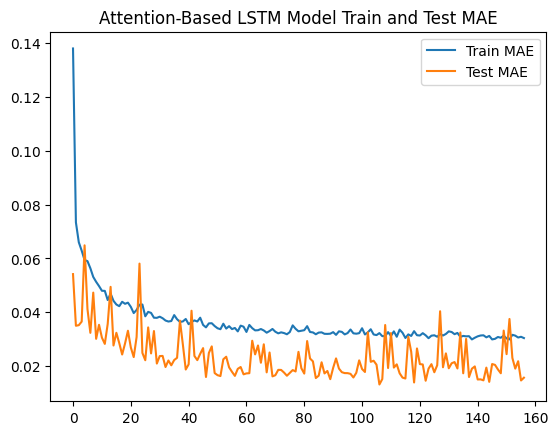

In [ ]:
plt.plot(alstm_history.history['mae'],label="Train MAE")
plt.plot(alstm_history.history['val_mae'],label="Test MAE")
plt.title("Attention-Based LSTM Model Train and Test MAE")
plt.legend()
plt.show()

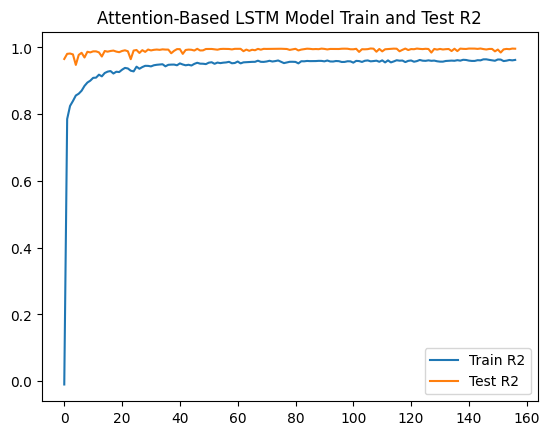

In [ ]:
plt.plot(alstm_history.history['r2_score'],label="Train R2")
plt.plot(alstm_history.history['val_r2_score'],label="Test R2")
plt.title("Attention-Based LSTM Model Train and Test R2")
plt.legend()
plt.show()

### Plot Validation

31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


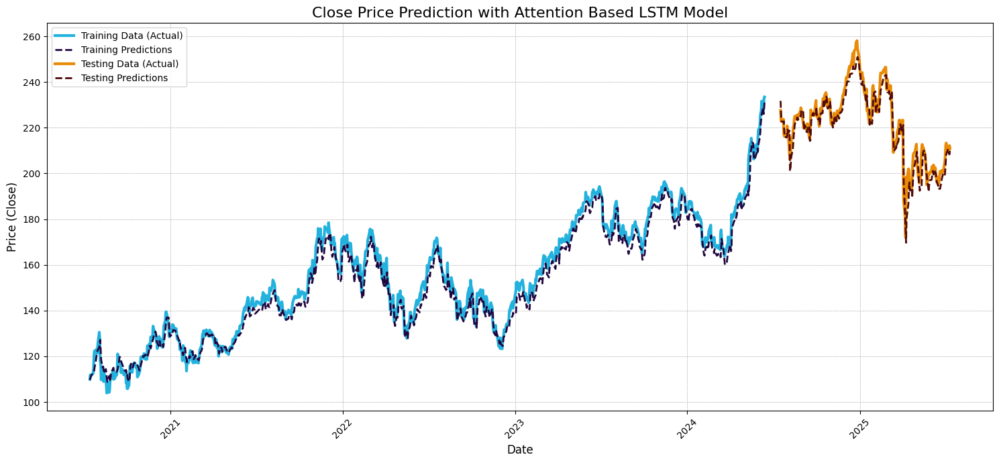

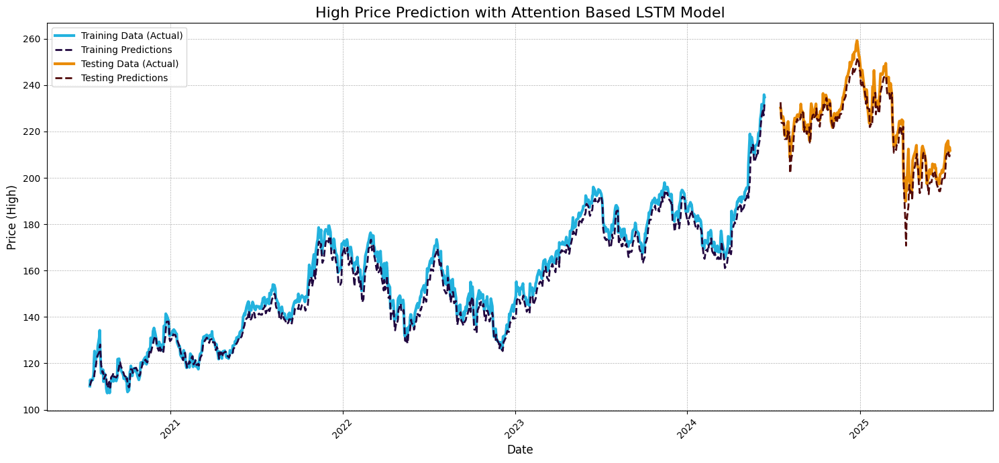

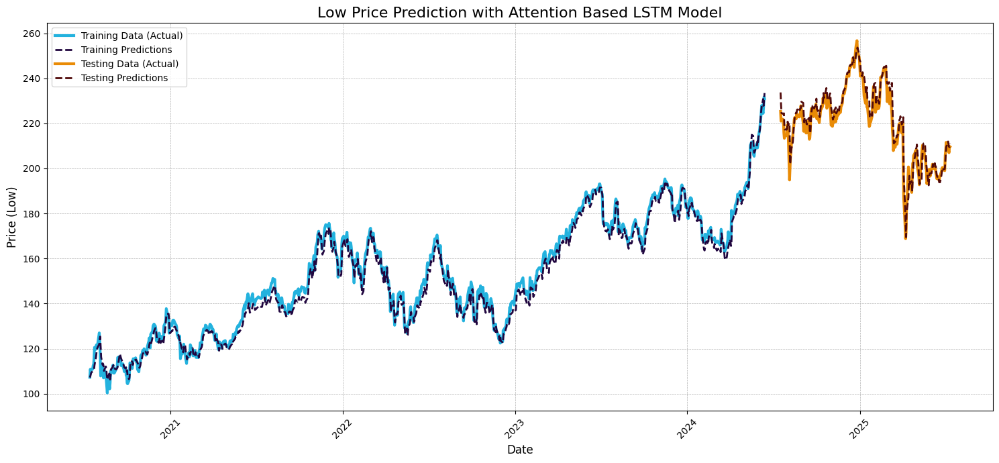

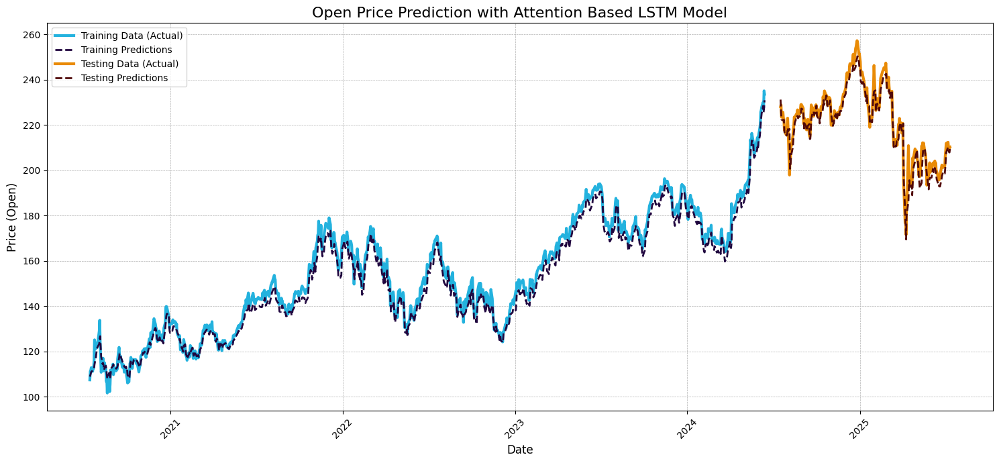

In [ ]:
original_df_for_plotting = AAPL[:]
d.plot(df=original_df_for_plotting,X_train = AAPL_X_train, y_train = AAPL_y_train, X_test = AAPL_X_test, y_test = AAPL_y_test,split_index=AAPL_index, scaler = AAPL_scaler, model = best_alstm_model, model_name='Attention Based LSTM') # The name of the model you trained

31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


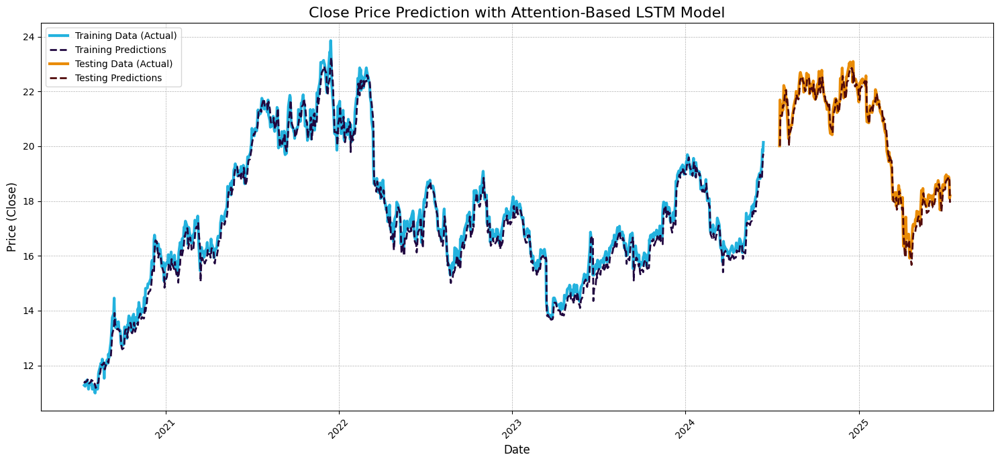

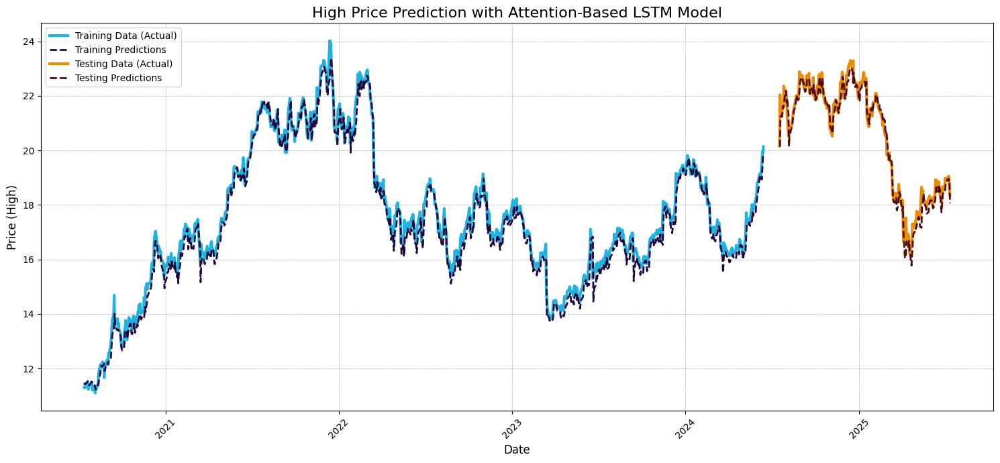

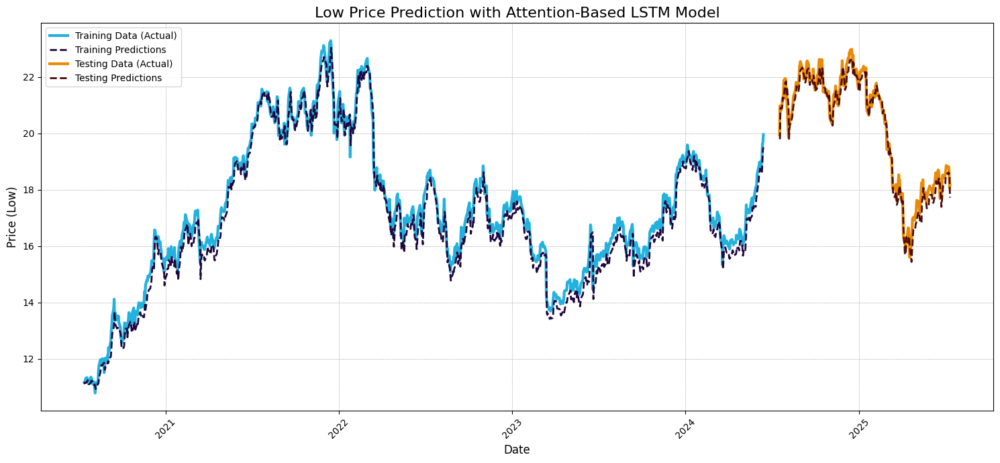

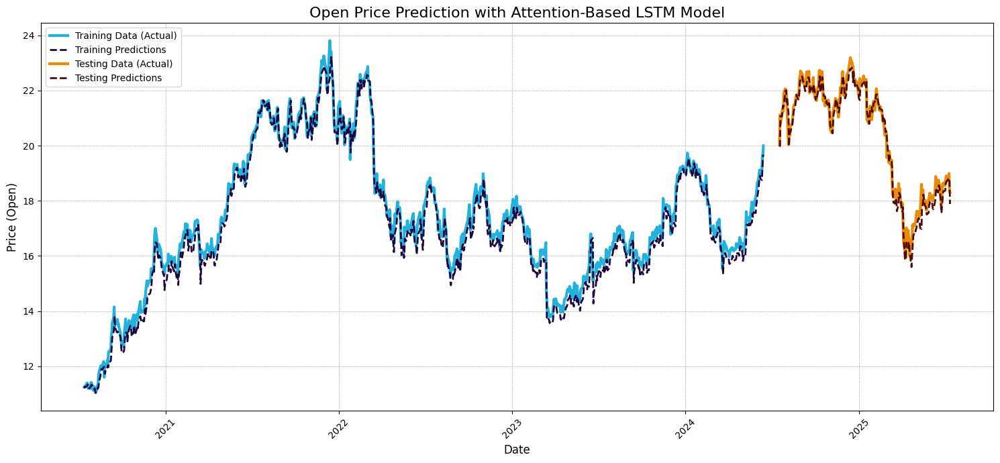

In [ ]:
original_df_for_plotting = INFY[:]
d.plot(df=original_df_for_plotting,X_train = INFY_X_train, y_train = INFY_y_train, X_test = INFY_X_test, y_test = INFY_y_test, scaler = INFY_scaler, split_index=INFY_index ,model = best_alstm_model, model_name='Attention-Based LSTM') # The name of the model you trained

31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


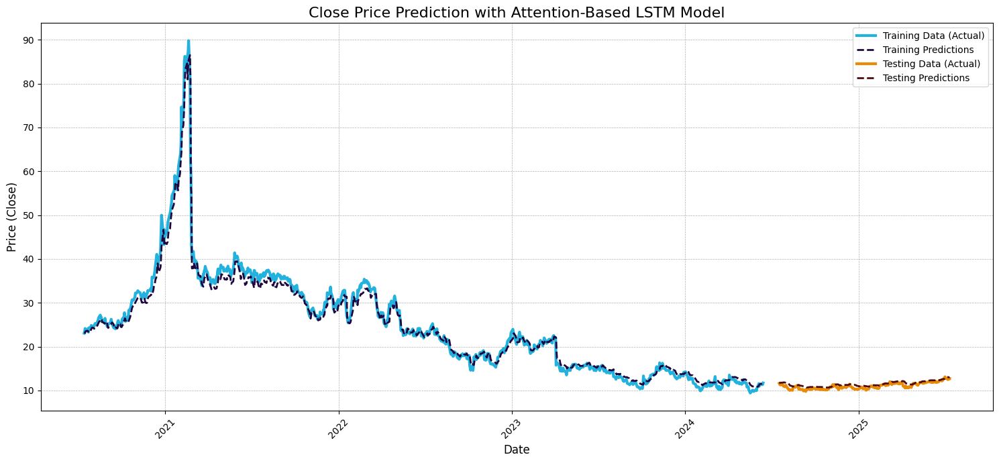

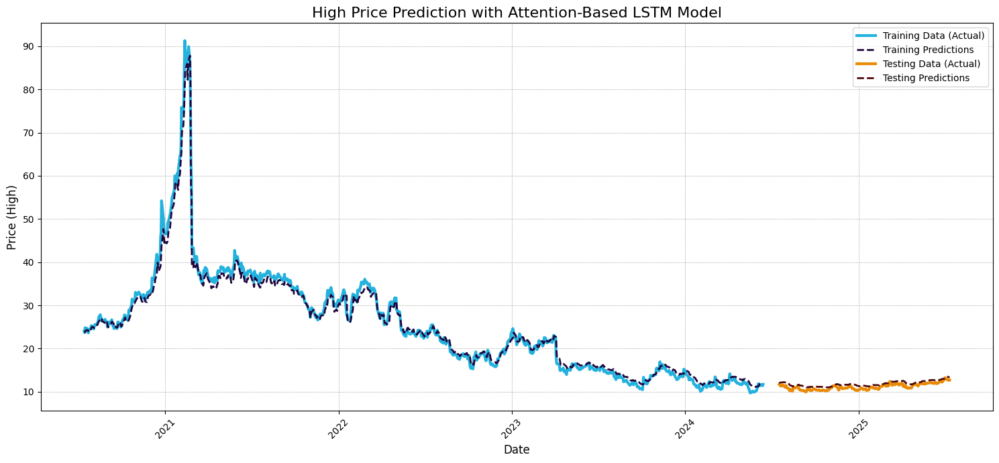

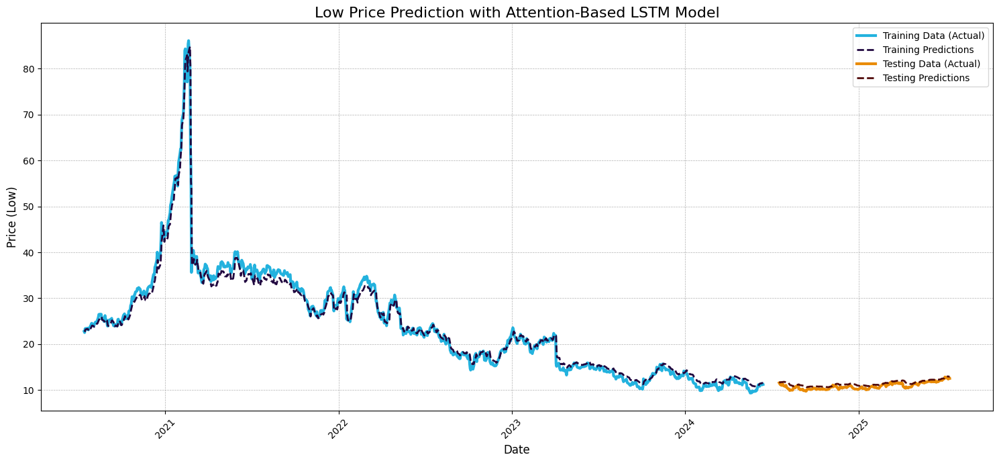

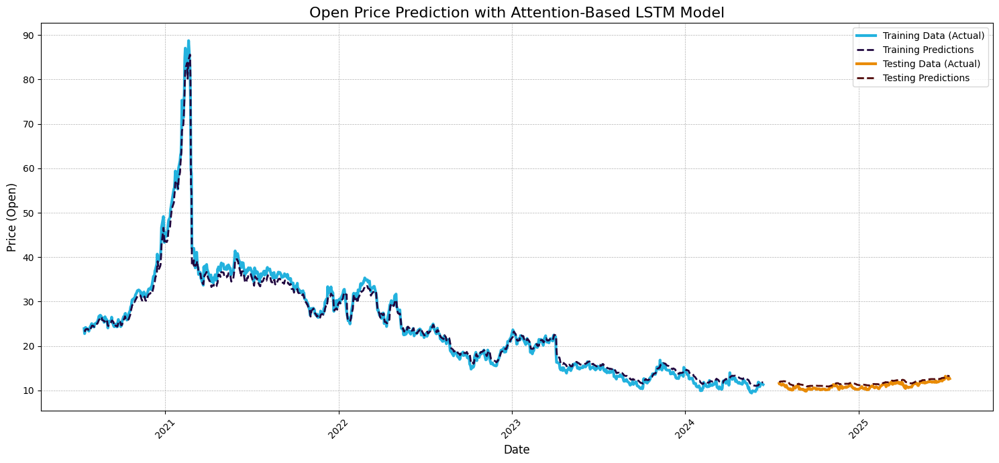

In [ ]:
original_df_for_plotting = PSKY[:]
d.plot(df=original_df_for_plotting,X_train = PSKY_X_train, y_train = PSKY_y_train, X_test = PSKY_X_test, y_test = PSKY_y_test, scaler = PSKY_scaler, model = best_alstm_model,split_index=PSKY_index, model_name='Attention-Based LSTM') # The name of the model you trained

### Save the best model

In [ ]:
best_alstm_model.save("best_attention_lstm_model.keras")

In [25]:
from keras.models import load_model
alstm = load_model("best_attention_lstm_model.keras",custom_objects={"SelfAttention": SelfAttention})

/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 16 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


### Plot Validation Sets

Apple Stocks Validation Prediction
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


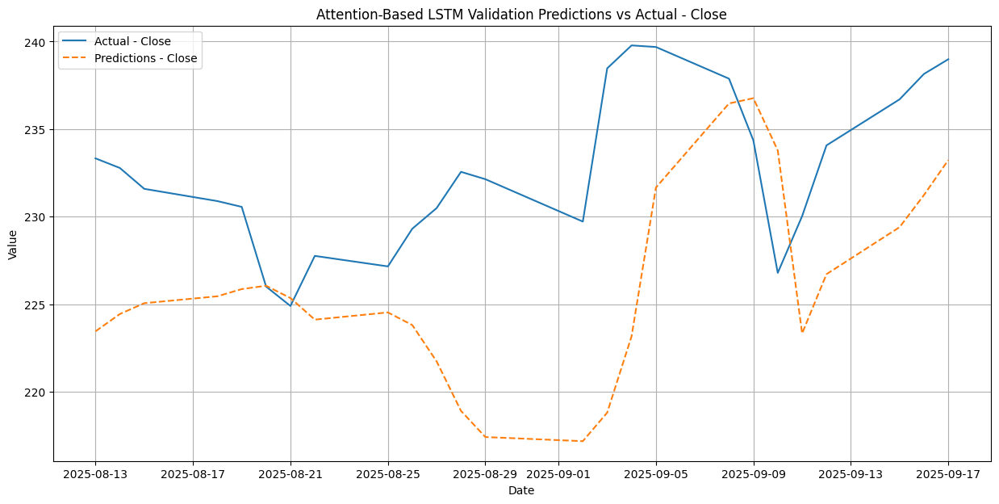

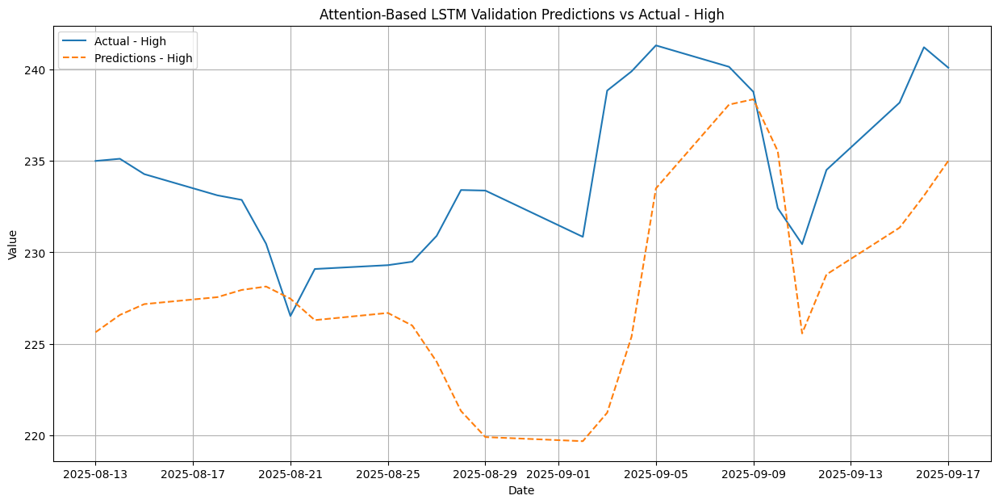

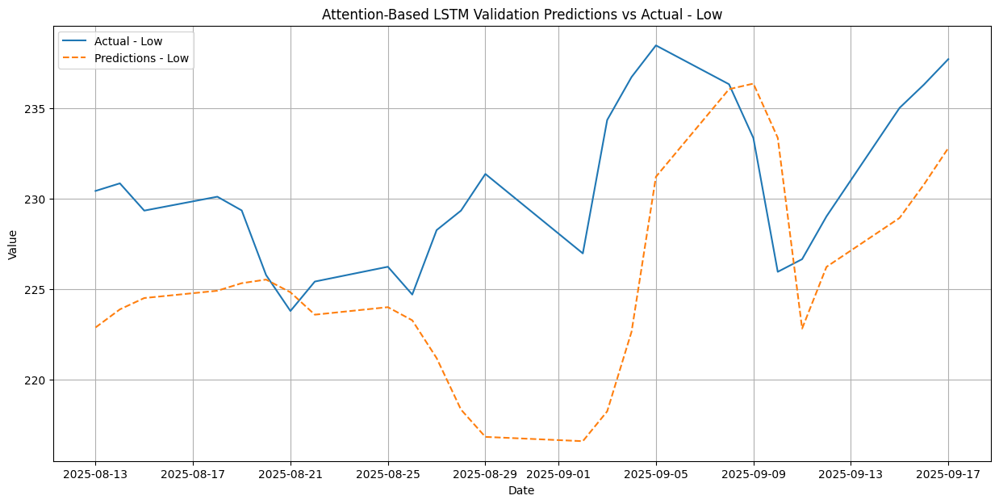

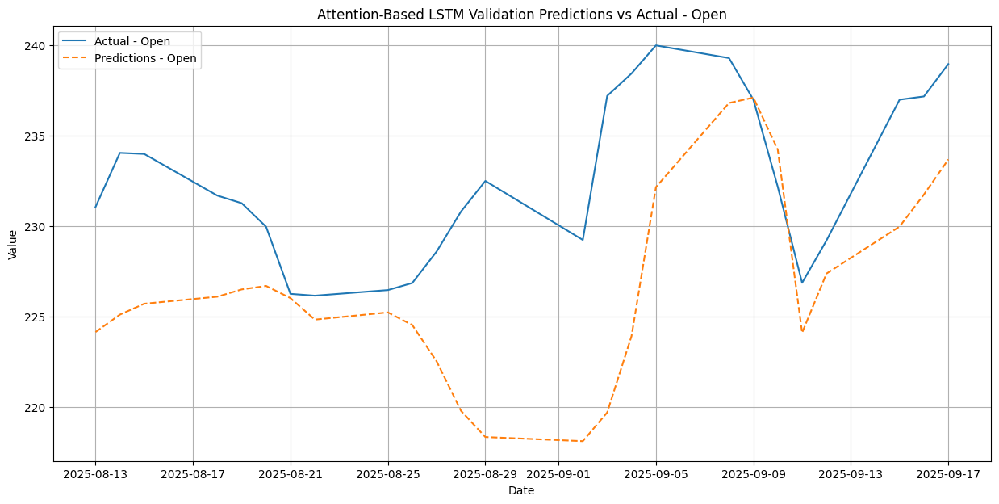

In [51]:
print("Apple Stocks Validation Prediction")
d.plot_validation(df=AAPL_val,model=alstm,X=AAPL_X_val,y=AAPL_y_val,scaler=AAPL_val_scaler,model_name="Attention-Based LSTM")

Infosys Stocks Validation Prediction
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


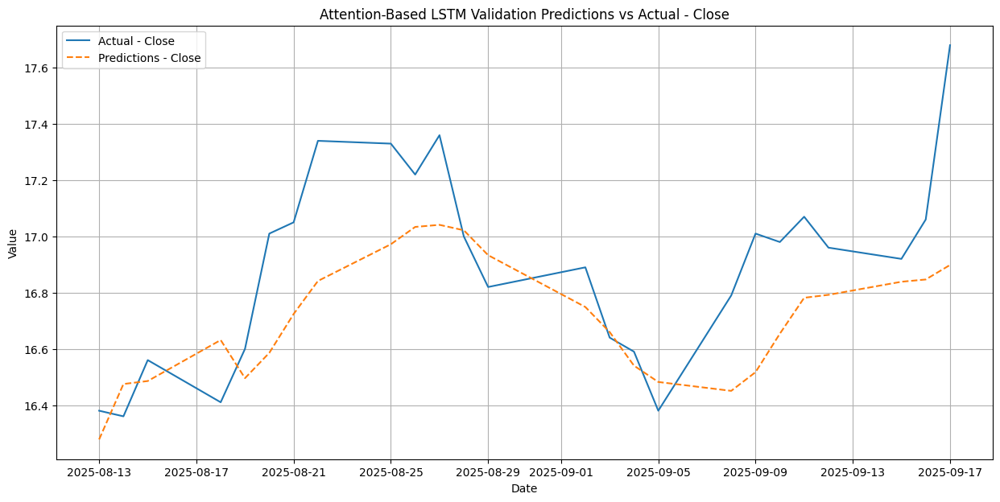

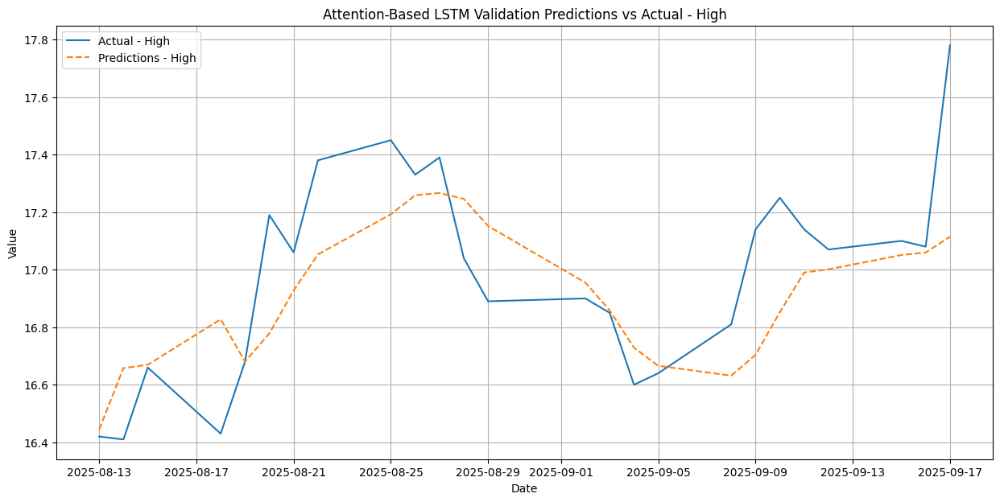

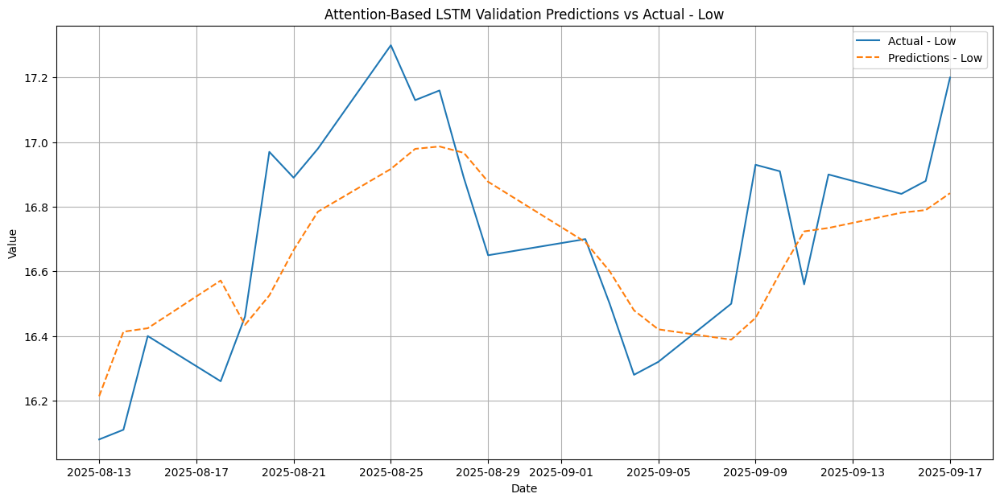

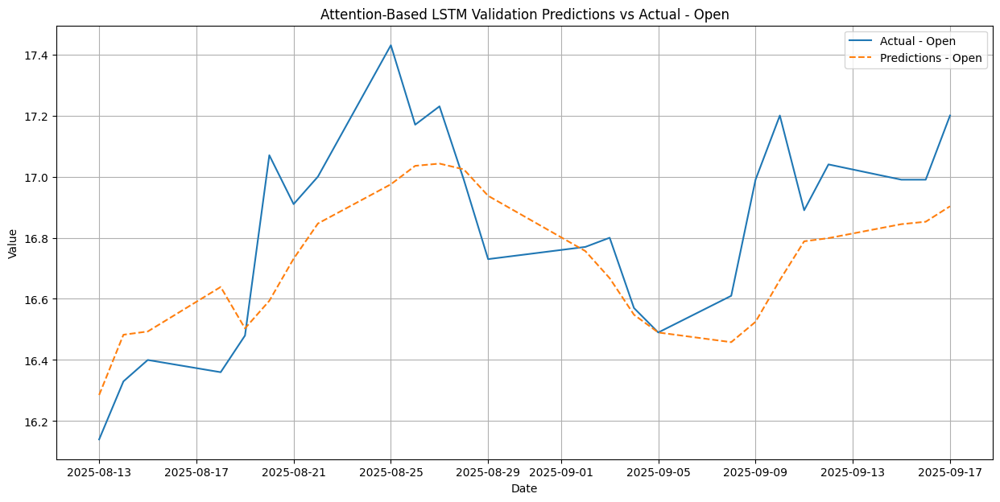

In [52]:
print("Infosys Stocks Validation Prediction")
d.plot_validation(df=INFY_val,model=alstm,X=INFY_X_val,y=INFY_y_val,scaler=INFY_val_scaler,model_name="Attention-Based LSTM")

Paramount Skydance Stocks Validation Prediction
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


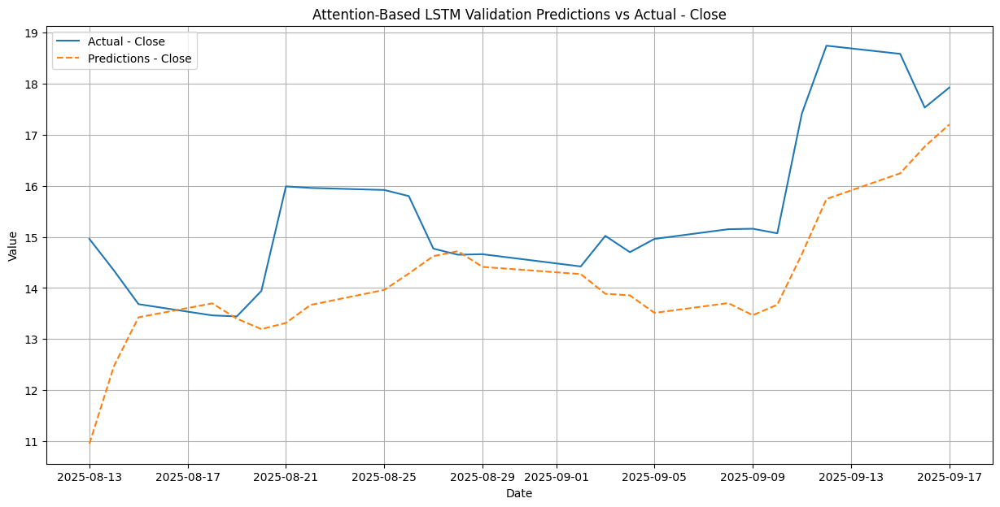

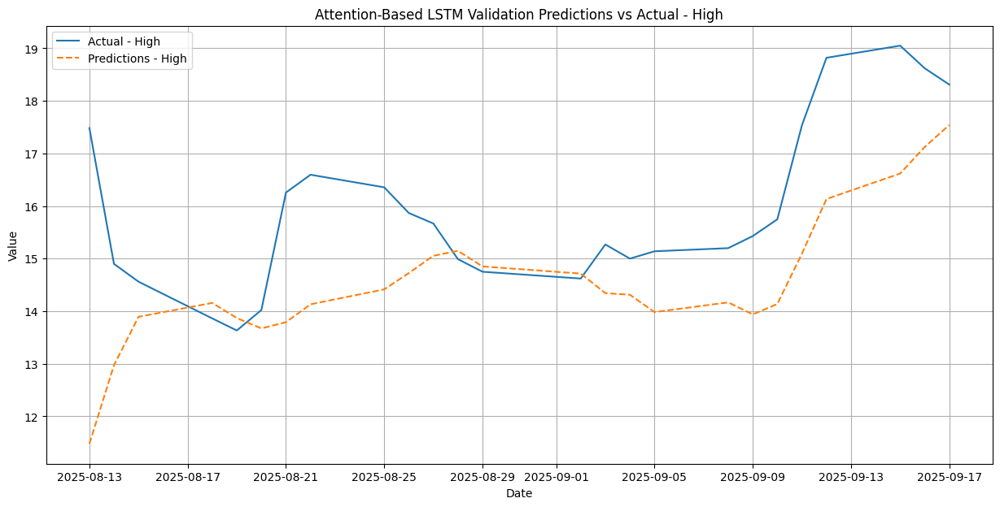

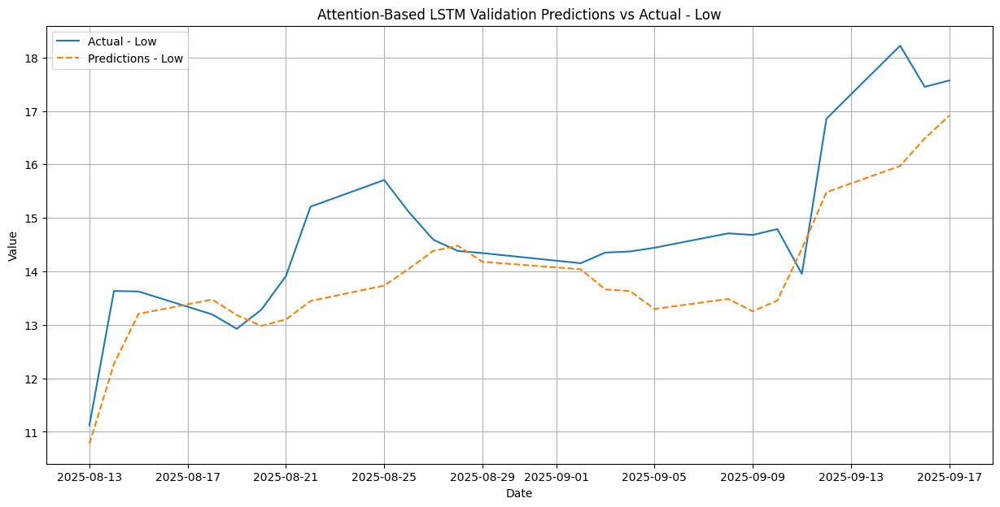

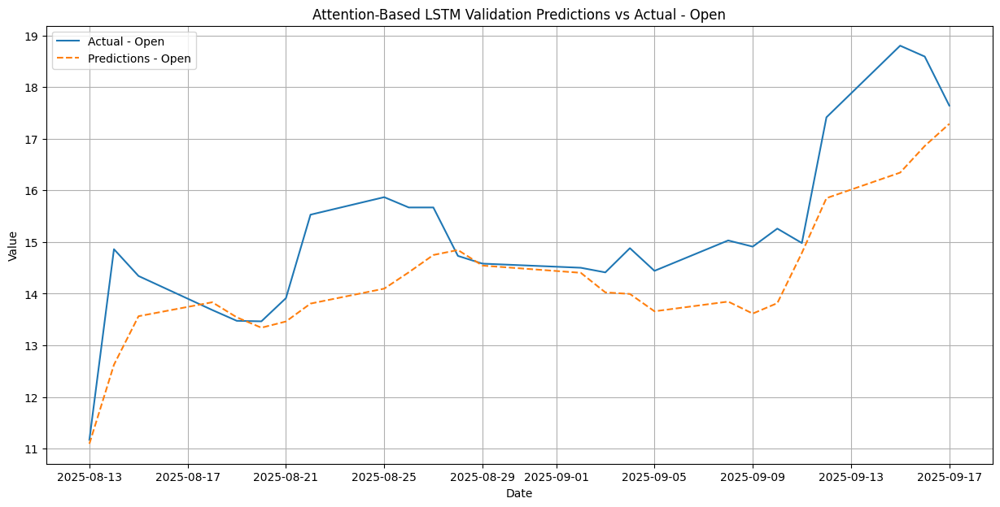

In [53]:
print("Paramount Skydance Stocks Validation Prediction")
d.plot_validation(df=PSKY_val,model=alstm,X=PSKY_X_val,y=PSKY_y_val,scaler=PSKY_val_scaler,model_name="Attention-Based LSTM")

# **Model Comparison**

In [35]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error, root_mean_squared_error
def evaluate_metrics(X,y,model,model_name=""):
  y_predict = model.predict(X)

  mae = mean_absolute_error(y, y_predict)
  mse = mean_squared_error(y, y_predict)
  rmse = root_mean_squared_error(y, y_predict)
  mape = mean_absolute_percentage_error(y, y_predict)
  r2 = r2_score(y, y_predict)
  return {"Model": model_name, "MAE":mae,"MSE":mse,"RMSE":rmse,"MAPE":mape,"R2":r2}

In [65]:
best_lstm_epoch = np.argmin(lstm_history.history['val_loss'])
best_cnnlstm_epoch = np.argmin(cnnlstm_history.history['val_loss'])
best_alstm_epoch = np.argmin(alstm_history.history['val_loss'])

In [73]:
comparison = [{"Model": "LSTM", "Train Loss": lstm_history.history['loss'][best_lstm_epoch], "Test Loss": lstm_history.history['val_loss'][best_lstm_epoch], "Train MAE": lstm_history.history['mae'][best_lstm_epoch], "Test MAE": lstm_history.history['val_mae'][best_lstm_epoch],"Train R2":lstm_history.history['r2_score'][best_lstm_epoch],"Test R2":lstm_history.history["val_r2_score"][best_lstm_epoch]},\
              {"Model": "Attention-Based LSTM", "Train Loss": alstm_history.history['loss'][best_alstm_epoch], "Test Loss": alstm_history.history['val_loss'][best_alstm_epoch], "Train MAE": alstm_history.history['mae'][best_alstm_epoch], "Test MAE": alstm_history.history['val_mae'][best_alstm_epoch], "Train R2": alstm_history.history['r2_score'][best_alstm_epoch], "Test R2": alstm_history.history['val_r2_score'][best_alstm_epoch]},\
              {"Model": "CNN LSTM", "Train Loss": cnnlstm_history.history['loss'][best_cnnlstm_epoch], "Test Loss": cnnlstm_history.history['val_loss'][best_cnnlstm_epoch], "Train MAE": cnnlstm_history.history['mae'][best_cnnlstm_epoch], "Test MAE": cnnlstm_history.history['val_mae'][best_cnnlstm_epoch], "Train R2": cnnlstm_history.history['r2_score'][best_cnnlstm_epoch], "Test R2": cnnlstm_history.history["val_r2_score"][best_cnnlstm_epoch]}]

In [74]:
comparison_df = pd.DataFrame(comparison)
comparison_df.head()

,Model,Train Loss,Test Loss,Train MAE,Test MAE,Train R2,Test R2
0,LSTM,0.002127,0.000672,0.030733,0.013199,0.960532,0.997008
1,Attention-Based LSTM,0.001851,0.000455,0.030994,0.013389,0.961400,0.996914
2,CNN LSTM,0.000748,0.000452,0.019136,0.013539,0.985636,0.997134


In [30]:
X_val = np.concatenate([AAPL_X_val,INFY_X_val,PSKY_X_val])
y_val = np.concatenate([AAPL_y_val,INFY_y_val,PSKY_y_val])

In [37]:
lstm_results = evaluate_metrics(X_val,y_val,lstm,"LSTM")
cnnlstm_results = evaluate_metrics(X_val,y_val,cnnlstm,"CNNLSTM")
alstm_results = evaluate_metrics(X_val,y_val,alstm,"Attention-Based LSTM")

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


In [38]:
comp = pd.DataFrame([lstm_results,cnnlstm_results,alstm_results])
comp

,Model,MAE,MSE,RMSE,MAPE,R2
0,LSTM,0.086739,0.015139,0.120855,0.177713,0.736202
1,CNNLSTM,0.070338,0.010285,0.098357,0.154268,0.820767
2,Attention-Based LSTM,0.129508,0.029140,0.169514,0.228873,0.492165


# **Model Robustness**

In [3]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error, root_mean_squared_error
def evaluate_metrics(X,y,model,scaler,model_name=""):
  n_features = scaler.n_features_in_
  y_predict = model.predict(X)
  y_padded = np.zeros((y.shape[0], n_features))
  y_padded[:, :4] = y
  y_predict_padded = np.zeros((y_predict.shape[0], n_features))
  y_predict_padded[:, :4] = y_predict
  y_inv = scaler.inverse_transform(y_padded)
  y_predict_inv = scaler.inverse_transform(y_predict_padded)

  mae = mean_absolute_error(y_inv, y_predict_inv)
  mse = mean_squared_error(y_inv, y_predict_inv)
  rmse = root_mean_squared_error(y_inv, y_predict_inv)
  mape = mean_absolute_percentage_error(y_inv, y_predict_inv)
  r2 = r2_score(y_inv, y_predict_inv)
  return {"Model": model_name, "MAE":mae,"MSE":mse,"RMSE":rmse,"MAPE":mape,"R2":r2}

### Evaluation of the Models on Different Market Stocks

In [6]:
A = yf.download("0P0001PR8B.BO",period = "100d")        # NIFTY SMALLCAP250
A.columns = ["Close", "High","Low","Open","Volume"]

/tmp/ipython-input-91555660.py:1: FutureWarning: YF.download() has changed argument auto_adjust default to True
  A = yf.download("0P0001PR8B.BO",period = "100d")        # NIFTY SMALLCAP250
[*********************100%***********************]  1 of 1 completed


In [11]:
d = Data(21)
X,y,scaler = d.prep_data(df=A)

3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 181ms/step


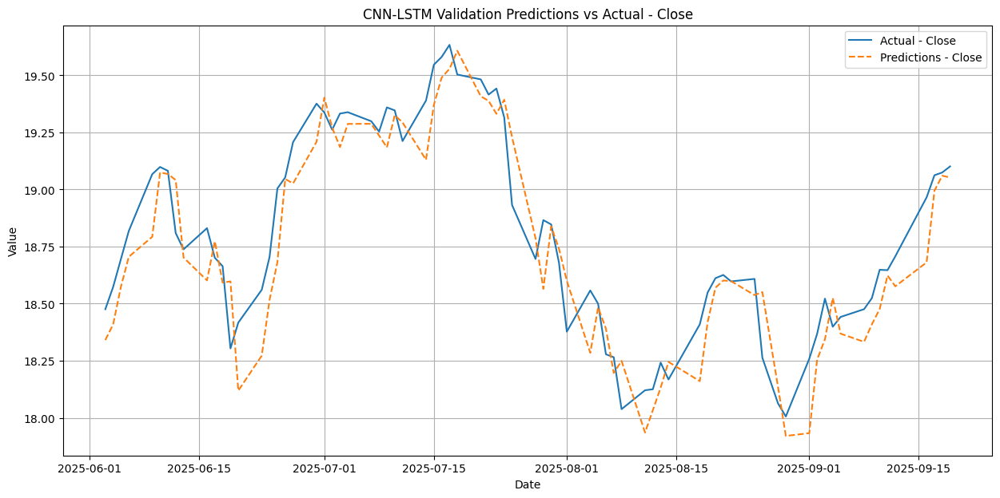

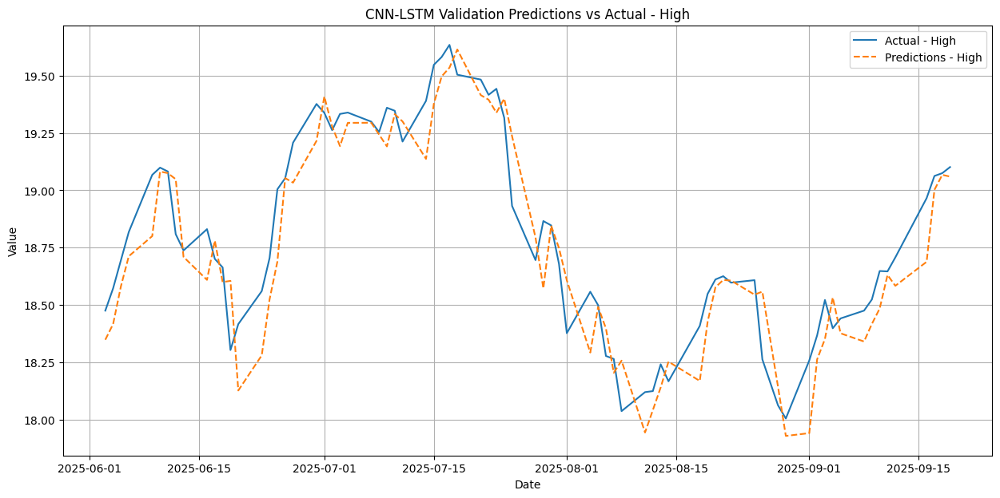

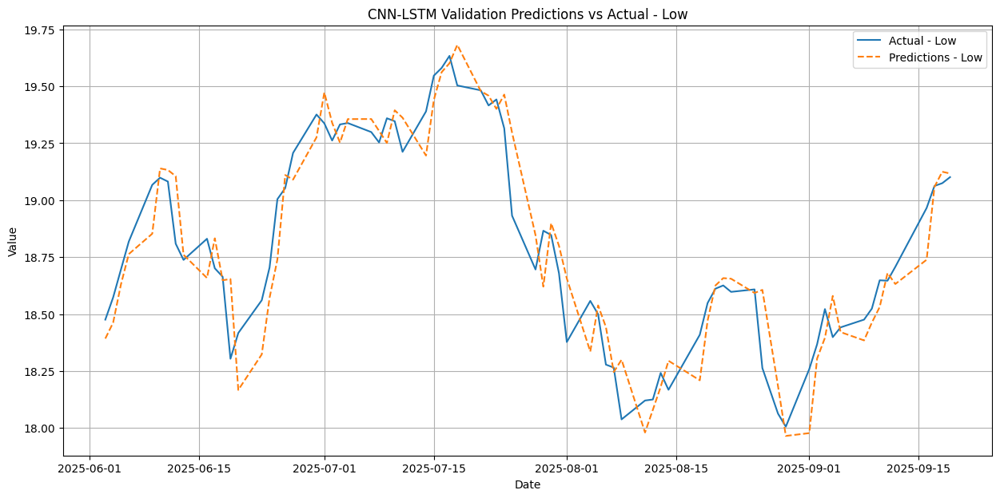

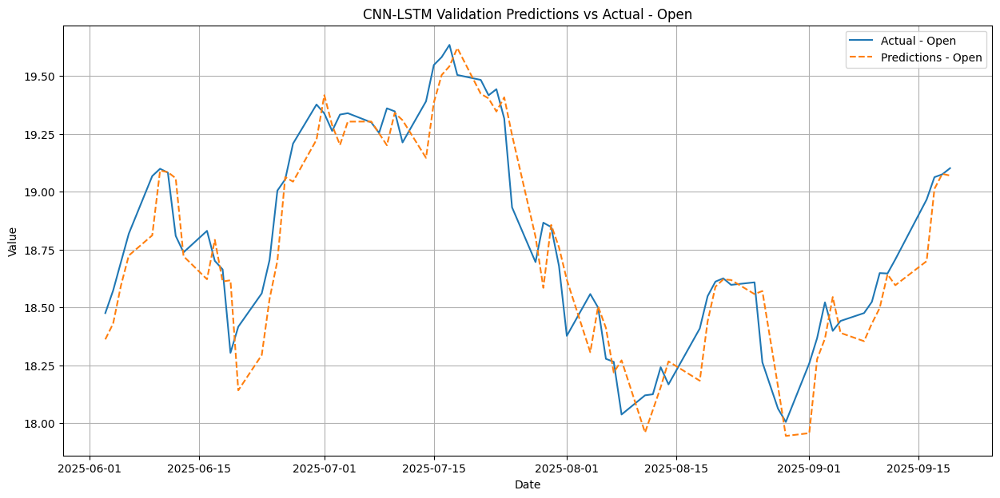

In [12]:
d.plot_validation(A,cnnlstm,X,y,scaler,model_name = "CNN-LSTM")

In [51]:
cnnlstm_results = evaluate_metrics(X,y,cnnlstm,scaler,"CNN-LSTM")

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


In [54]:
metrics = pd.DataFrame([cnnlstm_results])

In [55]:
metrics

,Model,MAE,MSE,RMSE,MAPE,R2
0,CNN-LSTM,0.097527,0.018765,0.12248,0.00521,0.900648


In [56]:
B = yf.download("0P0001NQZ6.BO",period="100d")        # NIFTY LARGEMIDCAP250
B.columns = ["Close", "High","Low","Open","Volume"]

/tmp/ipython-input-423006802.py:1: FutureWarning: YF.download() has changed argument auto_adjust default to True
  B = yf.download("0P0001NQZ6.BO",period="100d")        # NIFTY LARGEMIDCAP250
[*********************100%***********************]  1 of 1 completed


In [57]:
X,y,scaler = d.prep_data(B)

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


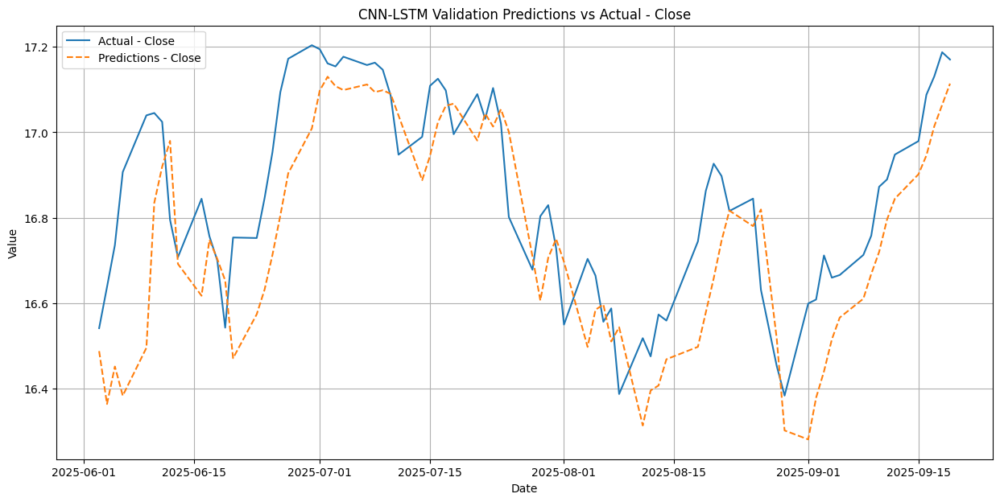

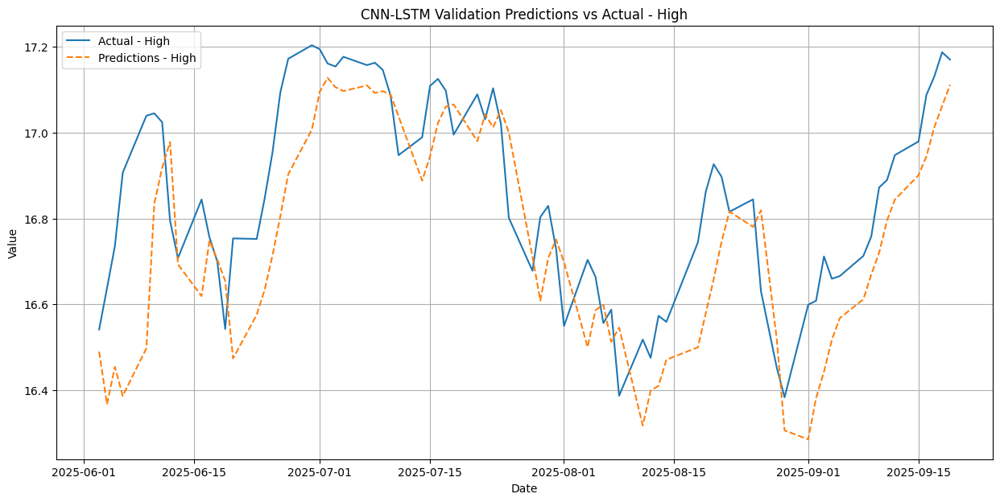

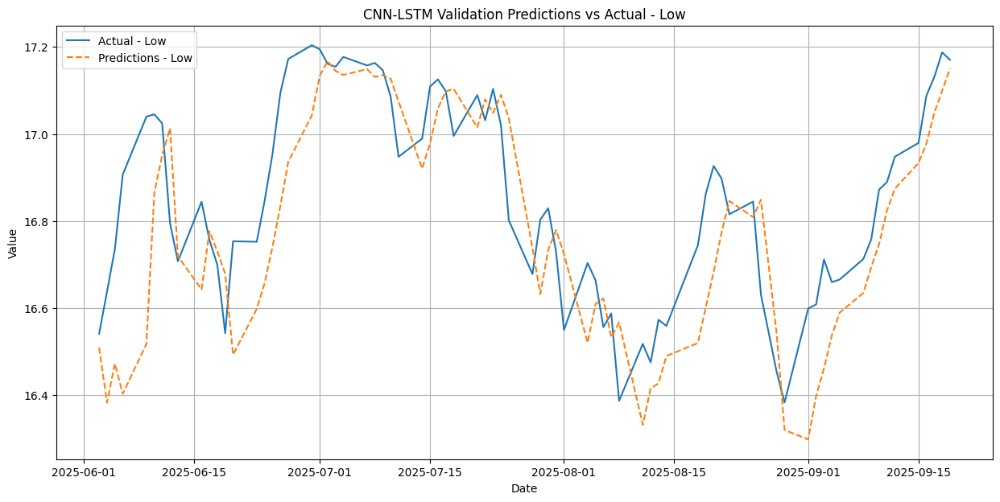

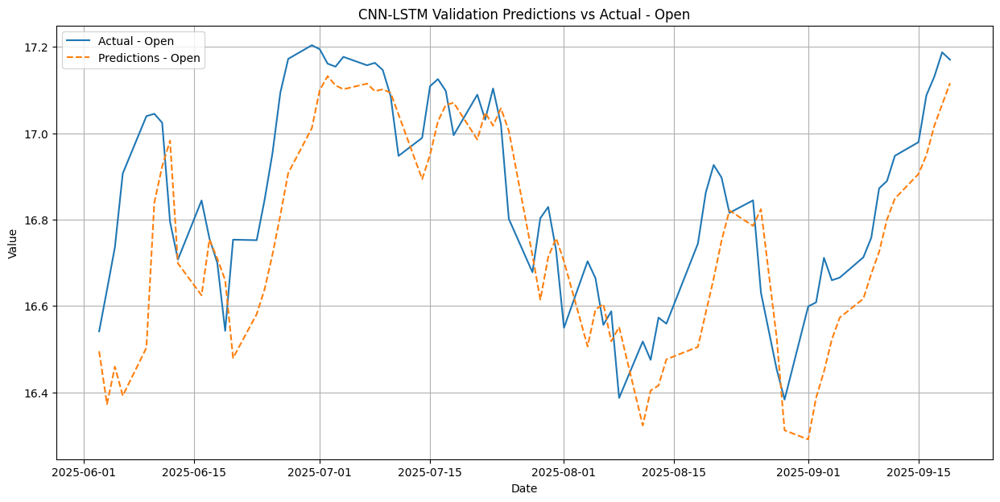

In [58]:
d.plot_validation(B,alstm,X,y,scaler,model_name = "CNN-LSTM")

In [59]:
cnnlstm_results = evaluate_metrics(X,y,cnnlstm,scaler,"CNN-LSTM")

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


In [60]:
metrics = pd.DataFrame([cnnlstm_results])

In [61]:
metrics

,Model,MAE,MSE,RMSE,MAPE,R2
0,CNN-LSTM,0.069224,0.009863,0.088809,0.004122,0.807962


In [62]:
recent_data = yf.download("^DJI", period="100d")  # Dow Jones Industrial Average
recent_data.columns = ["Close", "High","Low","Open","Volume"]

/tmp/ipython-input-1580356256.py:1: FutureWarning: YF.download() has changed argument auto_adjust default to True
  recent_data = yf.download("^DJI", period="100d")  # Dow Jones Industrial Average
[*********************100%***********************]  1 of 1 completed


In [63]:
X,y,scaler = d.prep_data(df=recent_data)

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


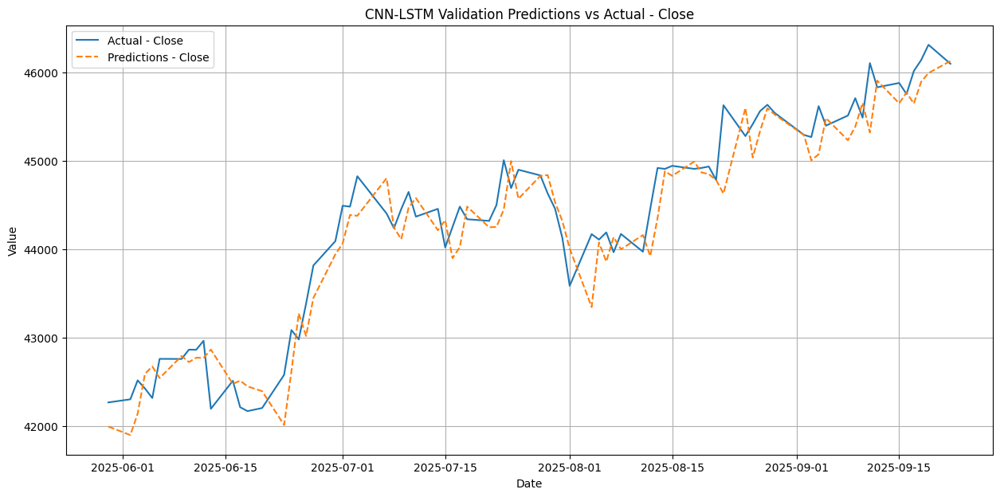

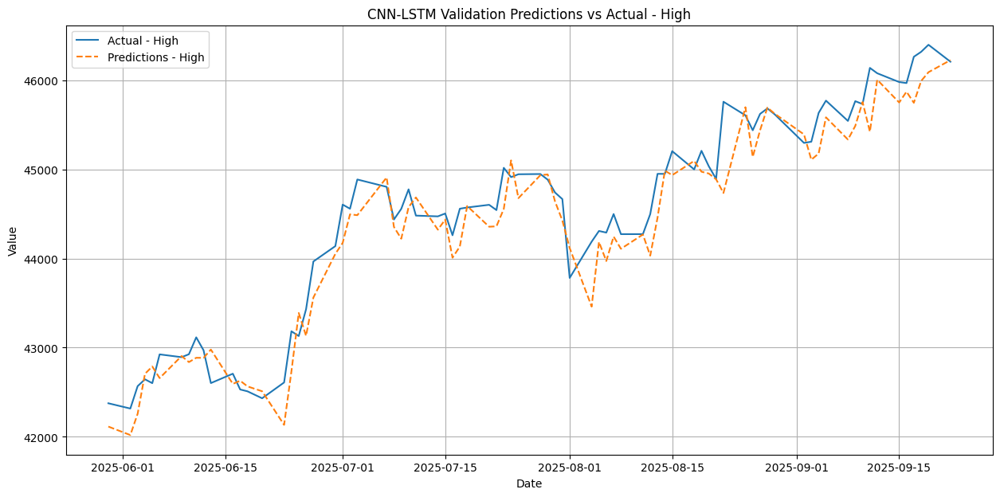

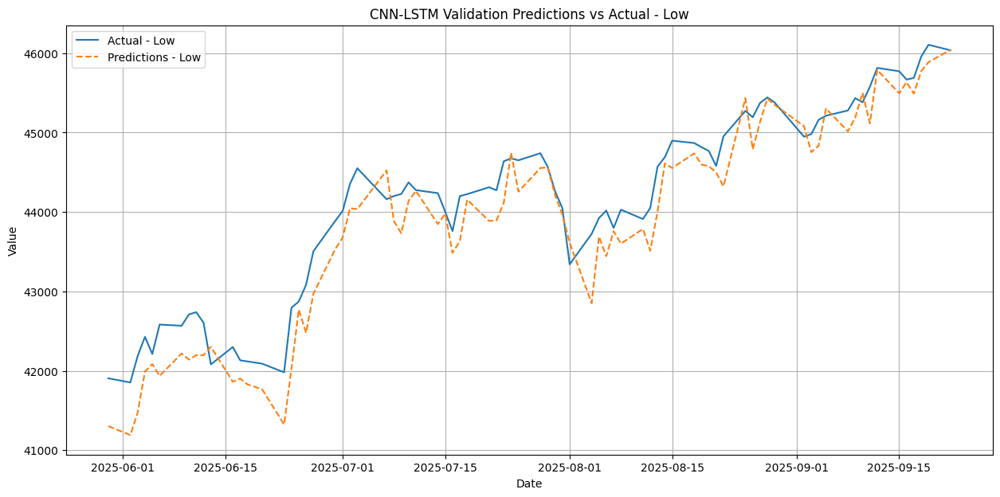

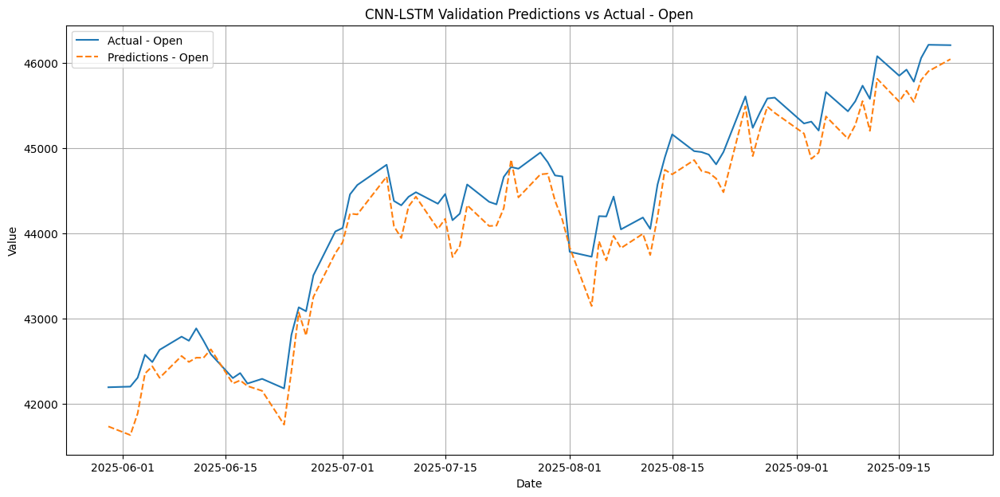

In [64]:
d.plot_validation(recent_data,cnnlstm,X,y,scaler,model_name = "CNN-LSTM")

In [65]:
cnnlstm_results = evaluate_metrics(X,y,cnnlstm,scaler,"CNN-LSTM")

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


In [66]:
metrics = pd.DataFrame([cnnlstm_results])

In [67]:
metrics

,Model,MAE,MSE,RMSE,MAPE,R2
0,CNN-LSTM,213.063376,84622.089098,258.763962,0.004824,0.936321
